<a href="https://colab.research.google.com/github/qwet11/ChessMovePrediction/blob/main/William_Moss_Released_Thesis_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Thesis Notebook

**Author:** William Moss

**School:** Kettering University

## Quick Setup

Import important packages, mount google drive, move to Thesis folder, etc.

In [ ]:
# Load Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Move to project folder
%cd /content/drive/MyDrive/Thesis/out
!pwd

/content/drive/MyDrive/Thesis/out
/content/drive/MyDrive/Thesis/out


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

In [ ]:
import pickle

def saveObj(obj: object, filepath: str) -> None:
  print(f'Saving to {filepath}')
  with open(filepath, 'wb') as fp:
    pickle.dump(obj, fp)
  print(f'Successfully saved to {filepath}')

def loadObj(filepath: str) -> object:
  print(f'Loading object from {filepath}')
  with open(filepath, "rb") as fp:
    return pickle.load(fp)

In [ ]:
from numba import cuda
def resetGPU():
  device = cuda.get_current_device()
  device.reset()

In [ ]:
from tensorflow.keras import models, utils
import os

def plotModelArchitecture(modelNames):
  import os
  if not os.path.exists('./model_plots'):
    os.makedirs('./model_plots')
  for modelName in modelNames:
    utils.plot_model(
        models.load_model(f'{modelName}.keras'),
        to_file=f'./model_plots/{modelName}.png',
        show_shapes=True,
        show_layer_activations=True)

## Method 1: Train a model to predict the move vector

### Move to Method 1 folder

In [ ]:
%cd ./method1
!pwd

/content/drive/MyDrive/Thesis/out/eric_rosen_attempt9
/content/drive/MyDrive/Thesis/out/eric_rosen_attempt9


### Get X and y from pgn

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.4 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "FICS_2000.pgn"
NUM_GAMES = 30000
NUM_TRAIN_GAMES = 24000
NUM_TEST_GAMES = 6000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 39567


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_train = [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_train.append([p, r, n, b, q, k])

    # y
    y_train.append([correctedMove.from_square, correctedMove.to_square])

saveObj(np.array(X_train), f'X_train_{NUM_GAMES}')
saveObj(np.array(y_train), f'y_train_{NUM_GAMES}')

# Same memory
del X_train
del y_train

100%|██████████| 24000/24000 [20:51<00:00, 19.18it/s]


Saving to X_train_30000
Successfully saved to X_train_30000
Saving to y_train_30000
Successfully saved to y_train_30000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_test = [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_test.append([p, r, n, b, q, k])

    # y
    y_test.append([correctedMove.from_square, correctedMove.to_square])

saveObj(np.array(X_test), f'X_test_{NUM_GAMES}')
saveObj(np.array(y_test), f'y_test_{NUM_GAMES}')

# Save memory
del X_test
del y_test

100%|██████████| 6000/6000 [05:43<00:00, 17.47it/s]


Saving to X_test_30000
Successfully saved to X_test_30000
Saving to y_test_30000
Successfully saved to y_test_30000


### Search for best model architecture

In [ ]:
X_train, y_train = loadObj('X_train_4000'), loadObj('y_train_4000')
X_test, y_test = loadObj('X_test_4000'), loadObj('y_test_4000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_4000
Loading object from y_train_4000
Loading object from X_test_4000
Loading object from y_test_4000


In [ ]:
from keras.utils import to_categorical

moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
moveVectorMap = {}
for i, moveVector in enumerate(moveVectorList):
  moveVectorMap[str(moveVector)] = i

y_train = to_categorical([moveVectorMap[f'[{moveVector[0]}, {moveVector[1]}]'] for moveVector in y_train])
y_test = to_categorical([moveVectorMap[f'[{moveVector[0]}, {moveVector[1]}]'] for moveVector in y_test])

In [ ]:
!pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 4.8 MB/s eta 0:00:00


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeMoveVectorModel(hp):
#   moveVector_model = models.Sequential()

#   # Input
#   moveVector_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))

#   # Flatten
#   moveVector_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       moveVector_model.add(layers.Dense(hp.Choice('dense1', values=[64, 128, 256, 512, 1024, 2048, 4032, 5096]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       moveVector_model.add(layers.Dense(hp.Choice('dense2', values=[64, 128, 256, 512, 1024, 2048, 4032, 5096]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       moveVector_model.add(layers.Dense(hp.Choice('dense3', values=[64, 128, 256, 512, 1024, 2048, 4032, 5096]), activation='relu'))

#   # Output
#   moveVector_model.add(layers.Dense(4032, activation='softmax'))

#   moveVector_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

#   return moveVector_model


# tuner = kt.Hyperband(makeMoveVectorModel,
#                      objective='val_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='moveVectorModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(X_train, y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Reloading Tuner from Tuner/moveVectorModel_tuner_attempt1/tuner0.json


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/moveVectorModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_categorical_accuracy", direction="max")

Trial 0127 summary
Hyperparameters:
filter1: 128
kernel1: 3
filter2: 128
kernel2: 3
filter3: 16
kernel3: 2
denseNum: 1
dense1: 128
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0100
Score: 0.21923309564590454

Trial 0177 summary
Hyperparameters:
filter1: 64
kernel1: 3
filter2: 64
kernel2: 2
filter3: 16
kernel3: 2
denseNum: 1
dense1: 128
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 3
tuner/round: 1
tuner/trial_id: 0154
Score: 0.210940882563591

Trial 0175 summary
Hyperparameters:
filter1: 128
kernel1: 3
filter2: 32
kernel2: 2
filter3: 64
kernel3: 3
denseNum: 1
dense1: 128
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 3
tuner/round: 1
tuner/trial_id: 0147
Score: 0.21004068851470947

Trial 0180 summary
Hyperparameters:
filter1: 64
kernel1: 3
filter2: 32
kernel2: 2
filter3: 32
kernel3

### Train and test model

In [ ]:
X_train, y_train = loadObj('X_train_30000'), loadObj('y_train_30000')
X_test, y_test = loadObj('X_test_30000'), loadObj('y_test_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_30000
Loading object from y_train_30000
Loading object from X_test_30000
Loading object from y_test_30000


In [ ]:
from keras.utils import to_categorical

moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
moveVectorMap = {}
for i, moveVector in enumerate(moveVectorList):
  moveVectorMap[str(moveVector)] = i

y_train = to_categorical([moveVectorMap[f'[{moveVector[0]}, {moveVector[1]}]'] for moveVector in y_train])
y_test = to_categorical([moveVectorMap[f'[{moveVector[0]}, {moveVector[1]}]'] for moveVector in y_test])

In [ ]:
# Save memory
del moveVectorList
del moveVectorMap

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

moveVector_model = models.Sequential()
moveVector_model.add(layers.Conv2D(filters=128, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
moveVector_model.add(layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
moveVector_model.add(layers.Conv2D(filters=16, kernel_size=2, activation='relu', padding='same', data_format='channels_first'))
moveVector_model.add(layers.Flatten())
moveVector_model.add(layers.Dense(128, activation='relu'))
moveVector_model.add(layers.Dense(4032, activation='softmax'))

moveVector_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['categorical_accuracy', 'top_k_categorical_accuracy'])
moveVector_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 8, 8)         7040      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 8, 8)         147584    
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 8, 8)          8208      
                                                                 
 flatten (Flatten)           (None, 1024)              0         
                                                                 
 dense (Dense)               (None, 128)               131200    
                                                                 
 dense_1 (Dense)             (None, 4032)              520128    
                                                                 
Total params: 814160 (3.11 MB)
Trainable params: 814160 

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_categorical_accuracy',
    restore_best_weights=True,
)

from tensorflow.keras.utils import Sequence
import numpy as np

# Due to the large size of X and y, I had to use a generator
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

moveVector_model.fit(
  DataGenerator(X_train, y_train, 250),
  validation_data=DataGenerator(X_test, y_test, 250),
  callbacks=[earlyStopping],
  epochs=50,
  verbose=1,
)
moveVector_model.save('moveVector_model.keras')

Epoch 1/50
7639/7639 [==============================] - 67s 8ms/step - loss: 3.6163 - categorical_accuracy: 0.2040 - top_k_categorical_accuracy: 0.4781 - val_loss: 3.0634 - val_categorical_accuracy: 0.2568 - val_top_k_categorical_accuracy: 0.5721
Epoch 2/50
7639/7639 [==============================] - 63s 8ms/step - loss: 2.9236 - categorical_accuracy: 0.2771 - top_k_categorical_accuracy: 0.6023 - val_loss: 2.8787 - val_categorical_accuracy: 0.2793 - val_top_k_categorical_accuracy: 0.6073
Epoch 3/50
7639/7639 [==============================] - 64s 8ms/step - loss: 2.7650 - categorical_accuracy: 0.2995 - top_k_categorical_accuracy: 0.6354 - val_loss: 2.8119 - val_categorical_accuracy: 0.2931 - val_top_k_categorical_accuracy: 0.6290
Epoch 4/50
7639/7639 [==============================] - 64s 8ms/step - loss: 2.6681 - categorical_accuracy: 0.3128 - top_k_categorical_accuracy: 0.6568 - val_loss: 2.7254 - val_categorical_accuracy: 0.3029 - val_top_k_categorical_accuracy: 0.6436
Epoch 5/50
7

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.5 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictMoveVector(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]

  moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
  moveVectorMap = {}
  for i, moveVector in enumerate(moveVectorList):
    moveVectorMap[i] = moveVector

  zipped = sorted(list(zip(pred, [i for i in range(4032)])), reverse=True)
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    fromSq, toSq = moveVectorMap[i]
    print(chess.Move(fromSq, toSq), pred[i], (fromSq, toSq))
    rank += 1

  display(correctedBoard)

1/1 [==============================] - 0s 200ms/step
e2e4 0.49774754 (12, 28)
d2d4 0.30504096 (11, 27)
g1f3 0.047283325 (6, 21)
c2c4 0.038169578 (10, 26)
g2g3 0.022293864 (14, 22)


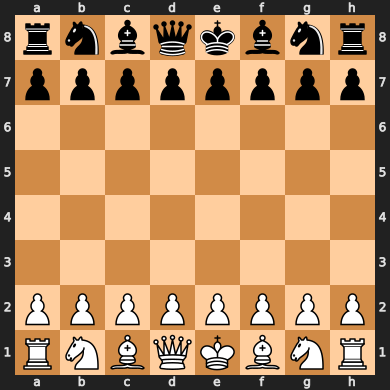

In [ ]:
predictMoveVector(moveVector_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 21ms/step
d2d3 0.48792666 (11, 19)
f3g5 0.14491913 (21, 38)
d2d4 0.08521176 (11, 27)
e1g1 0.083413295 (4, 6)
b1c3 0.08009547 (1, 18)


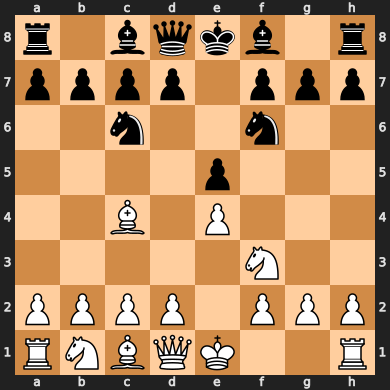

In [ ]:
predictMoveVector(moveVector_model, 'r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

1/1 [==============================] - 0s 22ms/step
f1d1 0.36631924 (5, 3)
e5f3 0.17546177 (36, 21)
d5e7 0.12318182 (35, 52)
e5g4 0.11529561 (36, 30)
e5f7 0.08232265 (36, 53)


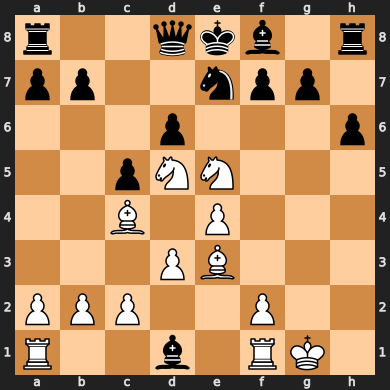

In [ ]:
predictMoveVector(moveVector_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 22ms/step
f6f7 0.4973265 (45, 53)
g7g8 0.325141 (54, 62)
c5b5 0.046442457 (34, 33)
c5c4 0.04535831 (34, 26)
c5d5 0.016211547 (34, 35)


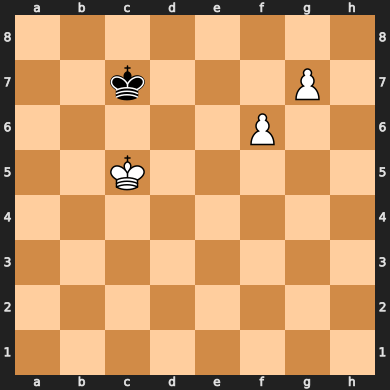

In [ ]:
predictMoveVector(moveVector_model, '8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 21ms/step
c2d2 0.43200836 (10, 11)
c2b2 0.31839722 (10, 9)
c2d1 0.032189593 (10, 3)
c2c1 0.030014075 (10, 2)
c2b1 0.018353956 (10, 1)


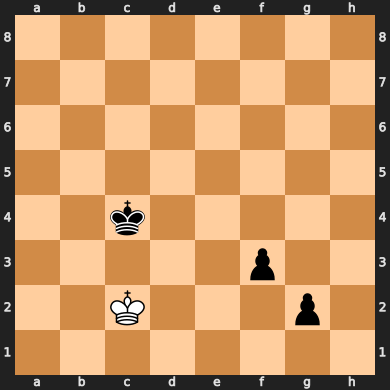

In [ ]:
predictMoveVector(moveVector_model, '8/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 21ms/step
f6f7 0.3950979 (45, 53)
g7g8 0.36037803 (54, 62)
c5c4 0.072432965 (34, 26)
c5b5 0.05302544 (34, 33)
c5d4 0.019201025 (34, 27)


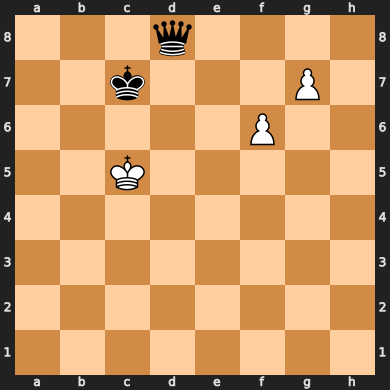

In [ ]:
predictMoveVector(moveVector_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 21ms/step
d1d2 0.2257937 (3, 11)
d1c1 0.11584972 (3, 2)
d1d3 0.114871025 (3, 19)
d1b1 0.083209485 (3, 1)
d1d8 0.08108621 (3, 59)


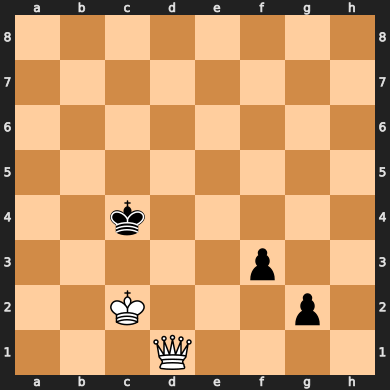

In [ ]:
predictMoveVector(moveVector_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPredictions(fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = moveVector_model.predict(X, verbose=False)[0]

  moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
  moveVectorMap = {}
  for i, moveVector in enumerate(moveVectorList):
    moveVectorMap[i] = moveVector

  zipped = sorted(list(zip(pred, [i for i in range(4032)])), reverse=True)
  predictions = []
  for _, i in zipped:
    fromSq, toSq = moveVectorMap[i]
    predictions.append(chess.Move(fromSq, toSq))

  return predictions

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.3085
Top 5 Accuracy: 0.5532
Top 10 Accuracy: 0.7021
Top 20 Accuracy: 0.8511


### Get X and y from Eric_Rosen

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 1.8 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "lichess_EricRosen_2023-05-01.pgn"
PLAYER_USERNAME = 'EricRosen'
NUM_GAMES = 30000
NUM_TRAIN_GAMES = 24000
NUM_TEST_GAMES = 6000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 30906


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_train = [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_train.append([p, r, n, b, q, k])

    # y
    y_train.append([correctedMove.from_square, correctedMove.to_square])

saveObj(np.array(X_train), f'X_train_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_train), f'y_train_EricRosen_{NUM_GAMES}')

# Same memory
del X_train
del y_train

100%|██████████| 24000/24000 [19:46<00:00, 20.23it/s]


Saving to X_train_EricRosen_30000
Successfully saved to X_train_EricRosen_30000
Saving to y_train_EricRosen_30000
Successfully saved to y_train_EricRosen_30000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_test = [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_test.append([p, r, n, b, q, k])

    # y
    y_test.append([correctedMove.from_square, correctedMove.to_square])

saveObj(np.array(X_test), f'X_test_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_test), f'y_test_EricRosen_{NUM_GAMES}')

# Save memory
del X_test
del y_test

100%|██████████| 6000/6000 [04:38<00:00, 21.54it/s]


Saving to X_test_EricRosen_30000
Successfully saved to X_test_EricRosen_30000
Saving to y_test_EricRosen_30000
Successfully saved to y_test_EricRosen_30000


### Finetune model to Eric_Rosen

In [ ]:
X_train, y_train = loadObj('X_train_EricRosen_30000'), loadObj('y_train_EricRosen_30000')
X_test, y_test = loadObj('X_test_EricRosen_30000'), loadObj('y_test_EricRosen_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_EricRosen_30000
Loading object from y_train_EricRosen_30000
Loading object from X_test_EricRosen_30000
Loading object from y_test_EricRosen_30000


In [ ]:
from keras.utils import to_categorical

moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
moveVectorMap = {}
for i, moveVector in enumerate(moveVectorList):
  moveVectorMap[str(moveVector)] = i

y_train = to_categorical([moveVectorMap[f'[{moveVector[0]}, {moveVector[1]}]'] for moveVector in y_train])
y_test = to_categorical([moveVectorMap[f'[{moveVector[0]}, {moveVector[1]}]'] for moveVector in y_test])

In [ ]:
# Save memory
del moveVectorList
del moveVectorMap

In [ ]:
from tensorflow.keras import models, callbacks

moveVector_model = models.load_model('moveVector_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_categorical_accuracy',
    restore_best_weights=True,
)

from tensorflow.keras.utils import Sequence
import numpy as np

# Due to the large size of X and y, I had to use a generator
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

moveVector_model.fit(
  DataGenerator(X_train, y_train, 250),
  validation_data=DataGenerator(X_test, y_test, 250),
  callbacks=[earlyStopping],
  epochs=50,
  verbose=1,
)
moveVector_model.save('moveVector_EricRosen_model.keras')

Epoch 1/50
4030/4030 [==============================] - 41s 9ms/step - loss: 2.6409 - categorical_accuracy: 0.3326 - top_k_categorical_accuracy: 0.6763 - val_loss: 2.5338 - val_categorical_accuracy: 0.3367 - val_top_k_categorical_accuracy: 0.6919
Epoch 2/50
4030/4030 [==============================] - 34s 8ms/step - loss: 2.5739 - categorical_accuracy: 0.3474 - top_k_categorical_accuracy: 0.6878 - val_loss: 2.5299 - val_categorical_accuracy: 0.3418 - val_top_k_categorical_accuracy: 0.6909
Epoch 3/50
4030/4030 [==============================] - 33s 8ms/step - loss: 2.5361 - categorical_accuracy: 0.3550 - top_k_categorical_accuracy: 0.6959 - val_loss: 2.5428 - val_categorical_accuracy: 0.3443 - val_top_k_categorical_accuracy: 0.6926
Epoch 4/50
4030/4030 [==============================] - 32s 8ms/step - loss: 2.4786 - categorical_accuracy: 0.3613 - top_k_categorical_accuracy: 0.7041 - val_loss: 2.5054 - val_categorical_accuracy: 0.3458 - val_top_k_categorical_accuracy: 0.6938
Epoch 5/50
4

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.7 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictMoveVector(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]

  moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
  moveVectorMap = {}
  for i, moveVector in enumerate(moveVectorList):
    moveVectorMap[i] = moveVector

  zipped = sorted(list(zip(pred, [i for i in range(4032)])), reverse=True)
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    fromSq, toSq = moveVectorMap[i]
    print(chess.Move(fromSq, toSq), pred[i], (fromSq, toSq))
    rank += 1

  display(correctedBoard)

1/1 [==============================] - 0s 205ms/step
d2d4 0.67729807 (11, 27)
e2e4 0.2606758 (12, 28)
c2c4 0.018948521 (10, 26)
d2d3 0.015578782 (11, 19)
b1c3 0.0042758016 (1, 18)


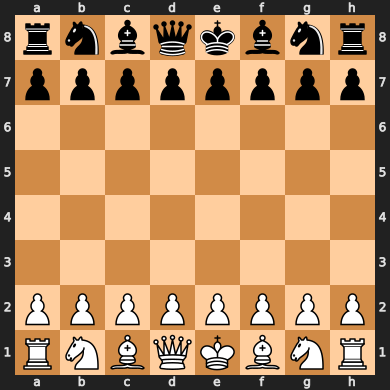

In [ ]:
predictMoveVector(moveVector_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 19ms/step
d2d4 0.38570997 (11, 27)
f3g5 0.25082546 (21, 38)
d2d3 0.16020499 (11, 19)
e1g1 0.07466612 (4, 6)
b1c3 0.03221558 (1, 18)


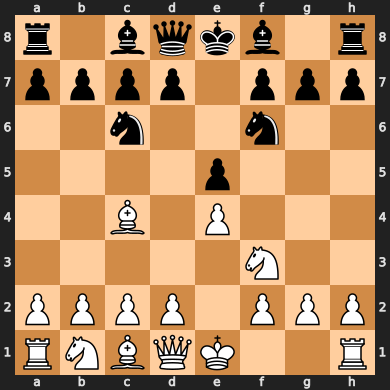

In [ ]:
predictMoveVector(moveVector_model, 'r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

1/1 [==============================] - 0s 20ms/step
e5f7 0.64387375 (36, 53)
f1d1 0.15949218 (5, 3)
a1d1 0.10539859 (0, 3)
e5f3 0.020551268 (36, 21)
e5g4 0.014815177 (36, 30)


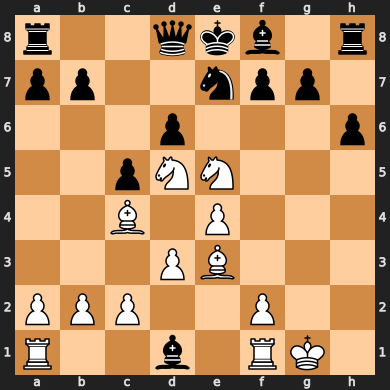

In [ ]:
predictMoveVector(moveVector_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 19ms/step
g7g8 0.56593055 (54, 62)
f6f7 0.36403438 (45, 53)
c5d5 0.017995236 (34, 35)
c5b5 0.01641989 (34, 33)
c5b4 0.01439354 (34, 25)


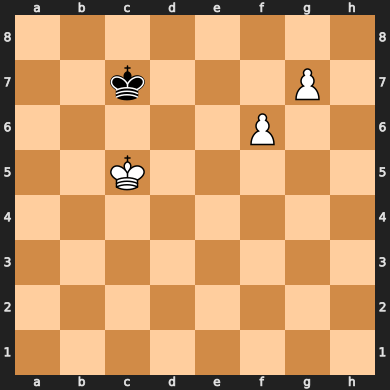

In [ ]:
predictMoveVector(moveVector_model, '8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 20ms/step
c2d2 0.5556842 (10, 11)
c2b2 0.26052344 (10, 9)
c2d1 0.05551606 (10, 3)
c2b1 0.023315508 (10, 1)
c2c3 0.014103642 (10, 18)


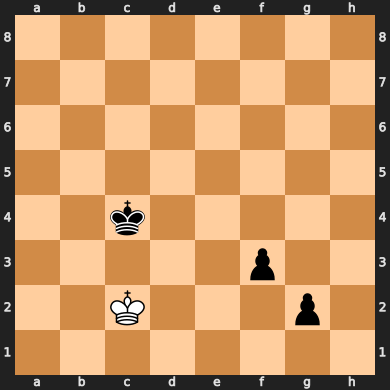

In [ ]:
predictMoveVector(moveVector_model, '8/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 20ms/step
g7g8 0.5274513 (54, 62)
f6f7 0.2971402 (45, 53)
c5b4 0.043150738 (34, 25)
c5b5 0.03572958 (34, 33)
c5d5 0.023178836 (34, 35)


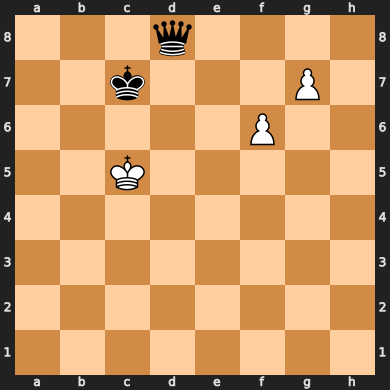

In [ ]:
predictMoveVector(moveVector_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 20ms/step
d1d2 0.39402455 (3, 11)
c2d2 0.084721126 (10, 11)
d1c1 0.0829811 (3, 2)
d1d4 0.054540046 (3, 27)
c2b2 0.053149965 (10, 9)


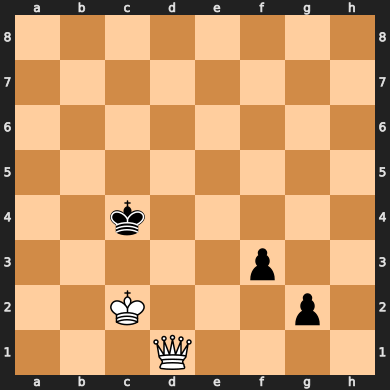

In [ ]:
predictMoveVector(moveVector_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPredictions(fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = moveVector_model.predict(X, verbose=False)[0]

  moveVectorList = [[fromSq, toSq] for fromSq in range(64) for toSq in range(64) if fromSq != toSq]
  moveVectorMap = {}
  for i, moveVector in enumerate(moveVectorList):
    moveVectorMap[i] = moveVector

  zipped = sorted(list(zip(pred, [i for i in range(4032)])), reverse=True)
  predictions = []
  for _, i in zipped:
    fromSq, toSq = moveVectorMap[i]
    predictions.append(chess.Move(fromSq, toSq))

  return predictions

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.2447
Top 5 Accuracy: 0.6489
Top 10 Accuracy: 0.7766
Top 20 Accuracy: 0.8723


In [ ]:
import chess.pgn

targetUsername = 'EricRosen'
correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)

  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if playerColor != board.turn:
      continue

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.2979
Top 5 Accuracy: 0.7021
Top 10 Accuracy: 0.8298
Top 20 Accuracy: 0.8936


### Test model with 1000 recent games

In [ ]:
!pip install python-lichess
!pip install chess

In [ ]:
import chess.pgn
import lichess.api
from tqdm import tqdm
from lichess.format import PYCHESS
from tensorflow.keras import models, callbacks

moveVector_model = models.load_model('moveVector_model.keras')

targetUsername = 'EricRosen'
gamesSince2024 = [game for game in lichess.api.user_games(targetUsername, max=1000, format=PYCHESS, since=1704085200000, auth='lip_K8zvEJO0bakiukMxtSSx')]

correct_EricRosen = top5Correct_EricRosen = top10Correct_EricRosen = top20Correct_EricRosen = total_EricRosen = 0
correct = top5Correct = top10Correct = top20Correct = total = 0

for game in tqdm(gamesSince2024):
  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    correctedMove = chess.Move(correctedMove.from_square, correctedMove.to_square) # Prevents promotion issues
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0
    total += 1

    if playerColor == board.turn:
      correct_EricRosen += 1 if correctedMove == pred[0] else 0
      top5Correct_EricRosen += 1 if correctedMove in pred[:5] else 0
      top10Correct_EricRosen += 1 if correctedMove in pred[:10] else 0
      top20Correct_EricRosen += 1 if correctedMove in pred[:20] else 0
      total_EricRosen += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

print('Accuracy for Eric Rosen:', round(correct_EricRosen/total_EricRosen, 4))
print('Top 5 Accuracy for Eric Rosen:', round(top5Correct_EricRosen/total_EricRosen, 4))
print('Top 10 Accuracy for Eric Rosen:', round(top10Correct_EricRosen/total_EricRosen, 4))
print('Top 20 Accuracy for Eric Rosen:', round(top20Correct_EricRosen/total_EricRosen, 4))

100%|██████████| 195/195 [21:21<00:00,  6.57s/it]

Accuracy: 0.3063
Top 5 Accuracy: 0.6648
Top 10 Accuracy: 0.81
Top 20 Accuracy: 0.9177
Accuracy for Eric Rosen: 0.3016
Top 5 Accuracy for Eric Rosen: 0.6625
Top 10 Accuracy for Eric Rosen: 0.809
Top 20 Accuracy for Eric Rosen: 0.9159


In [ ]:
import chess.pgn
import lichess.api
from tqdm import tqdm
from lichess.format import PYCHESS
from tensorflow.keras import models, callbacks

moveVector_model = models.load_model('moveVector_EricRosen_model.keras')

targetUsername = 'EricRosen'
gamesSince2024 = [game for game in lichess.api.user_games(targetUsername, max=1000, format=PYCHESS, since=1704085200000, auth='lip_K8zvEJO0bakiukMxtSSx')]

correct_EricRosen = top5Correct_EricRosen = top10Correct_EricRosen = top20Correct_EricRosen = total_EricRosen = 0
correct = top5Correct = top10Correct = top20Correct = total = 0

for game in tqdm(gamesSince2024):
  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    correctedMove = chess.Move(correctedMove.from_square, correctedMove.to_square) # Prevents promotion issues
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0
    total += 1

    if playerColor == board.turn:
      correct_EricRosen += 1 if correctedMove == pred[0] else 0
      top5Correct_EricRosen += 1 if correctedMove in pred[:5] else 0
      top10Correct_EricRosen += 1 if correctedMove in pred[:10] else 0
      top20Correct_EricRosen += 1 if correctedMove in pred[:20] else 0
      total_EricRosen += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

print('Accuracy for Eric Rosen:', round(correct_EricRosen/total_EricRosen, 4))
print('Top 5 Accuracy for Eric Rosen:', round(top5Correct_EricRosen/total_EricRosen, 4))
print('Top 10 Accuracy for Eric Rosen:', round(top10Correct_EricRosen/total_EricRosen, 4))
print('Top 20 Accuracy for Eric Rosen:', round(top20Correct_EricRosen/total_EricRosen, 4))

100%|██████████| 195/195 [20:56<00:00,  6.44s/it]

Accuracy: 0.3028
Top 5 Accuracy: 0.6623
Top 10 Accuracy: 0.8075
Top 20 Accuracy: 0.9147
Accuracy for Eric Rosen: 0.3241
Top 5 Accuracy for Eric Rosen: 0.6815
Top 10 Accuracy for Eric Rosen: 0.8139
Top 20 Accuracy for Eric Rosen: 0.9174


### Save architecture image

In [ ]:
plotModelArchitecture(['moveVector_model'])

## Method 2: Train models to predict the from_square and to_square

### Move to Method 2 folder

In [ ]:
%cd ./method2
!pwd

/content/drive/MyDrive/Thesis/out/eric_rosen_attempt10
/content/drive/MyDrive/Thesis/out/eric_rosen_attempt10


### Get X and y from pgn

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.4 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "FICS_2000.pgn"
NUM_GAMES = 30000
NUM_TRAIN_GAMES = 24000
NUM_TEST_GAMES = 6000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 39567


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_fromSquare_train, y_toSquare_train = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_train.append([p, r, n, b, q, k])

    # y
    y_fromSquare_train.append(correctedMove.from_square)
    y_toSquare_train.append(correctedMove.to_square)

saveObj(np.array(X_train), f'X_train_{NUM_GAMES}')
saveObj(np.array(y_fromSquare_train), f'y_fromSquare_train_{NUM_GAMES}')
saveObj(np.array(y_toSquare_train), f'y_toSquare_train_{NUM_GAMES}')

# Same memory
del X_train
del y_fromSquare_train
del y_toSquare_train

100%|██████████| 24000/24000 [22:15<00:00, 17.97it/s]


Saving to X_train_30000
Successfully saved to X_train_30000
Saving to y_fromSquare_train_30000
Successfully saved to y_fromSquare_train_30000
Saving to y_toSquare_train_30000
Successfully saved to y_toSquare_train_30000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_fromSquare_test, y_toSquare_test = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_test.append([p, r, n, b, q, k])

    # y
    y_fromSquare_test.append(correctedMove.from_square)
    y_toSquare_test.append(correctedMove.to_square)

saveObj(np.array(X_test), f'X_test_{NUM_GAMES}')
saveObj(np.array(y_fromSquare_test), f'y_fromSquare_test_{NUM_GAMES}')
saveObj(np.array(y_toSquare_test), f'y_toSquare_test_{NUM_GAMES}')

# Save memory
del X_test
del y_fromSquare_test
del y_toSquare_test

100%|██████████| 6000/6000 [05:56<00:00, 16.85it/s]


Saving to X_test_30000
Successfully saved to X_test_30000
Saving to y_fromSquare_test_30000
Successfully saved to y_fromSquare_test_30000
Saving to y_toSquare_test_30000
Successfully saved to y_toSquare_test_30000


### Search for best model architecture for from square

In [ ]:
X_train, y_train = loadObj('X_train_4000'), loadObj('y_fromSquare_train_4000')
X_test, y_test = loadObj('X_test_4000'), loadObj('y_fromSquare_test_4000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_4000
Loading object from y_fromSquare_train_4000
Loading object from X_test_4000
Loading object from y_fromSquare_test_4000


In [ ]:
!pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 3.8 MB/s eta 0:00:00


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeFromSquareModel(hp):
#   moveVector_model = models.Sequential()

#   # Input
#   moveVector_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))

#   # Flatten
#   moveVector_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       moveVector_model.add(layers.Dense(hp.Choice('dense1', values=[8, 16, 32, 64, 128]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       moveVector_model.add(layers.Dense(hp.Choice('dense2', values=[8, 16, 32, 64, 128]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       moveVector_model.add(layers.Dense(hp.Choice('dense3', values=[8, 16, 32, 64, 128]), activation='relu'))

#   # Output
#   moveVector_model.add(layers.Dense(64, activation='softmax'))

#   moveVector_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return moveVector_model


# tuner = kt.Hyperband(makeFromSquareModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='fromSquareModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(X_train, y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 45 Complete [00h 01m 01s]
val_sparse_categorical_accuracy: 0.40467411279678345

Best val_sparse_categorical_accuracy So Far: 0.43119534850120544
Total elapsed time: 00h 47m 29s

Search: Running Trial #46

Value             |Best Value So Far |Hyperparameter
16                |64                |filter1
3                 |3                 |kernel1
128               |128               |filter2
5                 |2                 |kernel2
16                |128               |filter3
3                 |3                 |kernel3
2                 |0                 |denseNum
8                 |None              |dense1
64                |None              |dense2
2                 |2                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
4                 |4                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/2
1762/7221 [======>.......................] - ETA: 19s - loss: 3.4573 - sparse_categorical_accuracy: 0

KeyboardInterrupt: 

In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/fromSquareModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0009 summary
Hyperparameters:
filter1: 64
kernel1: 3
filter2: 128
kernel2: 2
filter3: 128
kernel3: 3
denseNum: 0
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/round: 0
Score: 0.43119534850120544

Trial 0042 summary
Hyperparameters:
filter1: 128
kernel1: 2
filter2: 128
kernel2: 3
filter3: 32
kernel3: 2
denseNum: 0
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/round: 0
Score: 0.4278196096420288

Trial 0026 summary
Hyperparameters:
filter1: 64
kernel1: 2
filter2: 64
kernel2: 3
filter3: 128
kernel3: 3
denseNum: 0
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/round: 0
Score: 0.42743876576423645

Trial 0017 summary
Hyperparameters:
filter1: 32
kernel1: 2
filter2: 32
kernel2: 3
filter3: 128
kernel3: 3
denseNum: 1
dense1: 128
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/r

### Train from square model

In [ ]:
X_train, y_train = loadObj('X_train_30000'), loadObj('y_fromSquare_train_30000')
X_test, y_test = loadObj('X_test_30000'), loadObj('y_fromSquare_test_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_30000
Loading object from y_fromSquare_train_30000
Loading object from X_test_30000
Loading object from y_fromSquare_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

fromSquare_model = models.Sequential()
fromSquare_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
fromSquare_model.add(layers.Conv2D(filters=128, kernel_size=2, activation='relu', padding='same', data_format='channels_first'))
fromSquare_model.add(layers.Conv2D(filters=128, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
fromSquare_model.add(layers.Flatten())
fromSquare_model.add(layers.Dense(64, activation='softmax'))

fromSquare_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
fromSquare_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 8, 8)          3520      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 8, 8)         32896     
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 8, 8)         147584    
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 64)                524352    
                                                                 
Total params: 708352 (2.70 MB)
Trainable params: 708352 (2.70 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

from tensorflow.keras.utils import Sequence
import numpy as np

# Due to the large size of X and y, I had to use a generator
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

fromSquare_model.fit(
  DataGenerator(X_train, y_train, 250),
  validation_data=DataGenerator(X_test, y_test, 250),
  callbacks=[earlyStopping],
  epochs=50,
  verbose=1,
)
fromSquare_model.save('fromSquare_model.keras')

Epoch 1/50
7639/7639 [==============================] - 41s 5ms/step - loss: 1.5802 - sparse_categorical_accuracy: 0.4312 - sparse_top_k_categorical_accuracy: 0.9036 - val_loss: 1.4557 - val_sparse_categorical_accuracy: 0.4662 - val_sparse_top_k_categorical_accuracy: 0.9233
Epoch 2/50
7639/7639 [==============================] - 35s 5ms/step - loss: 1.4109 - sparse_categorical_accuracy: 0.4836 - sparse_top_k_categorical_accuracy: 0.9295 - val_loss: 1.4073 - val_sparse_categorical_accuracy: 0.4827 - val_sparse_top_k_categorical_accuracy: 0.9290
Epoch 3/50
7639/7639 [==============================] - 35s 5ms/step - loss: 1.3681 - sparse_categorical_accuracy: 0.5000 - sparse_top_k_categorical_accuracy: 0.9347 - val_loss: 1.3991 - val_sparse_categorical_accuracy: 0.4860 - val_sparse_top_k_categorical_accuracy: 0.9305
Epoch 4/50
7639/7639 [==============================] - 35s 5ms/step - loss: 1.3445 - sparse_categorical_accuracy: 0.5090 - sparse_top_k_categorical_accuracy: 0.9374 - val_los

### Search for best model architecture for to square

In [ ]:
X_train, y_train = loadObj('X_train_4000'), loadObj('y_toSquare_train_4000')
X_test, y_test = loadObj('X_test_4000'), loadObj('y_toSquare_test_4000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_4000
Loading object from y_toSquare_train_4000
Loading object from X_test_4000
Loading object from y_toSquare_test_4000


In [ ]:
!pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 3.3 MB/s eta 0:00:00


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeToSquareModel(hp):
#   moveVector_model = models.Sequential()

#   # Input
#   moveVector_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))
#   moveVector_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64, 128]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding='same', data_format='channels_first'))

#   # Flatten
#   moveVector_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       moveVector_model.add(layers.Dense(hp.Choice('dense1', values=[8, 16, 32, 64, 128]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       moveVector_model.add(layers.Dense(hp.Choice('dense2', values=[8, 16, 32, 64, 128]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       moveVector_model.add(layers.Dense(hp.Choice('dense3', values=[8, 16, 32, 64, 128]), activation='relu'))

#   # Output
#   moveVector_model.add(layers.Dense(64, activation='softmax'))

#   moveVector_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return moveVector_model


# tuner = kt.Hyperband(makeToSquareModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='toSquareModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(X_train, y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Reloading Tuner from Tuner/toSquareModel_tuner_attempt1/tuner0.json


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/toSquareModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0059 summary
Hyperparameters:
filter1: 64
kernel1: 2
filter2: 128
kernel2: 5
filter3: 64
kernel3: 5
denseNum: 0
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/round: 0
Score: 0.2893620729446411

Trial 0031 summary
Hyperparameters:
filter1: 128
kernel1: 3
filter2: 128
kernel2: 5
filter3: 128
kernel3: 3
denseNum: 1
dense1: 128
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/round: 0
Score: 0.2875789701938629

Trial 0060 summary
Hyperparameters:
filter1: 64
kernel1: 2
filter2: 128
kernel2: 3
filter3: 32
kernel3: 5
denseNum: 0
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/round: 0
Score: 0.28752705454826355

Trial 0012 summary
Hyperparameters:
filter1: 128
kernel1: 3
filter2: 32
kernel2: 5
filter3: 64
kernel3: 3
denseNum: 0
tuner/epochs: 2
tuner/initial_epoch: 0
tuner/bracket: 4
tuner/roun

### Train to square model

In [ ]:
X_train, y_train = loadObj('X_train_30000'), loadObj('y_toSquare_train_30000')
X_test, y_test = loadObj('X_test_30000'), loadObj('y_toSquare_test_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_30000
Loading object from y_toSquare_train_30000
Loading object from X_test_30000
Loading object from y_toSquare_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

toSquare_model = models.Sequential()
toSquare_model.add(layers.Conv2D(filters=64, kernel_size=2, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
toSquare_model.add(layers.Conv2D(filters=128, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
toSquare_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
toSquare_model.add(layers.Flatten())
toSquare_model.add(layers.Dense(64, activation='softmax'))

toSquare_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
toSquare_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 8, 8)          1600      
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 8, 8)         204928    
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 8, 8)          204864    
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 dense (Dense)               (None, 64)                262208    
                                                                 
Total params: 673600 (2.57 MB)
Trainable params: 673600 (2.57 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

from tensorflow.keras.utils import Sequence
import numpy as np

# Due to the large size of X and y, I had to use a generator
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

toSquare_model.fit(
  DataGenerator(X_train, y_train, 250),
  validation_data=DataGenerator(X_test, y_test, 250),
  callbacks=[earlyStopping],
  epochs=50,
  verbose=1,
)
toSquare_model.save('toSquare_model.keras')

Epoch 1/50
7639/7639 [==============================] - 45s 5ms/step - loss: 2.3278 - sparse_categorical_accuracy: 0.3230 - sparse_top_k_categorical_accuracy: 0.6997 - val_loss: 2.1043 - val_sparse_categorical_accuracy: 0.3626 - val_sparse_top_k_categorical_accuracy: 0.7549
Epoch 2/50
7639/7639 [==============================] - 41s 5ms/step - loss: 2.0201 - sparse_categorical_accuracy: 0.3831 - sparse_top_k_categorical_accuracy: 0.7772 - val_loss: 2.0402 - val_sparse_categorical_accuracy: 0.3755 - val_sparse_top_k_categorical_accuracy: 0.7709
Epoch 3/50
7639/7639 [==============================] - 41s 5ms/step - loss: 1.9493 - sparse_categorical_accuracy: 0.4000 - sparse_top_k_categorical_accuracy: 0.7943 - val_loss: 2.0054 - val_sparse_categorical_accuracy: 0.3864 - val_sparse_top_k_categorical_accuracy: 0.7802
Epoch 4/50
7639/7639 [==============================] - 41s 5ms/step - loss: 1.9145 - sparse_categorical_accuracy: 0.4096 - sparse_top_k_categorical_accuracy: 0.8023 - val_los

### Test macro-model

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.9 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras import models

fromSquare_model = models.load_model('fromSquare_model.keras')
toSquare_model = models.load_model('toSquare_model.keras')

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPredictions(fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  fromSq_pred = fromSquare_model.predict(X, verbose=False)[0]
  toSq_pred = toSquare_model.predict(X, verbose=False)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    predictions.append((fromSq_pred[from_sq] * toSq_pred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  return [move for _, move in predictions]

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.3085
Top 5 Accuracy: 0.5745
Top 10 Accuracy: 0.7872
Top 20 Accuracy: 0.9468


### Get X and y from Eric_Rosen

In [ ]:
!pip install chess

In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "lichess_EricRosen_2023-05-01.pgn"
PLAYER_USERNAME = 'EricRosen'
NUM_GAMES = 30000
NUM_TRAIN_GAMES = 24000
NUM_TEST_GAMES = 6000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 30906


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_fromSquare_train, y_toSquare_train = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_train.append([p, r, n, b, q, k])

    # y
    y_fromSquare_train.append(correctedMove.from_square)
    y_toSquare_train.append(correctedMove.to_square)

saveObj(np.array(X_train), f'X_train_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_fromSquare_train), f'y_fromSquare_train_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_toSquare_train), f'y_toSquare_train_EricRosen_{NUM_GAMES}')

# Same memory
del X_train
del y_fromSquare_train
del y_toSquare_train

100%|██████████| 24000/24000 [20:15<00:00, 19.74it/s]


Saving to X_train_EricRosen_30000
Successfully saved to X_train_EricRosen_30000
Saving to y_fromSquare_train_EricRosen_30000
Successfully saved to y_fromSquare_train_EricRosen_30000
Saving to y_toSquare_train_EricRosen_30000
Successfully saved to y_toSquare_train_EricRosen_30000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_fromSquare_test, y_toSquare_test = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    # Mirror board and move if it's black turn
    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))

    # X
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
    X_test.append([p, r, n, b, q, k])

    # y
    y_fromSquare_test.append(correctedMove.from_square)
    y_toSquare_test.append(correctedMove.to_square)

saveObj(np.array(X_test), f'X_test_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_fromSquare_test), f'y_fromSquare_test_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_toSquare_test), f'y_toSquare_test_EricRosen_{NUM_GAMES}')

# Save memory
del X_test
del y_fromSquare_test
del y_toSquare_test

100%|██████████| 6000/6000 [04:55<00:00, 20.30it/s]


Saving to X_test_EricRosen_30000
Successfully saved to X_test_EricRosen_30000
Saving to y_fromSquare_test_EricRosen_30000
Successfully saved to y_fromSquare_test_EricRosen_30000
Saving to y_toSquare_test_EricRosen_30000
Successfully saved to y_toSquare_test_EricRosen_30000


### Finetune fromSquare model to Eric_Rosen

In [ ]:
X_train, y_train = loadObj('X_train_EricRosen_30000'), loadObj('y_fromSquare_train_EricRosen_30000')
X_test, y_test = loadObj('X_test_EricRosen_30000'), loadObj('y_fromSquare_test_EricRosen_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_EricRosen_30000
Loading object from y_fromSquare_train_EricRosen_30000
Loading object from X_test_EricRosen_30000
Loading object from y_fromSquare_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models, callbacks

fromSquare_model = models.load_model('fromSquare_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

from tensorflow.keras.utils import Sequence
import numpy as np

# Due to the large size of X and y, I had to use a generator
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

fromSquare_model.fit(
  DataGenerator(X_train, y_train, 250),
  validation_data=DataGenerator(X_test, y_test, 250),
  callbacks=[earlyStopping],
  epochs=50,
  verbose=1,
)
fromSquare_model.save('fromSquare_EricRosen_model.keras')

Epoch 1/50
4030/4030 [==============================] - 24s 5ms/step - loss: 1.3075 - sparse_categorical_accuracy: 0.5210 - sparse_top_k_categorical_accuracy: 0.9414 - val_loss: 1.3196 - val_sparse_categorical_accuracy: 0.5218 - val_sparse_top_k_categorical_accuracy: 0.9408
Epoch 2/50
4030/4030 [==============================] - 20s 5ms/step - loss: 1.2497 - sparse_categorical_accuracy: 0.5422 - sparse_top_k_categorical_accuracy: 0.9478 - val_loss: 1.3146 - val_sparse_categorical_accuracy: 0.5255 - val_sparse_top_k_categorical_accuracy: 0.9414
Epoch 3/50
4030/4030 [==============================] - 19s 5ms/step - loss: 1.2200 - sparse_categorical_accuracy: 0.5536 - sparse_top_k_categorical_accuracy: 0.9510 - val_loss: 1.3108 - val_sparse_categorical_accuracy: 0.5255 - val_sparse_top_k_categorical_accuracy: 0.9416
Epoch 4/50
4030/4030 [==============================] - 19s 5ms/step - loss: 1.1987 - sparse_categorical_accuracy: 0.5621 - sparse_top_k_categorical_accuracy: 0.9531 - val_los


### Finetune toSquare model to Eric_Rosen

In [ ]:
X_train, y_train = loadObj('X_train_EricRosen_30000'), loadObj('y_toSquare_train_EricRosen_30000')
X_test, y_test = loadObj('X_test_EricRosen_30000'), loadObj('y_toSquare_test_EricRosen_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_EricRosen_30000
Loading object from y_toSquare_train_EricRosen_30000
Loading object from X_test_EricRosen_30000
Loading object from y_toSquare_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models, callbacks

toSquare_model = models.load_model('toSquare_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

from tensorflow.keras.utils import Sequence
import numpy as np

# Due to the large size of X and y, I had to use a generator
class DataGenerator(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        return batch_x, batch_y

toSquare_model.fit(
  DataGenerator(X_train, y_train, 250),
  validation_data=DataGenerator(X_test, y_test, 250),
  callbacks=[earlyStopping],
  epochs=50,
  verbose=1,
)
toSquare_model.save('toSquare_EricRosen_model.keras')

Epoch 1/50
4030/4030 [==============================] - 26s 6ms/step - loss: 1.9249 - sparse_categorical_accuracy: 0.4146 - sparse_top_k_categorical_accuracy: 0.7975 - val_loss: 1.9037 - val_sparse_categorical_accuracy: 0.4209 - val_sparse_top_k_categorical_accuracy: 0.8048
Epoch 2/50
4030/4030 [==============================] - 24s 6ms/step - loss: 1.8308 - sparse_categorical_accuracy: 0.4400 - sparse_top_k_categorical_accuracy: 0.8168 - val_loss: 1.8898 - val_sparse_categorical_accuracy: 0.4225 - val_sparse_top_k_categorical_accuracy: 0.8065
Epoch 3/50
4030/4030 [==============================] - 24s 6ms/step - loss: 1.7833 - sparse_categorical_accuracy: 0.4523 - sparse_top_k_categorical_accuracy: 0.8266 - val_loss: 1.9393 - val_sparse_categorical_accuracy: 0.4165 - val_sparse_top_k_categorical_accuracy: 0.8011
Epoch 4/50
4030/4030 [==============================] - 24s 6ms/step - loss: 1.7504 - sparse_categorical_accuracy: 0.4620 - sparse_top_k_categorical_accuracy: 0.8331 - val_los

### Test macro-model

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.1 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras import models

fromSquare_model = models.load_model('fromSquare_EricRosen_model.keras')
toSquare_model = models.load_model('toSquare_EricRosen_model.keras')

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPredictions(fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  fromSq_pred = fromSquare_model.predict(X, verbose=False)[0]
  toSq_pred = toSquare_model.predict(X, verbose=False)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    predictions.append((fromSq_pred[from_sq] * toSq_pred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  return [move for _, move in predictions]

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.2979
Top 5 Accuracy: 0.5745
Top 10 Accuracy: 0.766
Top 20 Accuracy: 0.9787


In [ ]:
import chess.pgn

targetUsername = 'EricRosen'
correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)

  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if playerColor != board.turn:
      continue

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.3404
Top 5 Accuracy: 0.6809
Top 10 Accuracy: 0.8085
Top 20 Accuracy: 1.0


### Test model with 1000 recent games

In [ ]:
!pip install python-lichess
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.7 MB/s eta 0:00:00


In [ ]:
import chess.pgn
import lichess.api
from tqdm import tqdm
from lichess.format import PYCHESS
from tensorflow.keras import models, callbacks

fromSquare_model = models.load_model('fromSquare_model.keras')
toSquare_model = models.load_model('toSquare_model.keras')

targetUsername = 'EricRosen'
gamesSince2024 = [game for game in lichess.api.user_games(targetUsername, max=1000, format=PYCHESS, since=1704085200000, auth='lip_K8zvEJO0bakiukMxtSSx')]

correct_EricRosen = top5Correct_EricRosen = top10Correct_EricRosen = top20Correct_EricRosen = total_EricRosen = 0
correct = top5Correct = top10Correct = top20Correct = total = 0

for game in tqdm(gamesSince2024):
  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square), move.promotion, move.drop)
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0
    total += 1

    if playerColor == board.turn:
      correct_EricRosen += 1 if correctedMove == pred[0] else 0
      top5Correct_EricRosen += 1 if correctedMove in pred[:5] else 0
      top10Correct_EricRosen += 1 if correctedMove in pred[:10] else 0
      top20Correct_EricRosen += 1 if correctedMove in pred[:20] else 0
      total_EricRosen += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

print('Accuracy for Eric Rosen:', round(correct_EricRosen/total_EricRosen, 4))
print('Top 5 Accuracy for Eric Rosen:', round(top5Correct_EricRosen/total_EricRosen, 4))
print('Top 10 Accuracy for Eric Rosen:', round(top10Correct_EricRosen/total_EricRosen, 4))
print('Top 20 Accuracy for Eric Rosen:', round(top20Correct_EricRosen/total_EricRosen, 4))

100%|██████████| 195/195 [35:02<00:00, 10.78s/it]

Accuracy: 0.3335
Top 5 Accuracy: 0.6944
Top 10 Accuracy: 0.8499
Top 20 Accuracy: 0.9595
Accuracy for Eric Rosen: 0.3266
Top 5 Accuracy for Eric Rosen: 0.6891
Top 10 Accuracy for Eric Rosen: 0.8426
Top 20 Accuracy for Eric Rosen: 0.9579


In [ ]:
import chess.pgn
import lichess.api
from tqdm import tqdm
from lichess.format import PYCHESS
from tensorflow.keras import models, callbacks

fromSquare_model = models.load_model('fromSquare_EricRosen_model.keras')
toSquare_model = models.load_model('toSquare_EricRosen_model.keras')

targetUsername = 'EricRosen'
gamesSince2024 = [game for game in lichess.api.user_games(targetUsername, max=1000, format=PYCHESS, since=1704085200000, auth='lip_K8zvEJO0bakiukMxtSSx')]

correct_EricRosen = top5Correct_EricRosen = top10Correct_EricRosen = top20Correct_EricRosen = total_EricRosen = 0
correct = top5Correct = top10Correct = top20Correct = total = 0

for game in tqdm(gamesSince2024):
  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPredictions(board.fen())

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square), move.promotion, move.drop)
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0
    total += 1

    if playerColor == board.turn:
      correct_EricRosen += 1 if correctedMove == pred[0] else 0
      top5Correct_EricRosen += 1 if correctedMove in pred[:5] else 0
      top10Correct_EricRosen += 1 if correctedMove in pred[:10] else 0
      top20Correct_EricRosen += 1 if correctedMove in pred[:20] else 0
      total_EricRosen += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

print('Accuracy for Eric Rosen:', round(correct_EricRosen/total_EricRosen, 4))
print('Top 5 Accuracy for Eric Rosen:', round(top5Correct_EricRosen/total_EricRosen, 4))
print('Top 10 Accuracy for Eric Rosen:', round(top10Correct_EricRosen/total_EricRosen, 4))
print('Top 20 Accuracy for Eric Rosen:', round(top20Correct_EricRosen/total_EricRosen, 4))

100%|██████████| 195/195 [35:48<00:00, 11.02s/it]

Accuracy: 0.3486
Top 5 Accuracy: 0.7051
Top 10 Accuracy: 0.8544
Top 20 Accuracy: 0.9593
Accuracy for Eric Rosen: 0.3646
Top 5 Accuracy for Eric Rosen: 0.7169
Top 10 Accuracy for Eric Rosen: 0.8583
Top 20 Accuracy for Eric Rosen: 0.9599


### Save architecture image

In [ ]:
plotModelArchitecture(['fromSquare_EricRosen_model', 'toSquare_EricRosen_model'])

## Method 3.1: Recreate Oshri model




### Move to Method 3 folder

In [ ]:
%cd ./method3
!pwd

/content/drive/MyDrive/Thesis/out/eric_rosen_attempt6
/content/drive/MyDrive/Thesis/out/eric_rosen_attempt6


### Create general move pgn

In [ ]:
!pip install chess
!pip install python-lichess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 2.3 MB/s eta 0:00:00


In [ ]:
# Based on the papers, I think 10k-50k games are enough.
# I will use 20k games based on Barak Oshri and Nishith Khandwala paper
# I will also ensure that all players are elite players (>2000) to ensure that each move is logical

import lichess.api
# Use the members of Elite 2200+ team on Lichess as general chess players list
print('Generating user list')
generalUserList = []
for user in lichess.api.users_by_team('elite-2200'):
  if user['username'] not in generalUserList:
    generalUserList.append(user['username'])
print('User list generated!')

Generating user list
User list generated!


In [ ]:
import lichess.api
from lichess.format import PYCHESS
import multiprocessing as mp
import time
from tqdm import tqdm

def addUserGamesToGeneralPgn(username, pgnFilePath='generalGames.pgn', max=1000):
  print(f'Processing games for {username}')

  try:
    games = [game for game in lichess.api.user_games(username, max=max, format=PYCHESS, auth='lip_K8zvEJO0bakiukMxtSSx')]
  except lichess.api.ApiError as e:
    print(f"Error detected for user {username}. User will be skipped!")
    return

  for game in tqdm(games):
    print(game, file=open(pgnFilePath, "a"), end="\n\n")
  print('Games processed!\n')

In [ ]:
userChunk1 = range(0, 400)
for i in userChunk1:
  print(f'User {i}')
  addUserGamesToGeneralPgn(generalUserList[i], max=50)

User 0
Processing games for FARES2003P


100%|██████████| 50/50 [00:00<00:00, 56.78it/s]


Games processed!

User 1
Processing games for MWINW


100%|██████████| 40/40 [00:00<00:00, 69.91it/s]


Games processed!

User 2
Processing games for spetr340


100%|██████████| 50/50 [00:01<00:00, 38.70it/s]


Games processed!

User 3
Processing games for Lion086


100%|██████████| 50/50 [00:00<00:00, 63.42it/s]


Games processed!

User 4
Processing games for Taddelmaus


100%|██████████| 50/50 [00:00<00:00, 57.80it/s]


Games processed!

User 5
Processing games for ItzNotRealCristian


100%|██████████| 50/50 [00:01<00:00, 34.46it/s]


Games processed!

User 6
Processing games for Jed-0925


100%|██████████| 50/50 [00:01<00:00, 40.50it/s]


Games processed!

User 7
Processing games for Popsik_Flipflopsik36


100%|██████████| 50/50 [00:00<00:00, 56.85it/s]


Games processed!

User 8
Processing games for ReNaiSSaNCe200


100%|██████████| 50/50 [00:00<00:00, 63.79it/s]


Games processed!

User 9
Processing games for MaxwellsSilvrHammer


100%|██████████| 50/50 [00:00<00:00, 98.86it/s]


Games processed!

User 10
Processing games for HeirToTheDemon


100%|██████████| 50/50 [00:00<00:00, 65.80it/s]


Games processed!

User 11
Processing games for formaboard


100%|██████████| 50/50 [00:00<00:00, 82.85it/s]


Games processed!

User 12
Processing games for IchmagdasSpiel


100%|██████████| 50/50 [00:00<00:00, 108.59it/s]


Games processed!

User 13
Processing games for rumskib


100%|██████████| 50/50 [00:00<00:00, 61.78it/s]


Games processed!

User 14
Processing games for z0a


100%|██████████| 50/50 [00:00<00:00, 85.27it/s]


Games processed!

User 15
Processing games for danewu123


100%|██████████| 50/50 [00:00<00:00, 98.68it/s]


Games processed!

User 16
Processing games for Rosario_cheSS396


100%|██████████| 50/50 [00:00<00:00, 90.27it/s]


Games processed!

User 17
Processing games for crazychessmax


100%|██████████| 50/50 [00:00<00:00, 87.73it/s]


Games processed!

User 18
Processing games for Akarsh_2010


100%|██████████| 50/50 [00:00<00:00, 97.75it/s]


Games processed!

User 19
Processing games for LEONEMZ


100%|██████████| 50/50 [00:00<00:00, 97.53it/s]


Games processed!

User 20
Processing games for DarthFlubbing


100%|██████████| 50/50 [00:00<00:00, 102.19it/s]


Games processed!

User 21
Processing games for HArsHin


100%|██████████| 50/50 [00:00<00:00, 97.27it/s] 


Games processed!

User 22
Processing games for Petarxx


100%|██████████| 50/50 [00:00<00:00, 95.04it/s]


Games processed!

User 23
Processing games for ChessDiagnostic


100%|██████████| 50/50 [00:00<00:00, 68.73it/s]


Games processed!

User 24
Processing games for YesYouLosed


100%|██████████| 50/50 [00:00<00:00, 92.68it/s]


Games processed!

User 25
Processing games for Capyking2011


100%|██████████| 50/50 [00:00<00:00, 92.72it/s]


Games processed!

User 26
Processing games for sir_ser


100%|██████████| 50/50 [00:00<00:00, 99.75it/s] 


Games processed!

User 27
Processing games for Qhrep


100%|██████████| 50/50 [00:00<00:00, 120.64it/s]


Games processed!

User 28
Processing games for K3_XD_K3


100%|██████████| 50/50 [00:00<00:00, 92.06it/s]


Games processed!

User 29
Processing games for tititogepi


100%|██████████| 50/50 [00:00<00:00, 58.48it/s]


Games processed!

User 30
Processing games for Tinapikachu


100%|██████████| 50/50 [00:00<00:00, 91.61it/s]


Games processed!

User 31
Processing games for Ginxscotch


100%|██████████| 50/50 [00:00<00:00, 96.80it/s]


Games processed!

User 32
Processing games for Yelowa56


100%|██████████| 50/50 [00:00<00:00, 63.76it/s]


Games processed!

User 33
Processing games for Rapid05


100%|██████████| 50/50 [00:00<00:00, 94.40it/s]


Games processed!

User 34
Processing games for InsaneChessFighter


100%|██████████| 50/50 [00:00<00:00, 110.57it/s]


Games processed!

User 35
Processing games for AshwinChunchu


100%|██████████| 50/50 [00:00<00:00, 65.03it/s]


Games processed!

User 36
Processing games for Jonath01


100%|██████████| 50/50 [00:00<00:00, 95.40it/s]


Games processed!

User 37
Processing games for Prove_Me_Wrong


100%|██████████| 50/50 [00:00<00:00, 93.49it/s]


Games processed!

User 38
Processing games for singharnav1234


100%|██████████| 50/50 [00:00<00:00, 62.53it/s]


Games processed!

User 39
Processing games for magnusfan01


100%|██████████| 50/50 [00:00<00:00, 100.30it/s]


Games processed!

User 40
Processing games for DrZykrstein


100%|██████████| 50/50 [00:00<00:00, 82.28it/s]


Games processed!

User 41
Processing games for Avaneeshprem


100%|██████████| 50/50 [00:00<00:00, 70.45it/s]


Games processed!

User 42
Processing games for amthebest_69


100%|██████████| 50/50 [00:00<00:00, 93.18it/s]


Games processed!

User 43
Processing games for KillerBishop23


100%|██████████| 50/50 [00:00<00:00, 70.65it/s]


Games processed!

User 44
Processing games for NTHSLeagueAcc


100%|██████████| 50/50 [00:00<00:00, 82.99it/s]


Games processed!

User 45
Processing games for kingmypawn


100%|██████████| 50/50 [00:00<00:00, 97.34it/s]


Games processed!

User 46
Processing games for Usakovskiy


100%|██████████| 50/50 [00:00<00:00, 99.51it/s] 


Games processed!

User 47
Processing games for Leo_D1


100%|██████████| 50/50 [00:00<00:00, 83.60it/s]


Games processed!

User 48
Processing games for MaNuNiTeD6000


100%|██████████| 50/50 [00:00<00:00, 89.47it/s]


Games processed!

User 49
Processing games for Tsuak


100%|██████████| 50/50 [00:00<00:00, 64.59it/s]


Games processed!

User 50
Processing games for Hre_Zongru


100%|██████████| 50/50 [00:00<00:00, 62.72it/s]


Games processed!

User 51
Processing games for michsport


100%|██████████| 50/50 [00:00<00:00, 53.59it/s]


Games processed!

User 52
Processing games for VelociraptorRex


100%|██████████| 50/50 [00:00<00:00, 75.75it/s]


Games processed!

User 53
Processing games for StephenPS


100%|██████████| 50/50 [00:00<00:00, 93.11it/s]


Games processed!

User 54
Processing games for Grindevvald


100%|██████████| 50/50 [00:00<00:00, 61.65it/s]


Games processed!

User 55
Processing games for Flokkyy


100%|██████████| 50/50 [00:00<00:00, 84.47it/s]


Games processed!

User 56
Processing games for larrydalebill


100%|██████████| 50/50 [00:00<00:00, 99.13it/s]


Games processed!

User 57
Processing games for Pareyounet


100%|██████████| 50/50 [00:00<00:00, 63.41it/s]


Games processed!

User 58
Processing games for TenFeetTall


100%|██████████| 50/50 [00:00<00:00, 90.19it/s]


Games processed!

User 59
Processing games for DlaluMlungu27


100%|██████████| 50/50 [00:00<00:00, 91.04it/s]


Games processed!

User 60
Processing games for interstallar


100%|██████████| 50/50 [00:00<00:00, 65.89it/s]


Games processed!

User 61
Processing games for ms010518


100%|██████████| 50/50 [00:00<00:00, 93.14it/s]


Games processed!

User 62
Processing games for Secretlyoogabooga


100%|██████████| 50/50 [00:00<00:00, 81.59it/s]


Games processed!

User 63
Processing games for AiDaNkRiShNa


100%|██████████| 50/50 [00:00<00:00, 64.07it/s]


Games processed!

User 64
Processing games for K9_XD_K9


100%|██████████| 50/50 [00:00<00:00, 88.35it/s]


Games processed!

User 65
Processing games for bubb13tea


100%|██████████| 50/50 [00:00<00:00, 88.38it/s]


Games processed!

User 66
Processing games for BambooWhale


100%|██████████| 50/50 [00:00<00:00, 63.11it/s]


Games processed!

User 67
Processing games for kivawu


100%|██████████| 50/50 [00:00<00:00, 84.95it/s]


Games processed!

User 68
Processing games for thorstrikesback3


100%|██████████| 50/50 [00:00<00:00, 89.51it/s]


Games processed!

User 69
Processing games for The_Chess_Prodigy_1


100%|██████████| 50/50 [00:01<00:00, 27.54it/s]


Games processed!

User 70
Processing games for BKGeorge


100%|██████████| 50/50 [00:00<00:00, 60.59it/s]


Games processed!

User 71
Processing games for aayan849


100%|██████████| 50/50 [00:00<00:00, 56.81it/s]


Games processed!

User 72
Processing games for ISOVAKO


100%|██████████| 50/50 [00:01<00:00, 36.08it/s]


Games processed!

User 73
Processing games for NArayan0811


100%|██████████| 50/50 [00:00<00:00, 62.83it/s]


Games processed!

User 74
Processing games for emandr


100%|██████████| 50/50 [00:01<00:00, 41.24it/s]


Games processed!

User 75
Processing games for jadending


100%|██████████| 50/50 [00:01<00:00, 35.77it/s]


Games processed!

User 76
Processing games for ChessFlyingStar123


100%|██████████| 50/50 [00:00<00:00, 60.91it/s]


Games processed!

User 77
Processing games for AayushDewangan


100%|██████████| 50/50 [00:00<00:00, 60.55it/s]


Games processed!

User 78
Processing games for TALADOR


100%|██████████| 50/50 [00:00<00:00, 70.04it/s]


Games processed!

User 79
Processing games for johnny_o


100%|██████████| 50/50 [00:00<00:00, 62.53it/s]


Games processed!

User 80
Processing games for ApratimShukla123


100%|██████████| 50/50 [00:00<00:00, 86.53it/s]


Games processed!

User 81
Processing games for MockingbirdEminem11


100%|██████████| 50/50 [00:00<00:00, 66.54it/s]


Games processed!

User 82
Processing games for ChaoticSensei


100%|██████████| 50/50 [00:00<00:00, 87.77it/s]


Games processed!

User 83
Processing games for Alexboy14


100%|██████████| 50/50 [00:00<00:00, 83.08it/s]


Games processed!

User 84
Processing games for ALEXSADERISPUSHKINO


100%|██████████| 50/50 [00:00<00:00, 67.20it/s]


Games processed!

User 85
Processing games for tobyprice345


100%|██████████| 50/50 [00:00<00:00, 95.89it/s]


Games processed!

User 86
Processing games for ultrahunter


100%|██████████| 50/50 [00:00<00:00, 93.12it/s]


Games processed!

User 87
Processing games for BlueOpera


100%|██████████| 50/50 [00:00<00:00, 60.74it/s]


Games processed!

User 88
Processing games for AnAwesomeAdventures


100%|██████████| 50/50 [00:00<00:00, 67.81it/s]


Games processed!

User 89
Processing games for Grumpymantooth


100%|██████████| 50/50 [00:00<00:00, 86.33it/s]


Games processed!

User 90
Processing games for SutasAp


100%|██████████| 50/50 [00:00<00:00, 67.41it/s]


Games processed!

User 91
Processing games for FYchess_Youtube


100%|██████████| 50/50 [00:00<00:00, 98.04it/s] 


Games processed!

User 92
Processing games for Laskerfes


100%|██████████| 50/50 [00:00<00:00, 91.41it/s]


Games processed!

User 93
Processing games for Transformer5


100%|██████████| 50/50 [00:00<00:00, 98.37it/s]


Games processed!

User 94
Processing games for IamGriffins


100%|██████████| 50/50 [00:00<00:00, 100.80it/s]


Games processed!

User 95
Processing games for chessplayer56789


100%|██████████| 50/50 [00:00<00:00, 69.57it/s]


Games processed!

User 96
Processing games for Zarys


100%|██████████| 50/50 [00:00<00:00, 95.00it/s]


Games processed!

User 97
Processing games for Yehonatan-Chess


100%|██████████| 50/50 [00:00<00:00, 123.84it/s]


Games processed!

User 98
Processing games for Taller_1970


100%|██████████| 50/50 [00:00<00:00, 100.30it/s]


Games processed!

User 99
Processing games for alaissaouiaziz


100%|██████████| 50/50 [00:00<00:00, 65.21it/s]


Games processed!

User 100
Processing games for PlayerWithNoStyle


100%|██████████| 50/50 [00:00<00:00, 56.70it/s]


Games processed!

User 101
Processing games for PawarSohum


100%|██████████| 50/50 [00:00<00:00, 91.56it/s]


Games processed!

User 102
Processing games for LiptonIcedTea


100%|██████████| 50/50 [00:00<00:00, 92.00it/s]


Games processed!

User 103
Processing games for ChessGrinder46869332


100%|██████████| 50/50 [00:00<00:00, 92.11it/s]


Games processed!

User 104
Processing games for PD164


100%|██████████| 50/50 [00:00<00:00, 98.55it/s] 


Games processed!

User 105
Processing games for EinsteinTheGreat


100%|██████████| 50/50 [00:00<00:00, 86.22it/s]


Games processed!

User 106
Processing games for CAGAN2524EFE


100%|██████████| 50/50 [00:00<00:00, 85.52it/s]


Games processed!

User 107
Processing games for basichess


100%|██████████| 50/50 [00:00<00:00, 102.25it/s]


Games processed!

User 108
Processing games for MatOlmaAma


100%|██████████| 50/50 [00:00<00:00, 98.44it/s] 


Games processed!

User 109
Processing games for ThanasiShollaj


100%|██████████| 50/50 [00:00<00:00, 68.38it/s]


Games processed!

User 110
Processing games for markma2010


100%|██████████| 50/50 [00:00<00:00, 90.34it/s]


Games processed!

User 111
Processing games for Mr_FELIX_chess


100%|██████████| 50/50 [00:00<00:00, 84.92it/s]


Games processed!

User 112
Processing games for Bes_jam_99


100%|██████████| 50/50 [00:00<00:00, 60.33it/s]


Games processed!

User 113
Processing games for explorerjdo


100%|██████████| 50/50 [00:00<00:00, 104.17it/s]


Games processed!

User 114
Processing games for LAMPOJKA6


100%|██████████| 50/50 [00:00<00:00, 89.06it/s]


Games processed!

User 115
Processing games for b1c1d1


100%|██████████| 50/50 [00:00<00:00, 67.34it/s]


Games processed!

User 116
Processing games for Pavel_2311


100%|██████████| 50/50 [00:00<00:00, 81.22it/s]


Games processed!

User 117
Processing games for Th3ConstrictoR


100%|██████████| 50/50 [00:00<00:00, 92.92it/s]


Games processed!

User 118
Processing games for Nlalic_02


100%|██████████| 50/50 [00:00<00:00, 62.85it/s]


Games processed!

User 119
Processing games for Alex_Rad


100%|██████████| 50/50 [00:00<00:00, 94.20it/s]


Games processed!

User 120
Processing games for ShowUrBest


100%|██████████| 50/50 [00:00<00:00, 87.67it/s]


Games processed!

User 121
Processing games for Dobriy-shaxmatist


100%|██████████| 50/50 [00:00<00:00, 59.02it/s]


Games processed!

User 122
Processing games for wjenk


100%|██████████| 50/50 [00:00<00:00, 92.99it/s]


Games processed!

User 123
Processing games for Tempest_Dragon


100%|██████████| 50/50 [00:00<00:00, 77.02it/s]


Games processed!

User 124
Processing games for ayman71


100%|██████████| 50/50 [00:00<00:00, 72.14it/s]


Games processed!

User 125
Processing games for Test_Account_1234


100%|██████████| 50/50 [00:00<00:00, 105.58it/s]


Games processed!

User 126
Processing games for IronTigran2007


100%|██████████| 50/50 [00:00<00:00, 95.79it/s]


Games processed!

User 127
Processing games for Blitz54321


100%|██████████| 50/50 [00:00<00:00, 90.00it/s]


Games processed!

User 128
Processing games for Debuda2800


100%|██████████| 50/50 [00:00<00:00, 85.66it/s]


Games processed!

User 129
Processing games for ShAnKhAdEePcHESS


100%|██████████| 50/50 [00:00<00:00, 91.32it/s]


Games processed!

User 130
Processing games for MohammadAayanKhan


100%|██████████| 50/50 [00:00<00:00, 81.30it/s]


Games processed!

User 131
Processing games for mightysmasher


100%|██████████| 50/50 [00:00<00:00, 83.72it/s]


Games processed!

User 132
Processing games for knight2245


100%|██████████| 50/50 [00:00<00:00, 90.17it/s]


Games processed!

User 133
Processing games for demonio1080


100%|██████████| 50/50 [00:00<00:00, 85.84it/s]


Games processed!

User 134
Processing games for NewGarryKasparov


100%|██████████| 50/50 [00:00<00:00, 85.56it/s]


Games processed!

User 135
Processing games for morozikmaks


100%|██████████| 50/50 [00:00<00:00, 90.27it/s]


Games processed!

User 136
Processing games for Korb96


100%|██████████| 50/50 [00:00<00:00, 85.76it/s]


Games processed!

User 137
Processing games for chessbira-2


100%|██████████| 50/50 [00:00<00:00, 92.87it/s]


Games processed!

User 138
Processing games for frankuku


100%|██████████| 50/50 [00:00<00:00, 94.98it/s]


Games processed!

User 139
Processing games for Sy_Idus


100%|██████████| 50/50 [00:00<00:00, 65.86it/s]


Games processed!

User 140
Processing games for Unknown_Master459


100%|██████████| 50/50 [00:00<00:00, 79.86it/s]


Games processed!

User 141
Processing games for KowalskI_0419


100%|██████████| 50/50 [00:00<00:00, 89.63it/s]


Games processed!

User 142
Processing games for Philipp112009


100%|██████████| 50/50 [00:00<00:00, 96.56it/s]


Games processed!

User 143
Processing games for ArjunChessGod


100%|██████████| 50/50 [00:00<00:00, 75.23it/s]


Games processed!

User 144
Processing games for ChessDragonN1


100%|██████████| 50/50 [00:00<00:00, 97.63it/s] 


Games processed!

User 145
Processing games for L0t1on


100%|██████████| 50/50 [00:00<00:00, 96.66it/s]


Games processed!

User 146
Processing games for Radvilaitis


100%|██████████| 50/50 [00:00<00:00, 65.26it/s]


Games processed!

User 147
Processing games for SAHKAston


100%|██████████| 50/50 [00:00<00:00, 98.75it/s]


Games processed!

User 148
Processing games for grandstudies


100%|██████████| 50/50 [00:00<00:00, 91.59it/s]


Games processed!

User 149
Processing games for Blitzeur13


100%|██████████| 50/50 [00:00<00:00, 66.03it/s]


Games processed!

User 150
Processing games for M_e_D_W_e_D


100%|██████████| 50/50 [00:00<00:00, 85.89it/s]


Games processed!

User 151
Processing games for newauto888


100%|██████████| 50/50 [00:00<00:00, 83.63it/s]


Games processed!

User 152
Processing games for Chess_Monster-CmS


100%|██████████| 50/50 [00:00<00:00, 67.68it/s]


Games processed!

User 153
Processing games for LoLLLLLLLLLLL


100%|██████████| 50/50 [00:00<00:00, 94.62it/s]


Games processed!

User 154
Processing games for Maria_Joana


100%|██████████| 50/50 [00:00<00:00, 66.70it/s]


Games processed!

User 155
Processing games for thunderbolt65


100%|██████████| 50/50 [00:00<00:00, 64.18it/s]


Games processed!

User 156
Processing games for TheTacticalFisch


100%|██████████| 50/50 [00:00<00:00, 88.43it/s]


Games processed!

User 157
Processing games for Dr_Snjezana


100%|██████████| 50/50 [00:00<00:00, 94.36it/s] 


Games processed!

User 158
Processing games for KirinoKousaka


100%|██████████| 50/50 [00:00<00:00, 65.27it/s]


Games processed!

User 159
Processing games for hyde789


100%|██████████| 50/50 [00:00<00:00, 90.11it/s]


Games processed!

User 160
Processing games for pkprem11


100%|██████████| 50/50 [00:00<00:00, 93.01it/s]


Games processed!

User 161
Processing games for hesi_the_gamer


100%|██████████| 50/50 [00:00<00:00, 74.83it/s]


Games processed!

User 162
Processing games for Nikola_Puzovic


100%|██████████| 50/50 [00:00<00:00, 91.42it/s]


Games processed!

User 163
Processing games for Hudson2026


100%|██████████| 50/50 [00:00<00:00, 85.36it/s]


Games processed!

User 164
Processing games for Chagylgan


100%|██████████| 50/50 [00:00<00:00, 95.48it/s]


Games processed!

User 165
Processing games for damsara2008


100%|██████████| 50/50 [00:00<00:00, 84.05it/s]


Games processed!

User 166
Processing games for Met0


100%|██████████| 50/50 [00:00<00:00, 86.70it/s]


Games processed!

User 167
Processing games for ENIGMA_07


100%|██████████| 50/50 [00:00<00:00, 84.32it/s]


Games processed!

User 168
Processing games for ladya2007KBR07


100%|██████████| 50/50 [00:00<00:00, 86.88it/s]


Games processed!

User 169
Processing games for Tesla_Roadster


100%|██████████| 50/50 [00:00<00:00, 78.90it/s]


Games processed!

User 170
Processing games for elirus08


100%|██████████| 50/50 [00:00<00:00, 88.25it/s]


Games processed!

User 171
Processing games for Kangaroo3000


100%|██████████| 50/50 [00:00<00:00, 103.44it/s]


Games processed!

User 172
Processing games for osloaze


100%|██████████| 50/50 [00:00<00:00, 102.79it/s]


Games processed!

User 173
Processing games for Grosny_Iwan


100%|██████████| 50/50 [00:00<00:00, 67.39it/s]


Games processed!

User 174
Processing games for An_der_Spitze


100%|██████████| 50/50 [00:00<00:00, 86.55it/s]


Games processed!

User 175
Processing games for igorkuznetsov10


100%|██████████| 50/50 [00:00<00:00, 95.23it/s]


Games processed!

User 176
Processing games for YaIvan2


100%|██████████| 50/50 [00:00<00:00, 95.48it/s]


Games processed!

User 177
Processing games for chesstom2021


100%|██████████| 50/50 [00:00<00:00, 72.93it/s]


Games processed!

User 178
Processing games for DatWasntPoggersWasIt


100%|██████████| 50/50 [00:00<00:00, 85.34it/s]


Games processed!

User 179
Processing games for godknows412


100%|██████████| 50/50 [00:00<00:00, 85.92it/s]


Games processed!

User 180
Processing games for Invisible-player


100%|██████████| 50/50 [00:00<00:00, 85.31it/s]


Games processed!

User 181
Processing games for vedanta_b_7


100%|██████████| 50/50 [00:00<00:00, 84.50it/s]


Games processed!

User 182
Processing games for Seewit


100%|██████████| 50/50 [00:00<00:00, 86.80it/s]


Games processed!

User 183
Processing games for Areyoumadtt


100%|██████████| 50/50 [00:00<00:00, 60.93it/s]


Games processed!

User 184
Processing games for BMUSI


100%|██████████| 50/50 [00:00<00:00, 85.83it/s]


Games processed!

User 185
Processing games for Ninja790


100%|██████████| 50/50 [00:00<00:00, 93.70it/s]


Games processed!

User 186
Processing games for RamosRoy


100%|██████████| 50/50 [00:00<00:00, 65.80it/s]


Games processed!

User 187
Processing games for DCVidena


100%|██████████| 50/50 [00:00<00:00, 86.87it/s]


Games processed!

User 188
Processing games for FanyMAN


100%|██████████| 50/50 [00:00<00:00, 88.24it/s]


Games processed!

User 189
Processing games for TempoWizard


100%|██████████| 50/50 [00:00<00:00, 64.24it/s]


Games processed!

User 190
Processing games for Zenvitez


100%|██████████| 50/50 [00:00<00:00, 100.45it/s]


Games processed!

User 191
Processing games for A-ntoine


100%|██████████| 50/50 [00:00<00:00, 108.56it/s]


Games processed!

User 192
Processing games for iloveguppys


100%|██████████| 50/50 [00:00<00:00, 70.82it/s]


Games processed!

User 193
Processing games for Zpzant


100%|██████████| 50/50 [00:00<00:00, 97.46it/s]


Games processed!

User 194
Processing games for ichinschlecht


100%|██████████| 50/50 [00:00<00:00, 83.01it/s]


Games processed!

User 195
Processing games for Nyekha


100%|██████████| 50/50 [00:00<00:00, 61.03it/s]


Games processed!

User 196
Processing games for SilentButDeadly44


100%|██████████| 50/50 [00:00<00:00, 60.42it/s]


Games processed!

User 197
Processing games for JediKnight8


100%|██████████| 50/50 [00:00<00:00, 135.42it/s]


Games processed!

User 198
Processing games for EdinChampion


100%|██████████| 50/50 [00:00<00:00, 66.69it/s]


Games processed!

User 199
Processing games for VISHAAL-KUMAR


100%|██████████| 50/50 [00:00<00:00, 92.94it/s]


Games processed!

User 200
Processing games for HXN05


100%|██████████| 50/50 [00:00<00:00, 100.81it/s]


Games processed!

User 201
Processing games for Stambull56


100%|██████████| 50/50 [00:00<00:00, 91.81it/s]


Games processed!

User 202
Processing games for Kaninchen2020


100%|██████████| 50/50 [00:00<00:00, 92.30it/s]


Games processed!

User 203
Processing games for aphro2021


100%|██████████| 50/50 [00:00<00:00, 87.35it/s]


Games processed!

User 204
Processing games for onon2009


100%|██████████| 50/50 [00:00<00:00, 88.85it/s]


Games processed!

User 205
Processing games for osterlind-naruto


100%|██████████| 50/50 [00:00<00:00, 85.50it/s]


Games processed!

User 206
Processing games for loo7841


100%|██████████| 50/50 [00:00<00:00, 93.13it/s]


Games processed!

User 207
Processing games for notBoringChess


100%|██████████| 50/50 [00:00<00:00, 89.35it/s]


Games processed!

User 208
Processing games for AlexanderMahoun


100%|██████████| 50/50 [00:00<00:00, 111.94it/s]


Games processed!

User 209
Processing games for agnivo


100%|██████████| 50/50 [00:00<00:00, 90.49it/s]


Games processed!

User 210
Processing games for Alexbander


100%|██████████| 50/50 [00:00<00:00, 82.17it/s]


Games processed!

User 211
Processing games for ChessKing255


100%|██████████| 50/50 [00:00<00:00, 65.22it/s]


Games processed!

User 212
Processing games for Prisoner_of_Azkaban


100%|██████████| 50/50 [00:00<00:00, 95.67it/s]


Games processed!

User 213
Processing games for Dr_Chess_play


100%|██████████| 50/50 [00:00<00:00, 88.52it/s]


Games processed!

User 214
Processing games for lczoz6


100%|██████████| 50/50 [00:00<00:00, 91.49it/s]


Games processed!

User 215
Processing games for mcT_Flying


100%|██████████| 50/50 [00:00<00:00, 93.34it/s]


Games processed!

User 216
Processing games for Senku3000


100%|██████████| 50/50 [00:00<00:00, 81.78it/s]


Games processed!

User 217
Processing games for BMW9898


100%|██████████| 50/50 [00:00<00:00, 74.14it/s]


Games processed!

User 218
Processing games for BerserkingIsMyHobby


100%|██████████| 50/50 [00:00<00:00, 90.72it/s]


Games processed!

User 219
Processing games for NewHeberle


100%|██████████| 50/50 [00:00<00:00, 102.51it/s]


Games processed!

User 220
Processing games for Alta00


100%|██████████| 50/50 [00:00<00:00, 54.64it/s]


Games processed!

User 221
Processing games for Pablo_27


100%|██████████| 50/50 [00:00<00:00, 77.37it/s]


Games processed!

User 222
Processing games for BigTrustedCrabby


100%|██████████| 50/50 [00:00<00:00, 97.67it/s]


Games processed!

User 223
Processing games for Timo2222


100%|██████████| 50/50 [00:00<00:00, 61.45it/s]


Games processed!

User 224
Processing games for EYaroshevich


100%|██████████| 50/50 [00:00<00:00, 94.22it/s]


Games processed!

User 225
Processing games for IAmMateCheckMate


100%|██████████| 50/50 [00:00<00:00, 85.01it/s]


Games processed!

User 226
Processing games for LuckBeOnYourSide


100%|██████████| 50/50 [00:00<00:00, 74.21it/s]


Games processed!

User 227
Processing games for LevyIsBig


100%|██████████| 50/50 [00:00<00:00, 92.75it/s]


Games processed!

User 228
Processing games for The_Real_NMLarry


100%|██████████| 50/50 [00:00<00:00, 85.73it/s]


Games processed!

User 229
Processing games for htt49


100%|██████████| 50/50 [00:00<00:00, 58.44it/s]


Games processed!

User 230
Processing games for SILVERKNIGHT101


100%|██████████| 50/50 [00:00<00:00, 81.42it/s]


Games processed!

User 231
Processing games for OwenHChess


100%|██████████| 50/50 [00:00<00:00, 96.29it/s]


Games processed!

User 232
Processing games for Darkdragon_2009


100%|██████████| 50/50 [00:00<00:00, 64.02it/s]


Games processed!

User 233
Processing games for Athan_Wong123


100%|██████████| 50/50 [00:00<00:00, 86.53it/s]


Games processed!

User 234
Processing games for ScienceguruTTX1


100%|██████████| 50/50 [00:00<00:00, 94.97it/s]


Games processed!

User 235
Processing games for AnonymousAstronaut


100%|██████████| 50/50 [00:00<00:00, 87.47it/s]


Games processed!

User 236
Processing games for Irethegreat


100%|██████████| 50/50 [00:00<00:00, 103.17it/s]


Games processed!

User 237
Processing games for mrko900


100%|██████████| 50/50 [00:00<00:00, 98.12it/s] 


Games processed!

User 238
Processing games for STM10


100%|██████████| 50/50 [00:00<00:00, 98.00it/s]


Games processed!

User 239
Processing games for ZhigalkoSergeiFan


100%|██████████| 50/50 [00:00<00:00, 92.08it/s]


Games processed!

User 240
Processing games for Grzejnik


100%|██████████| 50/50 [00:00<00:00, 102.81it/s]


Games processed!

User 241
Processing games for Hikaru99


100%|██████████| 50/50 [00:00<00:00, 84.03it/s]


Games processed!

User 242
Processing games for seben


100%|██████████| 50/50 [00:00<00:00, 90.02it/s]


Games processed!

User 243
Processing games for UnSospirochess


100%|██████████| 50/50 [00:00<00:00, 96.26it/s]


Games processed!

User 244
Processing games for joe0055


100%|██████████| 50/50 [00:00<00:00, 86.63it/s]


Games processed!

User 245
Processing games for Looby2018


100%|██████████| 50/50 [00:00<00:00, 86.59it/s]


Games processed!

User 246
Processing games for Assasinator5000


100%|██████████| 50/50 [00:00<00:00, 84.73it/s]


Games processed!

User 247
Processing games for Belov_Andrey


100%|██████████| 50/50 [00:00<00:00, 81.67it/s]


Games processed!

User 248
Processing games for King-Jack06


100%|██████████| 50/50 [00:00<00:00, 99.49it/s] 


Games processed!

User 249
Processing games for Seebi99


100%|██████████| 50/50 [00:00<00:00, 94.69it/s] 


Games processed!

User 250
Processing games for lastcall123


100%|██████████| 50/50 [00:00<00:00, 88.73it/s]


Games processed!

User 251
Processing games for Babib


100%|██████████| 50/50 [00:00<00:00, 85.81it/s]


Games processed!

User 252
Processing games for ChessBOY_2009


100%|██████████| 50/50 [00:00<00:00, 87.04it/s]


Games processed!

User 253
Processing games for Johncheck


100%|██████████| 50/50 [00:00<00:00, 89.98it/s]


Games processed!

User 254
Processing games for fakoor12345


100%|██████████| 50/50 [00:00<00:00, 55.98it/s]


Games processed!

User 255
Processing games for GreekFlager


100%|██████████| 50/50 [00:00<00:00, 84.88it/s]


Games processed!

User 256
Processing games for tashriq_saihan23


100%|██████████| 50/50 [00:00<00:00, 94.82it/s]


Games processed!

User 257
Processing games for kishankishor


100%|██████████| 50/50 [00:00<00:00, 61.24it/s]


Games processed!

User 258
Processing games for TacticalMonkey


100%|██████████| 50/50 [00:00<00:00, 79.66it/s]


Games processed!

User 259
Processing games for FloridaManChurro


100%|██████████| 50/50 [00:00<00:00, 96.27it/s]


Games processed!

User 260
Processing games for Variants_Champion


100%|██████████| 50/50 [00:00<00:00, 78.08it/s]


Games processed!

User 261
Processing games for Abuziddin


100%|██████████| 50/50 [00:00<00:00, 98.80it/s] 


Games processed!

User 262
Processing games for Money-Heist


100%|██████████| 50/50 [00:00<00:00, 106.92it/s]


Games processed!

User 263
Processing games for MrAnonymousKing


100%|██████████| 21/21 [00:00<00:00, 46.12it/s]


Games processed!

User 264
Processing games for Ch5ssPlayer


100%|██████████| 50/50 [00:00<00:00, 80.35it/s]


Games processed!

User 265
Processing games for ilovesubway


100%|██████████| 50/50 [00:00<00:00, 91.93it/s]


Games processed!

User 266
Processing games for aidypie_1


100%|██████████| 50/50 [00:00<00:00, 94.70it/s]


Games processed!

User 267
Processing games for Luthfi3987


100%|██████████| 50/50 [00:00<00:00, 70.03it/s]


Games processed!

User 268
Processing games for VasilijeBoskovic


100%|██████████| 50/50 [00:00<00:00, 90.91it/s]


Games processed!

User 269
Processing games for Crazy-Pendru


100%|██████████| 50/50 [00:00<00:00, 106.97it/s]


Games processed!

User 270
Processing games for louis99w


100%|██████████| 50/50 [00:00<00:00, 62.39it/s]


Games processed!

User 271
Processing games for Selma-DFH


100%|██████████| 50/50 [00:00<00:00, 96.55it/s]


Games processed!

User 272
Processing games for Wizard_king


100%|██████████| 50/50 [00:00<00:00, 83.44it/s]


Games processed!

User 273
Processing games for BANG_BANG_ROX


100%|██████████| 50/50 [00:00<00:00, 64.20it/s]


Games processed!

User 274
Processing games for Dan1el789


100%|██████████| 50/50 [00:00<00:00, 96.28it/s]


Games processed!

User 275
Processing games for Sahkumar11


100%|██████████| 50/50 [00:00<00:00, 97.24it/s]


Games processed!

User 276
Processing games for Spankyrobot


100%|██████████| 50/50 [00:00<00:00, 69.39it/s]


Games processed!

User 277
Processing games for ninja_Jahmir


100%|██████████| 50/50 [00:00<00:00, 96.60it/s]


Games processed!

User 278
Processing games for zer0zzzz


100%|██████████| 50/50 [00:00<00:00, 95.33it/s]


Games processed!

User 279
Processing games for MaestroTactico


100%|██████████| 50/50 [00:00<00:00, 93.81it/s]


Games processed!

User 280
Processing games for MRT_XO


100%|██████████| 50/50 [00:00<00:00, 93.58it/s]


Games processed!

User 281
Processing games for Maturet2020


100%|██████████| 50/50 [00:00<00:00, 92.45it/s]


Games processed!

User 282
Processing games for Minimaxi0708


100%|██████████| 50/50 [00:00<00:00, 91.07it/s]


Games processed!

User 283
Processing games for Mintletsgo


100%|██████████| 50/50 [00:00<00:00, 90.25it/s]


Games processed!

User 284
Processing games for PhanChiHieu2009


100%|██████████| 50/50 [00:00<00:00, 90.62it/s]


Games processed!

User 285
Processing games for Dr_AnasChess


100%|██████████| 50/50 [00:00<00:00, 108.87it/s]


Games processed!

User 286
Processing games for reyenkortib


100%|██████████| 50/50 [00:00<00:00, 92.44it/s]


Games processed!

User 287
Processing games for vking18


100%|██████████| 50/50 [00:00<00:00, 83.73it/s]


Games processed!

User 288
Processing games for TheUniverseBoss1


100%|██████████| 50/50 [00:00<00:00, 69.08it/s]


Games processed!

User 289
Processing games for Hammerschlag_xD


100%|██████████| 50/50 [00:00<00:00, 89.91it/s]


Games processed!

User 290
Processing games for Lovekie


100%|██████████| 50/50 [00:00<00:00, 94.77it/s]


Games processed!

User 291
Processing games for SamuelNilssonTal


100%|██████████| 50/50 [00:00<00:00, 85.34it/s]


Games processed!

User 292
Processing games for andreykin_01


100%|██████████| 50/50 [00:00<00:00, 86.37it/s]


Games processed!

User 293
Processing games for Parth0512


100%|██████████| 50/50 [00:00<00:00, 98.37it/s]


Games processed!

User 294
Processing games for ElaBird1337


100%|██████████| 50/50 [00:00<00:00, 91.14it/s]


Games processed!

User 295
Processing games for Westqz


100%|██████████| 50/50 [00:01<00:00, 43.82it/s]


Games processed!

User 296
Processing games for Fulcrum


100%|██████████| 50/50 [00:00<00:00, 52.74it/s]


Games processed!

User 297
Processing games for DanielSteinerSchach


100%|██████████| 50/50 [00:00<00:00, 52.82it/s]


Games processed!

User 298
Processing games for PXV


100%|██████████| 50/50 [00:01<00:00, 43.21it/s]


Games processed!

User 299
Processing games for Mgik56


100%|██████████| 50/50 [00:00<00:00, 56.92it/s]


Games processed!

User 300
Processing games for kill_mms


100%|██████████| 50/50 [00:00<00:00, 61.44it/s]


Games processed!

User 301
Processing games for Ajedrezpreciso


100%|██████████| 50/50 [00:01<00:00, 47.36it/s]


Games processed!

User 302
Processing games for UnderCloud


100%|██████████| 50/50 [00:00<00:00, 63.12it/s]


Games processed!

User 303
Processing games for HarshFall


100%|██████████| 50/50 [00:00<00:00, 50.85it/s]


Games processed!

User 304
Processing games for santibasti


100%|██████████| 50/50 [00:00<00:00, 60.85it/s]


Games processed!

User 305
Processing games for Enwemo


100%|██████████| 50/50 [00:00<00:00, 81.16it/s]


Games processed!

User 306
Processing games for Michuki


100%|██████████| 50/50 [00:00<00:00, 94.54it/s]


Games processed!

User 307
Processing games for Ryuzaji


100%|██████████| 50/50 [00:00<00:00, 90.50it/s]


Games processed!

User 308
Processing games for avengers_Iron


100%|██████████| 50/50 [00:00<00:00, 63.63it/s]


Games processed!

User 309
Processing games for The_King_of_the_hill


100%|██████████| 50/50 [00:00<00:00, 69.87it/s]


Games processed!

User 310
Processing games for Daru_28-28


100%|██████████| 50/50 [00:00<00:00, 62.59it/s]


Games processed!

User 311
Processing games for DrElsoditsky


100%|██████████| 50/50 [00:00<00:00, 79.17it/s]


Games processed!

User 312
Processing games for lapserdak


100%|██████████| 50/50 [00:00<00:00, 62.44it/s]


Games processed!

User 313
Processing games for StMichael1


100%|██████████| 50/50 [00:00<00:00, 83.57it/s]


Games processed!

User 314
Processing games for RishS1234


100%|██████████| 50/50 [00:00<00:00, 95.42it/s]


Games processed!

User 315
Processing games for shreyan0711


100%|██████████| 50/50 [00:00<00:00, 58.62it/s]


Games processed!

User 316
Processing games for Agoodchessplayer


100%|██████████| 50/50 [00:00<00:00, 86.36it/s]


Games processed!

User 317
Processing games for KoenigChess01


100%|██████████| 50/50 [00:00<00:00, 92.54it/s]


Games processed!

User 318
Processing games for altaccount13


100%|██████████| 50/50 [00:00<00:00, 88.53it/s]


Games processed!

User 319
Processing games for reallynotbatman


100%|██████████| 50/50 [00:00<00:00, 95.29it/s] 


Games processed!

User 320
Processing games for Styrane


100%|██████████| 50/50 [00:00<00:00, 108.30it/s]


Games processed!

User 321
Processing games for Akenetys


100%|██████████| 50/50 [00:00<00:00, 111.32it/s]


Games processed!

User 322
Processing games for eSiSTeINFACHdASsELBE


100%|██████████| 50/50 [00:00<00:00, 93.18it/s]


Games processed!

User 323
Processing games for Knight_GM


100%|██████████| 50/50 [00:00<00:00, 83.66it/s]


Games processed!

User 324
Processing games for TapaniS


100%|██████████| 50/50 [00:00<00:00, 88.59it/s]


Games processed!

User 325
Processing games for MikhailTal_TheLegend


100%|██████████| 50/50 [00:00<00:00, 88.85it/s]


Games processed!

User 326
Processing games for Thuri


100%|██████████| 50/50 [00:00<00:00, 93.04it/s]


Games processed!

User 327
Processing games for a_lanbyju2007


100%|██████████| 50/50 [00:00<00:00, 97.63it/s]


Games processed!

User 328
Processing games for davidbretema


100%|██████████| 50/50 [00:00<00:00, 92.36it/s]


Games processed!

User 329
Processing games for unicongrio


100%|██████████| 50/50 [00:00<00:00, 96.78it/s]


Games processed!

User 330
Processing games for psykotiskschack


100%|██████████| 50/50 [00:00<00:00, 92.64it/s]


Games processed!

User 331
Processing games for MDRAMY11


100%|██████████| 50/50 [00:00<00:00, 64.60it/s]


Games processed!

User 332
Processing games for playingchessforever


100%|██████████| 50/50 [00:00<00:00, 101.45it/s]


Games processed!

User 333
Processing games for PNofficial


100%|██████████| 50/50 [00:00<00:00, 113.26it/s]


Games processed!

User 334
Processing games for Alpha_Zero_Supergm


100%|██████████| 50/50 [00:00<00:00, 65.25it/s]


Games processed!

User 335
Processing games for Quentifiy


100%|██████████| 50/50 [00:00<00:00, 94.84it/s]


Games processed!

User 336
Processing games for shivamsingh1607


100%|██████████| 50/50 [00:00<00:00, 88.86it/s]


Games processed!

User 337
Processing games for Arigod123


100%|██████████| 50/50 [00:00<00:00, 58.79it/s]


Games processed!

User 338
Processing games for marwa1


100%|██████████| 50/50 [00:00<00:00, 103.26it/s]


Games processed!

User 339
Processing games for LickDeez


100%|██████████| 50/50 [00:00<00:00, 89.73it/s]


Games processed!

User 340
Processing games for Skeleton_Soldier


100%|██████████| 50/50 [00:00<00:00, 75.80it/s]


Games processed!

User 341
Processing games for AryanAnand232


100%|██████████| 50/50 [00:00<00:00, 103.75it/s]


Games processed!

User 342
Processing games for Papadakis


100%|██████████| 50/50 [00:00<00:00, 111.67it/s]


Games processed!

User 343
Processing games for sambath2358


100%|██████████| 50/50 [00:00<00:00, 85.76it/s]


Games processed!

User 344
Processing games for Tolia28


100%|██████████| 50/50 [00:00<00:00, 65.42it/s]


Games processed!

User 345
Processing games for Loaf01


100%|██████████| 50/50 [00:00<00:00, 96.38it/s]


Games processed!

User 346
Processing games for RPerfumo


100%|██████████| 50/50 [00:00<00:00, 100.10it/s]


Games processed!

User 347
Processing games for Floriano41


100%|██████████| 50/50 [00:00<00:00, 84.65it/s]


Games processed!

User 348
Processing games for marcme


100%|██████████| 50/50 [00:00<00:00, 97.70it/s]


Games processed!

User 349
Processing games for zuckertort2


100%|██████████| 50/50 [00:00<00:00, 86.55it/s]


Games processed!

User 350
Processing games for cyu291


100%|██████████| 50/50 [00:00<00:00, 91.15it/s]


Games processed!

User 351
Processing games for Alexander_Luthor


100%|██████████| 50/50 [00:00<00:00, 99.40it/s] 


Games processed!

User 352
Processing games for vyctoryoso


100%|██████████| 50/50 [00:00<00:00, 83.95it/s]


Games processed!

User 353
Processing games for Daguemestre


100%|██████████| 50/50 [00:00<00:00, 95.89it/s]


Games processed!

User 354
Processing games for legochamp


100%|██████████| 50/50 [00:00<00:00, 81.85it/s]


Games processed!

User 355
Processing games for Daggermaster


100%|██████████| 50/50 [00:01<00:00, 46.96it/s]


Games processed!

User 356
Processing games for wodoyouthinkiam


100%|██████████| 50/50 [00:00<00:00, 70.72it/s]


Games processed!

User 357
Processing games for TheTigerworm


100%|██████████| 50/50 [00:00<00:00, 59.00it/s]


Games processed!

User 358
Processing games for WORLDCHAMP33


100%|██████████| 50/50 [00:00<00:00, 61.31it/s]


Games processed!

User 359
Processing games for Diego-Alexander


100%|██████████| 50/50 [00:00<00:00, 63.08it/s]


Games processed!

User 360
Processing games for yudiling


100%|██████████| 50/50 [00:00<00:00, 63.26it/s]


Games processed!

User 361
Processing games for organicpotato


100%|██████████| 50/50 [00:00<00:00, 58.84it/s]


Games processed!

User 362
Processing games for KadenM


100%|██████████| 50/50 [00:00<00:00, 56.31it/s]


Games processed!

User 363
Processing games for hakkkiiinen


100%|██████████| 50/50 [00:00<00:00, 60.31it/s]


Games processed!

User 364
Processing games for chickendining


100%|██████████| 50/50 [00:00<00:00, 71.82it/s]


Games processed!

User 365
Processing games for Merlin49er


100%|██████████| 50/50 [00:00<00:00, 85.17it/s]


Games processed!

User 366
Processing games for RateOfChange


100%|██████████| 50/50 [00:00<00:00, 51.05it/s]


Games processed!

User 367
Processing games for imaman7


100%|██████████| 50/50 [00:00<00:00, 56.31it/s]


Games processed!

User 368
Processing games for carlo14XDC4C5


100%|██████████| 50/50 [00:00<00:00, 55.06it/s]


Games processed!

User 369
Processing games for flying-higher


100%|██████████| 50/50 [00:00<00:00, 60.88it/s]


Games processed!

User 370
Processing games for Flashburst


100%|██████████| 50/50 [00:00<00:00, 60.20it/s]


Games processed!

User 371
Processing games for Stanleytime


100%|██████████| 50/50 [00:00<00:00, 60.70it/s]


Games processed!

User 372
Processing games for ManuelQuinteroR


100%|██████████| 50/50 [00:00<00:00, 76.84it/s]


Games processed!

User 373
Processing games for asep_maman


100%|██████████| 50/50 [00:00<00:00, 59.27it/s]


Games processed!

User 374
Processing games for dinozaur


100%|██████████| 50/50 [00:00<00:00, 56.27it/s]


Games processed!

User 375
Processing games for Storm2010


100%|██████████| 50/50 [00:00<00:00, 65.23it/s]


Games processed!

User 376
Processing games for Hender


100%|██████████| 50/50 [00:00<00:00, 57.12it/s]


Games processed!

User 377
Processing games for Matein55


100%|██████████| 50/50 [00:01<00:00, 47.92it/s]


Games processed!

User 378
Processing games for Krishty


100%|██████████| 50/50 [00:00<00:00, 60.82it/s]


Games processed!

User 379
Processing games for TashWarrior


100%|██████████| 50/50 [00:00<00:00, 68.65it/s]


Games processed!

User 380
Processing games for neilsonsg


100%|██████████| 50/50 [00:01<00:00, 45.49it/s]


Games processed!

User 381
Processing games for Push-the-pawn


100%|██████████| 50/50 [00:00<00:00, 64.05it/s]


Games processed!

User 382
Processing games for wampirszachowy


100%|██████████| 50/50 [00:00<00:00, 53.81it/s]


Games processed!

User 383
Processing games for FredlsASweat


100%|██████████| 50/50 [00:00<00:00, 58.34it/s]


Games processed!

User 384
Processing games for finaltry12345


100%|██████████| 50/50 [00:00<00:00, 85.08it/s]


Games processed!

User 385
Processing games for Yaroslav_Kazankov


100%|██████████| 50/50 [00:00<00:00, 95.49it/s]


Games processed!

User 386
Processing games for Imfukhendroonk


100%|██████████| 50/50 [00:00<00:00, 81.46it/s]


Games processed!

User 387
Processing games for Hyper_Dragon


100%|██████████| 50/50 [00:01<00:00, 44.28it/s]


Games processed!

User 388
Processing games for SniffTal


100%|██████████| 50/50 [00:01<00:00, 49.92it/s]


Games processed!

User 389
Processing games for Kamilia_02


100%|██████████| 50/50 [00:00<00:00, 51.81it/s]


Games processed!

User 390
Processing games for Elia2009s


100%|██████████| 50/50 [00:00<00:00, 66.87it/s]


Games processed!

User 391
Processing games for thewinner04


100%|██████████| 50/50 [00:00<00:00, 51.70it/s]


Games processed!

User 392
Processing games for Coron111a


100%|██████████| 50/50 [00:00<00:00, 54.74it/s]


Games processed!

User 393
Processing games for Player8091


100%|██████████| 50/50 [00:00<00:00, 56.80it/s]


Games processed!

User 394
Processing games for BryanL


100%|██████████| 50/50 [00:00<00:00, 56.98it/s]


Games processed!

User 395
Processing games for tygvx


100%|██████████| 50/50 [00:00<00:00, 80.08it/s]


Games processed!

User 396
Processing games for krokodil-dil-dil


100%|██████████| 50/50 [00:00<00:00, 78.38it/s]


Games processed!

User 397
Processing games for Vivek_sharma_m11


100%|██████████| 50/50 [00:00<00:00, 102.16it/s]


Games processed!

User 398
Processing games for hammaddar93


100%|██████████| 50/50 [00:00<00:00, 96.66it/s]


Games processed!

User 399
Processing games for frankmich


100%|██████████| 50/50 [00:00<00:00, 83.25it/s]

Games processed!



### Get X and y from pgn

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 1.1 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "FICS_2000.pgn"
NUM_GAMES = 6000
NUM_TRAIN_GAMES = 5000
NUM_TEST_GAMES = 1000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 39567


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_train = [], []
# Move-in
pP_X_train, pR_X_train, pN_X_train = [], [], []
pB_X_train, pQ_X_train, pK_X_train = [], [], []
pP_y_train, pR_y_train, pN_y_train = [], [], []
pB_y_train, pQ_y_train, pK_y_train = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_train.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_train.append(pieceSym)

    piece_X, piece_y = eval(f'p{pieceSym.upper()}_X_train'), eval(f'p{pieceSym.upper()}_y_train')
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_train), f'X_train_{NUM_GAMES}')
saveObj(np.array(y_train), f'y_train_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_train'), eval(f'p{piece}_y_train')
  saveObj(np.array(piece_X), f'p{piece}_X_train_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_train_{NUM_GAMES}')

100%|██████████| 5000/5000 [06:48<00:00, 12.25it/s]


Saving to X_train_6000
Successfully saved to X_train_6000
Saving to y_train_6000
Successfully saved to y_train_6000
Saving to pP_X_train_6000
Successfully saved to pP_X_train_6000
Saving to pP_y_train_6000
Successfully saved to pP_y_train_6000
Saving to pR_X_train_6000
Successfully saved to pR_X_train_6000
Saving to pR_y_train_6000
Successfully saved to pR_y_train_6000
Saving to pN_X_train_6000
Successfully saved to pN_X_train_6000
Saving to pN_y_train_6000
Successfully saved to pN_y_train_6000
Saving to pB_X_train_6000
Successfully saved to pB_X_train_6000
Saving to pB_y_train_6000
Successfully saved to pB_y_train_6000
Saving to pQ_X_train_6000
Successfully saved to pQ_X_train_6000
Saving to pQ_y_train_6000
Successfully saved to pQ_y_train_6000
Saving to pK_X_train_6000
Successfully saved to pK_X_train_6000
Saving to pK_y_train_6000
Successfully saved to pK_y_train_6000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_test = [], []
# Move-in
pP_X_test, pR_X_test, pN_X_test = [], [], []
pB_X_test, pQ_X_test, pK_X_test = [], [], []
pP_y_test, pR_y_test, pN_y_test = [], [], []
pB_y_test, pQ_y_test, pK_y_test = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_test.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_test.append(pieceSym)

    piece_X, piece_y, pieceBoard = eval(f'p{pieceSym.upper()}_X_test'), eval(f'p{pieceSym.upper()}_y_test'), eval(pieceSym)
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_test), f'X_test_{NUM_GAMES}')
saveObj(np.array(y_test), f'y_test_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_test'), eval(f'p{piece}_y_test')
  saveObj(np.array(piece_X), f'p{piece}_X_test_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_test_{NUM_GAMES}')

100%|██████████| 1000/1000 [01:11<00:00, 14.01it/s]


Saving to X_test_6000
Successfully saved to X_test_6000
Saving to y_test_6000
Successfully saved to y_test_6000
Saving to pP_X_test_6000
Successfully saved to pP_X_test_6000
Saving to pP_y_test_6000
Successfully saved to pP_y_test_6000
Saving to pR_X_test_6000
Successfully saved to pR_X_test_6000
Saving to pR_y_test_6000
Successfully saved to pR_y_test_6000
Saving to pN_X_test_6000
Successfully saved to pN_X_test_6000
Saving to pN_y_test_6000
Successfully saved to pN_y_test_6000
Saving to pB_X_test_6000
Successfully saved to pB_X_test_6000
Saving to pB_y_test_6000
Successfully saved to pB_y_test_6000
Saving to pQ_X_test_6000
Successfully saved to pQ_X_test_6000
Saving to pQ_y_test_6000
Successfully saved to pQ_y_test_6000
Saving to pK_X_test_6000
Successfully saved to pK_X_test_6000
Saving to pK_y_test_6000
Successfully saved to pK_y_test_6000


### Train and test piece model

In [ ]:
X_train, y_train = loadObj('X_train_6000'), loadObj('y_train_6000')
X_test, y_test = loadObj('X_test_6000'), loadObj('y_test_6000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_6000
Loading object from y_train_6000
Loading object from X_test_6000
Loading object from y_test_6000


In [ ]:
from keras.utils import to_categorical

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

y_train = to_categorical([pieceMap[piece] for piece in y_train])
y_test = to_categorical([pieceMap[piece] for piece in y_test])

In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makePieceModel(hp):
#   piece_model = models.Sequential()

#   # Input
#   piece_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   piece_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))
#   piece_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
#   piece_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

#   # Flatten
#   piece_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       piece_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       piece_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       piece_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128, 256, 512]), activation='relu'))

#   # Output
#   piece_model.add(layers.Dense(6, activation='softmax'))

#   piece_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['categorical_accuracy'])

#   return piece_model


# tuner = kt.Hyperband(makePieceModel,
#                      objective='val_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='pieceModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(X_train, y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 183 Complete [00h 02m 28s]
val_categorical_accuracy: 0.44238778948783875

Best val_categorical_accuracy So Far: 0.5066444277763367
Total elapsed time: 05h 33m 26s

Search: Running Trial #184

Value             |Best Value So Far |Hyperparameter
16                |64                |filter1
5                 |3                 |kernel1
same              |same              |padding1
64                |16                |filter2
2                 |2                 |kernel2
valid             |valid             |padding2
32                |64                |filter3
5                 |3                 |kernel3
valid             |same              |padding3
0                 |0                 |denseNum
4                 |4                 |tuner/epochs
0                 |2                 |tuner/initial_epoch
3                 |4                 |tuner/bracket
0                 |1                 |tuner/round

Epoch 1/4
 8665/10056 [========================>.....] - ETA: 4s - loss: 

KeyboardInterrupt: 

In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/pieceModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_categorical_accuracy", direction="max")

Trial 0099 summary
Hyperparameters:
filter1: 64
kernel1: 3
padding1: same
filter2: 16
kernel2: 2
padding2: valid
filter3: 64
kernel3: 3
padding3: same
denseNum: 0
tuner/epochs: 4
tuner/initial_epoch: 2
tuner/bracket: 4
tuner/round: 1
tuner/trial_id: 0092
Score: 0.5066444277763367

Trial 0130 summary
Hyperparameters:
filter1: 64
kernel1: 3
padding1: same
filter2: 16
kernel2: 2
padding2: valid
filter3: 64
kernel3: 3
padding3: same
denseNum: 0
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0099
Score: 0.5033875107765198

Trial 0143 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 32
kernel2: 2
padding2: same
filter3: 32
kernel3: 2
padding3: same
denseNum: 0
tuner/epochs: 100
tuner/initial_epoch: 34
tuner/bracket: 4
tuner/round: 4
tuner/trial_id: 0141
Score: 0.5019952058792114

Trial 01

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

piece_model = models.Sequential()
piece_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
piece_model.add(layers.Conv2D(filters=16, kernel_size=2, activation='relu', padding='valid', data_format='channels_first'))
piece_model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
piece_model.add(layers.Flatten())
piece_model.add(layers.Dense(6, activation='softmax'))

piece_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['categorical_accuracy'])
piece_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 64, 8, 8)          3520      
                                                                 
 conv2d_7 (Conv2D)           (None, 16, 7, 7)          4112      
                                                                 
 conv2d_8 (Conv2D)           (None, 64, 7, 7)          9280      
                                                                 
 flatten_2 (Flatten)         (None, 3136)              0         
                                                                 
 dense_2 (Dense)             (None, 6)                 18822     
                                                                 
Total params: 35734 (139.59 KB)
Trainable params: 35734 (139.59 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
from tensorflow.keras import callbacks

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_categorical_accuracy',
    restore_best_weights=True,
)

piece_model.fit(
  X_train, y_train,
  validation_data=((X_test, y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
piece_model.save('piece_model.keras')

Epoch 1/50
1609/1609 [==============================] - 8s 4ms/step - loss: 1.4100 - categorical_accuracy: 0.3897 - val_loss: 1.3351 - val_categorical_accuracy: 0.4225
Epoch 2/50
1609/1609 [==============================] - 6s 4ms/step - loss: 1.2850 - categorical_accuracy: 0.4486 - val_loss: 1.2615 - val_categorical_accuracy: 0.4658
Epoch 3/50
1609/1609 [==============================] - 6s 4ms/step - loss: 1.2280 - categorical_accuracy: 0.4829 - val_loss: 1.2250 - val_categorical_accuracy: 0.4861
Epoch 4/50
1609/1609 [==============================] - 6s 4ms/step - loss: 1.1935 - categorical_accuracy: 0.5018 - val_loss: 1.2154 - val_categorical_accuracy: 0.4892
Epoch 5/50
1609/1609 [==============================] - 6s 4ms/step - loss: 1.1708 - categorical_accuracy: 0.5141 - val_loss: 1.2011 - val_categorical_accuracy: 0.5041
Epoch 6/50
1609/1609 [==============================] - 6s 4ms/step - loss: 1.1546 - categorical_accuracy: 0.5225 - val_loss: 1.2032 - val_categorical_accuracy:

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
  pieceMap = {}
  for i, piece in enumerate(pieceList):
    pieceMap[piece] = i

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]

  for i in range(6):
    print(pieceList[i], pred[i])
  display(board)

1/1 [==============================] - 0s 83ms/step
p 0.90690196
r 0.00028906146
n 0.090584345
b 0.0021660617
q 3.87294e-05
k 1.9907728e-05


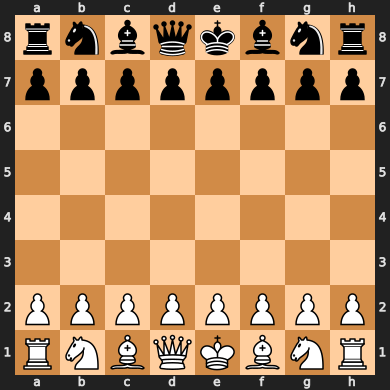

In [ ]:
predictPieceType(piece_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 17ms/step
p 0.5748085
r 0.0018798624
n 0.16990285
b 0.0694582
q 0.011032622
k 0.17291798


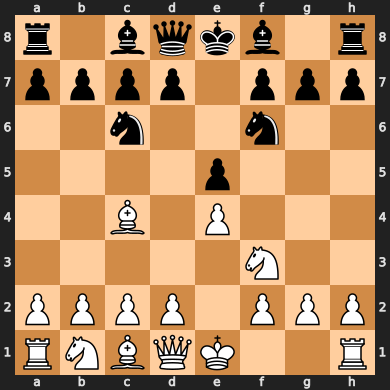

In [ ]:
predictPieceType(piece_model, 'r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

1/1 [==============================] - 0s 17ms/step
p 0.0066677146
r 0.05897606
n 0.91962886
b 0.01193902
q 0.00041317695
k 0.0023750947


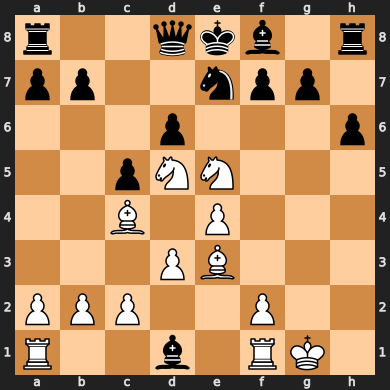

In [ ]:
predictPieceType(piece_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 17ms/step
p 0.7795681
r 0.0070641944
n 0.002155551
b 0.0049602147
q 0.0016893124
k 0.20456262


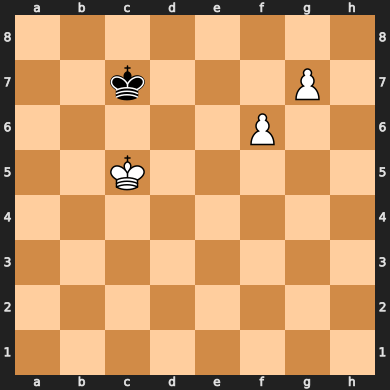

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 18ms/step
p 0.11963206
r 0.07712256
n 0.0098506035
b 0.035504557
q 0.009521345
k 0.74836886


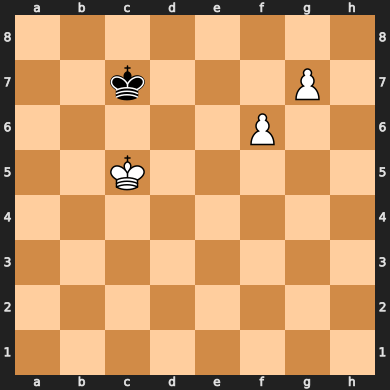

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 19ms/step
p 0.66450834
r 0.015881306
n 0.0034948136
b 0.0077022
q 0.003700084
k 0.3047132


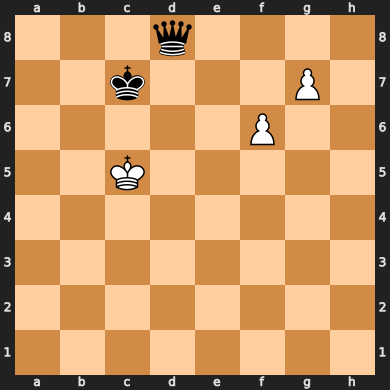

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 17ms/step
p 0.03993438
r 0.010793646
n 0.0024480696
b 0.009276069
q 0.6510243
k 0.2865235


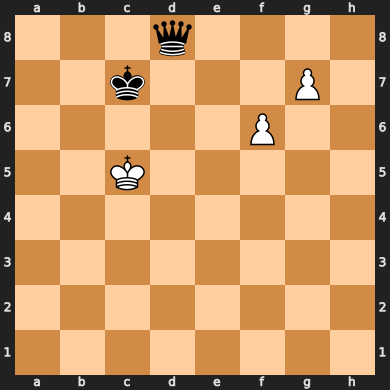

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

### Train and test pawn move model

In [ ]:
pP_X_train, pP_y_train = loadObj('pP_X_train_6000'), loadObj('pP_y_train_6000')
pP_X_test, pP_y_test = loadObj('pP_X_test_6000'), loadObj('pP_y_test_6000')

Loading object from pP_X_train_4000
Loading object from pP_y_train_4000
Loading object from pP_X_test_4000
Loading object from pP_y_test_4000


In [ ]:
pP_X_train = np.reshape(pP_X_train, (len(pP_X_train), 6,8,8))
pP_X_test = np.reshape(pP_X_test, (len(pP_X_test), 6,8,8))

In [ ]:
# !pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 2.7 MB/s eta 0:00:00


In [ ]:
'''
from sklearn.model_selection import GridSearchCV
import keras_tuner as kt
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers


def makePModel(hp):
  pMove_model = models.Sequential()
  pMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first', input_shape=(6,8,8)))
  pMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
  pMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))
  pMove_model.add(layers.Flatten())
  pMove_model.add(layers.Dense(64, activation='softmax'))

  optimizer = hp.Choice('optimizer', ['adam', 'rmsprop'])
  with hp.conditional_scope('optimizer', ['adam']):
    if optimizer == 'adam':
      chosenOptimizer = optimizers.Adam(learning_rate=hp.Choice('adam_learning_rate', values=[1e-2, 1e-3, 1e-4]))
  with hp.conditional_scope('optimizer', ['rmsprop']):
    if optimizer == 'rmsprop':
      chosenOptimizer = optimizers.RMSprop(learning_rate=hp.Choice('rmsprop_learning_rate', values=[1e-2, 1e-3, 1e-4]))

  pMove_model.compile(optimizer=chosenOptimizer, loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

  return pMove_model


tuner = kt.Hyperband(makePModel,
                     objective='val_sparse_categorical_accuracy',
                     directory='Tuner',
                     project_name='pModel_tuner')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_loss',
    restore_best_weights=True,
)

tuner.search(pP_X_train, pP_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
best_hps=tuner.get_best_hyperparameters()[0]
'''

"\nfrom sklearn.model_selection import GridSearchCV\nimport keras_tuner as kt\nfrom tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers\n\n\ndef makePModel(hp):\n  pMove_model = models.Sequential()\n  pMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first', input_shape=(6,8,8)))\n  pMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))\n  pMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channel

In [ ]:
# tuner.results_summary(num_trials=10)

In [ ]:
'''
import keras_tuner as kt
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers


def makePModel(hp):
  pMove_model = models.Sequential()

  # Input
  pMove_model.add(layers.Input(shape=(6,8,8)))

  # 0-3 CNN layers
  cnnNum = hp.Int('cnnNum', min_value=0, max_value=3)
  with hp.conditional_scope('cnnNum', [1,2,3]):
    if cnnNum >= 1:
      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))

  with hp.conditional_scope('cnnNum', [2,3]):
    if cnnNum >= 2:
      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))

  with hp.conditional_scope('cnnNum', [3]):
    if cnnNum >= 3:
      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

  # Flatten
  pMove_model.add(layers.Flatten())

  # 0-3 Dense layers
  denseNum = hp.Int('denseNum', min_value=0, max_value=3)
  with hp.conditional_scope('denseNum', [1, 2, 3]):
    if denseNum >= 1:
      pMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128]), activation='relu'))

  with hp.conditional_scope('denseNum', [2, 3]):
    if denseNum >= 2:
      pMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128]), activation='relu'))

  with hp.conditional_scope('denseNum', [3]):
    if denseNum >= 3:
      pMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128]), activation='relu'))

  # Output
  pMove_model.add(layers.Dense(64, activation='softmax'))

  pMove_model.compile(optimizer=optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

  return pMove_model


tuner = kt.Hyperband(makePModel,
                     objective='val_sparse_categorical_accuracy',
                     directory='Tuner',
                     project_name='pModel_tuner_attempt2')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_loss',
    restore_best_weights=True,
)

tuner.search(pP_X_train, pP_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
best_hps=tuner.get_best_hyperparameters()[0]
'''

"\nimport keras_tuner as kt\nfrom tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers\n\n\ndef makePModel(hp):\n  pMove_model = models.Sequential()\n\n  # Input\n  pMove_model.add(layers.Input(shape=(6,8,8)))\n\n  # 0-3 CNN layers\n  cnnNum = hp.Int('cnnNum', min_value=0, max_value=3)\n  with hp.conditional_scope('cnnNum', [1,2,3]):\n    if cnnNum >= 1:\n      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))\n\n  with hp.conditional_scope('cnnNum', [2,3]):\n    if cnnNum >= 2:\n      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))\n\n  with hp.conditional_sc

In [ ]:
import keras_tuner as kt
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers


def makePModel(hp):
  pMove_model = models.Sequential()

  # Input
  pMove_model.add(layers.Input(shape=(6,8,8)))

  # 0-3 CNN layers
  cnnNum = hp.Int('cnnNum', min_value=0, max_value=3)
  with hp.conditional_scope('cnnNum', [1,2,3]):
    if cnnNum >= 1:
      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))

  with hp.conditional_scope('cnnNum', [2,3]):
    if cnnNum >= 2:
      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))

  with hp.conditional_scope('cnnNum', [3]):
    if cnnNum >= 3:
      pMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[1, 2, 4, 8, 16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

  # Flatten
  pMove_model.add(layers.Flatten())

  # 0-3 Dense layers
  denseNum = hp.Int('denseNum', min_value=0, max_value=3)
  with hp.conditional_scope('denseNum', [1, 2, 3]):
    if denseNum >= 1:
      pMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128]), activation='relu'))

  with hp.conditional_scope('denseNum', [2, 3]):
    if denseNum >= 2:
      pMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128]), activation='relu'))

  with hp.conditional_scope('denseNum', [3]):
    if denseNum >= 3:
      pMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128]), activation='relu'))

  # Output
  pMove_model.add(layers.Dense(64, activation='softmax'))

  pMove_model.compile(optimizer=optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

  return pMove_model


tuner = kt.Hyperband(makePModel,
                     objective='val_sparse_categorical_accuracy',
                     directory='Tuner',
                     project_name='pModel_tuner_attempt2')

Reloading Tuner from Tuner/pModel_tuner_attempt2/tuner0.json


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/pModel_tuner_attempt2
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0131 summary
Hyperparameters:
cnnNum: 3
denseNum: 1
filter1: 32
kernel1: 3
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 1
kernel3: 3
padding3: same
dense1: 128
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0101
Score: 0.37282994389533997

Trial 0127 summary
Hyperparameters:
cnnNum: 2
denseNum: 2
filter1: 64
kernel1: 3
padding1: same
filter2: 32
kernel2: 2
padding2: same
dense1: 64
dense2: 64
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0100
Score: 0.37274566292762756

Trial 0175 summary
Hyperparameters:
cnnNum: 3
denseNum: 1
filter1: 64
kernel1: 2
padding1: same
filter2: 64
kernel2: 2
padding2: valid
filter3: 16
kernel3: 3
padding3: valid
dense1: 64
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 3
tuner/round: 1
tuner/trial_id: 

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

pMove_model = models.Sequential()
pMove_model.add(layers.Conv2D(filters=32, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
pMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
pMove_model.add(layers.Conv2D(filters=1, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
pMove_model.add(layers.Flatten())
pMove_model.add(layers.Dense(128, activation='relu'))
pMove_model.add(layers.Dense(64, activation='softmax'))

pMove_model.compile(optimizer=optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
pMove_model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_36 (Conv2D)          (None, 32, 8, 8)          1760      
                                                                 
 conv2d_37 (Conv2D)          (None, 64, 8, 8)          51264     
                                                                 
 conv2d_38 (Conv2D)          (None, 1, 8, 8)           577       
                                                                 
 flatten_12 (Flatten)        (None, 64)                0         
                                                                 
 dense_14 (Dense)            (None, 128)               8320      
                                                                 
 dense_15 (Dense)            (None, 64)                8256      
                                                                 
Total params: 70177 (274.13 KB)
Trainable params: 701

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

pMove_model.fit(
  pP_X_train, pP_y_train,
  validation_data=((pP_X_test, pP_y_test)),
  callbacks=[earlyStopping],
  batch_size=256,
  epochs=50,
  verbose=1,
)
pMove_model.save('pMove_model.keras')

Epoch 1/50
232/232 [==============================] - 4s 7ms/step - loss: 3.1497 - sparse_categorical_accuracy: 0.1530 - sparse_top_k_categorical_accuracy: 0.4315 - val_loss: 2.9372 - val_sparse_categorical_accuracy: 0.1878 - val_sparse_top_k_categorical_accuracy: 0.5307
Epoch 2/50
232/232 [==============================] - 1s 5ms/step - loss: 2.5507 - sparse_categorical_accuracy: 0.2617 - sparse_top_k_categorical_accuracy: 0.6449 - val_loss: 2.5124 - val_sparse_categorical_accuracy: 0.2619 - val_sparse_top_k_categorical_accuracy: 0.6695
Epoch 3/50
232/232 [==============================] - 1s 5ms/step - loss: 2.1909 - sparse_categorical_accuracy: 0.3233 - sparse_top_k_categorical_accuracy: 0.7479 - val_loss: 2.2809 - val_sparse_categorical_accuracy: 0.2978 - val_sparse_top_k_categorical_accuracy: 0.7300
Epoch 4/50
232/232 [==============================] - 1s 5ms/step - loss: 2.0077 - sparse_categorical_accuracy: 0.3596 - sparse_top_k_categorical_accuracy: 0.7951 - val_loss: 2.1962 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 6)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(p, (8,8)))

In [ ]:
predictPieceType(pMove_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 138ms/step
[['2e-05' '1.7e-05' '1.3e-05' '0.0' '1e-06' '3e-06' '6e-06' '3e-06']
 ['8e-06' '1.1e-05' '2e-06' '1e-06' '7e-06' '2e-06' '2.1e-05' '1e-06']
 ['0.002281' '0.022495' '0.003156' '0.019805' '0.058617' '0.001585'
  '0.033351' '0.000636']
 ['0.000288' '0.003587' '0.044586' '0.296681' '0.450269' '0.005405'
  '0.004509' '0.001732']
 ['0.000205' '0.002633' '0.002365' '0.013912' '0.009683' '0.00126'
  '0.001439' '0.000538']
 ['0.00082' '0.002369' '0.002667' '0.003475' '0.006999' '0.000397'
  '0.001661' '0.00037']
 ['0.0' '2.2e-05' '8e-06' '1e-06' '2.3e-05' '2e-06' '2e-05' '4e-06']
 ['0.0' '2e-06' '1.4e-05' '3e-06' '2e-06' '2e-06' '1e-06' '2e-06']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 3 0 5 0]
 [0 0 4 2 1 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

[[ 0  0  0  0  0  0  0  0]
 [ 1  1  1  1  1  1  1  1]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  

### Train and test rook move model

In [ ]:
pR_X_train, pR_y_train = loadObj('pR_X_train_6000'), loadObj('pR_y_train_6000')
pR_X_test, pR_y_test = loadObj('pR_X_test_6000'), loadObj('pR_y_test_6000')

pR_X_train = np.reshape(pR_X_train, (len(pR_X_train), 6,8,8))
pR_X_test = np.reshape(pR_X_test, (len(pR_X_test), 6,8,8))

Loading object from pR_X_train_6000
Loading object from pR_y_train_6000
Loading object from pR_X_test_6000
Loading object from pR_y_test_6000


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeRModel(hp):
#   rMove_model = models.Sequential()

#   # Input
#   rMove_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   rMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))
#   rMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
#   rMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

#   # Flatten
#   rMove_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       rMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       rMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       rMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128, 256, 512]), activation='relu'))

#   # Output
#   rMove_model.add(layers.Dense(64, activation='softmax'))

#   rMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return rMove_model


# tuner = kt.Hyperband(makeRModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='rModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(pR_X_train, pR_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 238 Complete [00h 01m 01s]
val_sparse_categorical_accuracy: 0.3659030795097351

Best val_sparse_categorical_accuracy So Far: 0.44039270281791687
Total elapsed time: 02h 06m 52s


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/rModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0178 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 64
kernel3: 5
padding3: same
denseNum: 1
dense1: 64
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 3
tuner/round: 1
tuner/trial_id: 0171
Score: 0.44039270281791687

Trial 0171 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 64
kernel3: 5
padding3: same
denseNum: 1
dense1: 64
tuner/epochs: 4
tuner/initial_epoch: 0
tuner/bracket: 3
tuner/round: 0
Score: 0.438678503036499

Trial 0136 summary
Hyperparameters:
filter1: 64
kernel1: 2
padding1: same
filter2: 32
kernel2: 3
padding2: same
filter3: 32
kernel3: 3
padding3: same
denseNum: 0
tuner/epochs: 34
tuner/initial_epoch: 12
tuner/bracket: 4
tuner/round: 3
tuner/trial_id: 0128
Score: 0.43852266669273376

Trial 

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

rMove_model = models.Sequential()
rMove_model.add(layers.Conv2D(filters=32, kernel_size=2, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
rMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
rMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
rMove_model.add(layers.Flatten())
rMove_model.add(layers.Dense(64, activation='relu'))
rMove_model.add(layers.Dense(64, activation='softmax'))

rMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
rMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 8, 8)          800       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 8, 8)          51264     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 8, 8)          102464    
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 dense (Dense)               (None, 64)                262208    
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
Total params: 420896 (1.61 MB)
Trainable params: 420896 

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

rMove_model.fit(
  pR_X_train, pR_y_train,
  validation_data=((pR_X_test, pR_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
rMove_model.save('rMove_model.keras')

Epoch 1/50
257/257 [==============================] - 9s 10ms/step - loss: 3.3893 - sparse_categorical_accuracy: 0.1723 - sparse_top_k_categorical_accuracy: 0.4202 - val_loss: 2.6983 - val_sparse_categorical_accuracy: 0.2764 - val_sparse_top_k_categorical_accuracy: 0.6139
Epoch 2/50
257/257 [==============================] - 2s 8ms/step - loss: 2.4446 - sparse_categorical_accuracy: 0.3207 - sparse_top_k_categorical_accuracy: 0.6782 - val_loss: 2.2010 - val_sparse_categorical_accuracy: 0.3682 - val_sparse_top_k_categorical_accuracy: 0.7349
Epoch 3/50
257/257 [==============================] - 2s 8ms/step - loss: 2.0819 - sparse_categorical_accuracy: 0.3925 - sparse_top_k_categorical_accuracy: 0.7630 - val_loss: 2.0278 - val_sparse_categorical_accuracy: 0.4023 - val_sparse_top_k_categorical_accuracy: 0.7735
Epoch 4/50
257/257 [==============================] - 3s 10ms/step - loss: 1.8623 - sparse_categorical_accuracy: 0.4373 - sparse_top_k_categorical_accuracy: 0.8119 - val_loss: 1.9457 

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.2 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(r, (8,8)))

In [ ]:
predictPieceType(rMove_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 1s 544ms/step
[['1.015e-05' '0.00276342' '0.00077804' '0.98325527' '0.01090169'
  '0.00028811' '6.005e-05' '0.00015649']
 ['2.883e-05' '5.7e-06' '1.116e-05' '1.7e-06' '1.005e-05' '0.00065171'
  '2.787e-05' '2.427e-05']
 ['3.38e-06' '7.38e-06' '9.8e-07' '8.1e-07' '1.044e-05' '8.834e-05'
  '6.18e-06' '1.49e-06']
 ['9.75e-06' '1.53e-06' '5.87e-06' '1.44e-06' '1.86e-06' '0.00010356'
  '2.93e-06' '3.62e-06']
 ['3.414e-05' '5.33e-06' '6.73e-06' '4.94e-06' '7.2e-07' '3.504e-05'
  '1.81e-06' '5.1e-06']
 ['4.523e-05' '1.3e-06' '4.2e-07' '1.1e-06' '1.36e-06' '5.448e-05'
  '4.66e-06' '1.614e-05']
 ['0.00021935' '5.129e-05' '2.22e-06' '5.85e-06' '7.9e-07' '0.00018102'
  '1.409e-05' '1.34e-06']
 ['3.661e-05' '5.4e-07' '4.58e-06' '2.94e-06' '1.69e-06' '1.555e-05'
  '4.5e-06' '1.512e-05']]
[[0 3 4 1 2 0 0 0]
 [0 0 0 0 0 5 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

[[ 1  0  0  0  0  1  

### Train and test knight move model

In [ ]:
# !pip install -q -U keras-tuner

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.9/128.9 kB 3.9 MB/s eta 0:00:00


In [ ]:
pN_X_train, pN_y_train = loadObj('pN_X_train_6000'), loadObj('pN_y_train_6000')
pN_X_test, pN_y_test = loadObj('pN_X_test_6000'), loadObj('pN_y_test_6000')

pN_X_train = np.reshape(pN_X_train, (len(pN_X_train), 6,8,8))
pN_X_test = np.reshape(pN_X_test, (len(pN_X_test), 6,8,8))

Loading object from pN_X_train_6000
Loading object from pN_y_train_6000
Loading object from pN_X_test_6000
Loading object from pN_y_test_6000


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeNModel(hp):
#   nMove_model = models.Sequential()

#   # Input
#   nMove_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   nMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))
#   nMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
#   nMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

#   # Flatten
#   nMove_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       nMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       nMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       nMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128, 256, 512]), activation='relu'))

#   # Output
#   nMove_model.add(layers.Dense(64, activation='softmax'))

#   nMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return nMove_model


# tuner = kt.Hyperband(makeNModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='nModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(pN_X_train, pN_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 228 Complete [00h 02m 06s]
val_sparse_categorical_accuracy: 0.5837291479110718

Best val_sparse_categorical_accuracy So Far: 0.6357535719871521
Total elapsed time: 02h 02m 06s


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/nModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0204 summary
Hyperparameters:
filter1: 64
kernel1: 3
padding1: same
filter2: 16
kernel2: 5
padding2: same
filter3: 64
kernel3: 2
padding3: same
denseNum: 0
tuner/epochs: 34
tuner/initial_epoch: 12
tuner/bracket: 2
tuner/round: 1
tuner/trial_id: 0188
Score: 0.6357535719871521

Trial 0211 summary
Hyperparameters:
filter1: 64
kernel1: 5
padding1: same
filter2: 64
kernel2: 2
padding2: same
filter3: 16
kernel3: 5
padding3: same
denseNum: 0
tuner/epochs: 100
tuner/initial_epoch: 34
tuner/bracket: 2
tuner/round: 2
tuner/trial_id: 0206
Score: 0.6357535719871521

Trial 0206 summary
Hyperparameters:
filter1: 64
kernel1: 5
padding1: same
filter2: 64
kernel2: 2
padding2: same
filter3: 16
kernel3: 5
padding3: same
denseNum: 0
tuner/epochs: 34
tuner/initial_epoch: 12
tuner/bracket: 2
tuner/round: 1
tuner/trial_id: 0197
Score: 0.6349996328353882

Tria

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

nMove_model = models.Sequential()
nMove_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
nMove_model.add(layers.Conv2D(filters=16, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
nMove_model.add(layers.Conv2D(filters=64, kernel_size=2, activation='relu', padding='same', data_format='channels_first'))
nMove_model.add(layers.Flatten())
nMove_model.add(layers.Dense(64, activation='softmax'))

nMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
nMove_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 64, 8, 8)          3520      
                                                                 
 conv2d_4 (Conv2D)           (None, 16, 8, 8)          25616     
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 8, 8)          4160      
                                                                 
 flatten_1 (Flatten)         (None, 4096)              0         
                                                                 
 dense_4 (Dense)             (None, 64)                262208    
                                                                 
Total params: 295504 (1.13 MB)
Trainable params: 295504 (1.13 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

nMove_model.fit(
  pN_X_train, pN_y_train,
  validation_data=(pN_X_test, pN_y_test),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
nMove_model.save('nMove_model.keras')

Epoch 1/50
266/266 [==============================] - 3s 7ms/step - loss: 1.9633 - sparse_categorical_accuracy: 0.4073 - sparse_top_k_categorical_accuracy: 0.7984 - val_loss: 1.4777 - val_sparse_categorical_accuracy: 0.5059 - val_sparse_top_k_categorical_accuracy: 0.9143
Epoch 2/50
266/266 [==============================] - 1s 5ms/step - loss: 1.2714 - sparse_categorical_accuracy: 0.5649 - sparse_top_k_categorical_accuracy: 0.9431 - val_loss: 1.2703 - val_sparse_categorical_accuracy: 0.5656 - val_sparse_top_k_categorical_accuracy: 0.9458
Epoch 3/50
266/266 [==============================] - 1s 5ms/step - loss: 1.1072 - sparse_categorical_accuracy: 0.6166 - sparse_top_k_categorical_accuracy: 0.9640 - val_loss: 1.2178 - val_sparse_categorical_accuracy: 0.5765 - val_sparse_top_k_categorical_accuracy: 0.9573
Epoch 4/50
266/266 [==============================] - 1s 5ms/step - loss: 1.0058 - sparse_categorical_accuracy: 0.6477 - sparse_top_k_categorical_accuracy: 0.9741 - val_loss: 1.1823 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(n, (8,8)))

In [ ]:
predictPieceType(nMove_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 130ms/step
[['3.18e-06' '4.1e-07' '2.1e-07' '4.37e-06' '1.8e-07' '1e-07' '1.98e-06'
  '8.75e-06']
 ['1.2e-07' '1.5e-07' '1.3e-07' '5.78e-05' '1.82e-06' '3.6e-07' '6e-08'
  '2.6e-07']
 ['0.00019896' '1.75e-05' '0.09965122' '3.47e-06' '7.55e-06' '0.89903194'
  '8.007e-05' '0.00071039']
 ['2.9e-07' '2.1e-07' '1.594e-05' '2.037e-05' '2.455e-05' '2.762e-05'
  '9.1e-07' '2.85e-06']
 ['3.8e-07' '2.27e-06' '7.8e-07' '9.69e-06' '4.17e-06' '4.71e-06'
  '9.2e-07' '7.69e-06']
 ['2.7e-07' '4e-08' '2e-08' '1.7e-07' '1.2e-07' '3.9e-07' '7.6e-07'
  '8.6e-07']
 ['3.68e-06' '9.9e-07' '2.42e-06' '2.6e-07' '3e-08' '5.407e-05'
  '2.17e-06' '1.21e-06']
 ['5.08e-06' '2.72e-06' '8.4e-07' '8.2e-07' '2.75e-06' '4e-07' '5.49e-06'
  '1.02e-05']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [4 0 2 0 0 1 5 3]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

[[ 0  1  0  0  0  0  1  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0

### Train and test bishop move model

In [ ]:
pB_X_train, pB_y_train = loadObj('pB_X_train_6000'), loadObj('pB_y_train_6000')
pB_X_test, pB_y_test = loadObj('pB_X_test_6000'), loadObj('pB_y_test_6000')

pB_X_train = np.reshape(pB_X_train, (len(pB_X_train), 6,8,8))
pB_X_test = np.reshape(pB_X_test, (len(pB_X_test), 6,8,8))

Loading object from pB_X_train_6000
Loading object from pB_y_train_6000
Loading object from pB_X_test_6000
Loading object from pB_y_test_6000


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeBModel(hp):
#   bMove_model = models.Sequential()

#   # Input
#   bMove_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   bMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))
#   bMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
#   bMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

#   # Flatten
#   bMove_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       bMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       bMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       bMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128, 256, 512]), activation='relu'))

#   # Output
#   bMove_model.add(layers.Dense(64, activation='softmax'))

#   bMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return bMove_model


# tuner = kt.Hyperband(makeBModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='bModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(pB_X_train, pB_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 227 Complete [00h 01m 11s]
val_sparse_categorical_accuracy: 0.46234914660453796

Best val_sparse_categorical_accuracy So Far: 0.5355591177940369
Total elapsed time: 01h 32m 16s


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/bModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0098 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 64
kernel3: 3
padding3: same
denseNum: 0
tuner/epochs: 4
tuner/initial_epoch: 2
tuner/bracket: 4
tuner/round: 1
tuner/trial_id: 0081
Score: 0.5355591177940369

Trial 0178 summary
Hyperparameters:
filter1: 64
kernel1: 3
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 32
kernel3: 2
padding3: valid
denseNum: 0
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 3
tuner/round: 1
tuner/trial_id: 0163
Score: 0.5333065390586853

Trial 0163 summary
Hyperparameters:
filter1: 64
kernel1: 3
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 32
kernel3: 2
padding3: valid
denseNum: 0
tuner/epochs: 4
tuner/initial_epoch: 0
tuner/bracket: 3
tuner/round: 0
Score: 0.5316170454025269

Trial 0128 summary
Hyperparam

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

bMove_model = models.Sequential()
bMove_model.add(layers.Conv2D(filters=32, kernel_size=2, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
bMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
bMove_model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
bMove_model.add(layers.Flatten())
bMove_model.add(layers.Dense(64, activation='softmax'))

bMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
bMove_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 32, 8, 8)          800       
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 8, 8)          51264     
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 8, 8)          36928     
                                                                 
 flatten_1 (Flatten)         (None, 4096)              0         
                                                                 
 dense_2 (Dense)             (None, 64)                262208    
                                                                 
Total params: 351200 (1.34 MB)
Trainable params: 351200 (1.34 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

bMove_model.fit(
  pB_X_train, pB_y_train,
  validation_data=((pB_X_test, pB_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
bMove_model.save('bMove_model.keras')

Epoch 1/50
249/249 [==============================] - 3s 6ms/step - loss: 2.4374 - sparse_categorical_accuracy: 0.3122 - sparse_top_k_categorical_accuracy: 0.6747 - val_loss: 1.8007 - val_sparse_categorical_accuracy: 0.4193 - val_sparse_top_k_categorical_accuracy: 0.8266
Epoch 2/50
249/249 [==============================] - 1s 4ms/step - loss: 1.5812 - sparse_categorical_accuracy: 0.4734 - sparse_top_k_categorical_accuracy: 0.8819 - val_loss: 1.5343 - val_sparse_categorical_accuracy: 0.4913 - val_sparse_top_k_categorical_accuracy: 0.8893
Epoch 3/50
249/249 [==============================] - 1s 4ms/step - loss: 1.3630 - sparse_categorical_accuracy: 0.5343 - sparse_top_k_categorical_accuracy: 0.9202 - val_loss: 1.4754 - val_sparse_categorical_accuracy: 0.4931 - val_sparse_top_k_categorical_accuracy: 0.9019
Epoch 4/50
249/249 [==============================] - 1s 4ms/step - loss: 1.2210 - sparse_categorical_accuracy: 0.5762 - sparse_top_k_categorical_accuracy: 0.9425 - val_loss: 1.4154 - 

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.7 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(b, (8,8)))

In [ ]:
predictPieceType(bMove_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 174ms/step
[['6.922e-05' '3.57e-06' '0.00023861' '9.75e-06' '6.94e-06' '0.00054219'
  '8.12e-06' '0.00094297']
 ['0.00033139' '0.01929427' '9.85e-06' '0.00023216' '0.01150708'
  '7.418e-05' '0.02595139' '0.00014715']
 ['0.01104352' '0.01999853' '0.00228333' '0.05356702' '0.05266006'
  '0.02170178' '0.0068353' '0.00963165']
 ['0.00011199' '2.665e-05' '0.30982313' '0.00023519' '0.00034224'
  '0.07693713' '2.766e-05' '0.0162648']
 ['2.579e-05' '0.04364149' '2.26e-06' '0.00052314' '0.00110272'
  '3.994e-05' '0.24839541' '0.00127008']
 ['0.00025403' '5.68e-06' '7.065e-05' '6.62e-06' '6.26e-06' '1.268e-05'
  '9.91e-06' '0.01917726']
 ['0.00061259' '0.00072489' '0.00163638' '5.761e-05' '8.77e-06'
  '0.00119932' '0.0056436' '0.00014762']
 ['0.00894173' '0.00061139' '0.0012135' '0.00015836' '0.00020296'
  '0.00075773' '0.00411727' '0.01856347']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 4 5 0 0 0]
 [0 0 1 0 0 3 0 0]
 [0 0 0 0 0 0 2 0]
 [0 0 0 0 0 0 

### Train and test queen move model

In [ ]:
pQ_X_train, pQ_y_train = loadObj('pQ_X_train_6000'), loadObj('pQ_y_train_6000')
pQ_X_test, pQ_y_test = loadObj('pQ_X_test_6000'), loadObj('pQ_y_test_6000')

pQ_X_train = np.reshape(pQ_X_train, (len(pQ_X_train), 6,8,8))
pQ_X_test = np.reshape(pQ_X_test, (len(pQ_X_test), 6,8,8))

Loading object from pQ_X_train_6000
Loading object from pQ_y_train_6000
Loading object from pQ_X_test_6000
Loading object from pQ_y_test_6000


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeQModel(hp):
#   qMove_model = models.Sequential()

#   # Input
#   qMove_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   qMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))
#   qMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
#   qMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

#   # Flatten
#   qMove_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       qMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       qMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       qMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128, 256, 512]), activation='relu'))

#   # Output
#   qMove_model.add(layers.Dense(64, activation='softmax'))

#   qMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return qMove_model


# tuner = kt.Hyperband(makeQModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='qModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(pQ_X_train, pQ_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 221 Complete [00h 01m 06s]
val_sparse_categorical_accuracy: 0.32050201296806335

Best val_sparse_categorical_accuracy So Far: 0.38472896814346313
Total elapsed time: 01h 26m 36s


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/qModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0123 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 64
kernel3: 5
padding3: same
denseNum: 1
dense1: 64
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0098
Score: 0.38472896814346313

Trial 0122 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 64
kernel3: 3
padding3: same
denseNum: 0
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0101
Score: 0.38156506419181824

Trial 0101 summary
Hyperparameters:
filter1: 32
kernel1: 2
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 64
kernel3: 3
padding3: same
denseNum: 0
tuner/epochs: 4
tuner/initial_epoch: 2
tuner/bracket: 4
tuner/round: 1
tuner/trial_id: 0039
Score: 0.38114321231842

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

qMove_model = models.Sequential()
qMove_model.add(layers.Conv2D(filters=32, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
qMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
qMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
qMove_model.add(layers.Flatten())
qMove_model.add(layers.Dense(64, activation='relu'))
qMove_model.add(layers.Dense(64, activation='softmax'))

qMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
qMove_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 32, 8, 8)          1760      
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 8, 8)          51264     
                                                                 
 conv2d_11 (Conv2D)          (None, 64, 8, 8)          102464    
                                                                 
 flatten_1 (Flatten)         (None, 4096)              0         
                                                                 
 dense_2 (Dense)             (None, 64)                262208    
                                                                 
 dense_3 (Dense)             (None, 64)                4160      
                                                                 
Total params: 421856 (1.61 MB)
Trainable params: 42185

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

qMove_model.fit(
  pQ_X_train, pQ_y_train,
  validation_data=((pQ_X_test, pQ_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
qMove_model.save('qMove_model.keras')

Epoch 1/50
190/190 [==============================] - 3s 9ms/step - loss: 3.6180 - sparse_categorical_accuracy: 0.1113 - sparse_top_k_categorical_accuracy: 0.3363 - val_loss: 3.1470 - val_sparse_categorical_accuracy: 0.1938 - val_sparse_top_k_categorical_accuracy: 0.4828
Epoch 2/50
190/190 [==============================] - 1s 6ms/step - loss: 2.8626 - sparse_categorical_accuracy: 0.2450 - sparse_top_k_categorical_accuracy: 0.5741 - val_loss: 2.5946 - val_sparse_categorical_accuracy: 0.2976 - val_sparse_top_k_categorical_accuracy: 0.6418
Epoch 3/50
190/190 [==============================] - 1s 6ms/step - loss: 2.4670 - sparse_categorical_accuracy: 0.3161 - sparse_top_k_categorical_accuracy: 0.6785 - val_loss: 2.4213 - val_sparse_categorical_accuracy: 0.3248 - val_sparse_top_k_categorical_accuracy: 0.6875
Epoch 4/50
190/190 [==============================] - 1s 6ms/step - loss: 2.2265 - sparse_categorical_accuracy: 0.3601 - sparse_top_k_categorical_accuracy: 0.7398 - val_loss: 2.3138 - 

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.1 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(q, (8,8)))

In [ ]:
predictPieceType(qMove_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 215ms/step
[['0.10174428' '0.0072595' '0.10771798' '0.00075329' '0.03123492'
  '0.02493597' '0.02498841' '0.01647947']
 ['0.00012803' '0.00088838' '0.01188079' '0.0180945' '0.01271267'
  '0.00061625' '0.00096202' '0.00080465']
 ['5.352e-05' '0.05445356' '0.00055912' '0.14470564' '0.0002413'
  '0.1861419' '0.00041389' '0.00208428']
 ['0.11257481' '0.00035647' '0.00026148' '0.01901122' '0.00226363'
  '0.00107183' '0.03467078' '0.00175501']
 ['0.00038148' '0.00021563' '0.00027459' '0.0109862' '0.00039113'
  '0.00015162' '0.00164275' '0.01747347']
 ['0.001942' '0.00020181' '0.00029329' '0.00893259' '0.00084778'
  '0.00022251' '0.000554' '0.00011016']
 ['7.517e-05' '5.733e-05' '0.00471498' '0.01529172' '0.00013312'
  '3.83e-06' '0.0044051' '7.2e-05']
 ['0.00019244' '3.054e-05' '0.00023058' '0.00691338' '0.00137531'
  '9.59e-06' '3.97e-05' '1.469e-05']]
[[5 0 4 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 2 0 1 0 0]
 [3 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0

### Train and test king move model

In [ ]:
pK_X_train, pK_y_train = loadObj('pK_X_train_6000'), loadObj('pK_y_train_6000')
pK_X_test, pK_y_test = loadObj('pK_X_test_6000'), loadObj('pK_y_test_6000')

pK_X_train = np.reshape(pK_X_train, (len(pK_X_train), 6,8,8))
pK_X_test = np.reshape(pK_X_test, (len(pK_X_test), 6,8,8))

Loading object from pK_X_train_6000
Loading object from pK_y_train_6000
Loading object from pK_X_test_6000
Loading object from pK_y_test_6000


In [ ]:
# import keras_tuner as kt
# from tensorflow.keras import models, layers, callbacks, metrics, optimizers


# def makeKModel(hp):
#   kMove_model = models.Sequential()

#   # Input
#   kMove_model.add(layers.Input(shape=(6,8,8)))

#   # 3 CNN layers
#   kMove_model.add(layers.Conv2D(filters=hp.Choice('filter1', values=[16, 32, 64]), kernel_size=hp.Choice('kernel1', values=[2,3,5]), activation='relu', padding=hp.Choice('padding1', values=['same', 'valid']), data_format='channels_first'))
#   kMove_model.add(layers.Conv2D(filters=hp.Choice('filter2', values=[16, 32, 64]), kernel_size=hp.Choice('kernel2', values=[2,3,5]), activation='relu', padding=hp.Choice('padding2', values=['same', 'valid']), data_format='channels_first'))
#   kMove_model.add(layers.Conv2D(filters=hp.Choice('filter3', values=[16, 32, 64]), kernel_size=hp.Choice('kernel3', values=[2,3,5]), activation='relu', padding=hp.Choice('padding3', values=['same', 'valid']), data_format='channels_first'))

#   # Flatten
#   kMove_model.add(layers.Flatten())

#   # 0-3 Dense layers
#   denseNum = hp.Int('denseNum', min_value=0, max_value=3)
#   with hp.conditional_scope('denseNum', [1, 2, 3]):
#     if denseNum >= 1:
#       kMove_model.add(layers.Dense(hp.Choice('dense1', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [2, 3]):
#     if denseNum >= 2:
#       kMove_model.add(layers.Dense(hp.Choice('dense2', values=[32, 64, 128, 256, 512]), activation='relu'))

#   with hp.conditional_scope('denseNum', [3]):
#     if denseNum >= 3:
#       kMove_model.add(layers.Dense(hp.Choice('dense3', values=[32, 64, 128, 256, 512]), activation='relu'))

#   # Output
#   kMove_model.add(layers.Dense(64, activation='softmax'))

#   kMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy'])

#   return kMove_model


# tuner = kt.Hyperband(makeKModel,
#                      objective='val_sparse_categorical_accuracy',
#                      directory='Tuner',
#                      project_name='kModel_tuner_attempt1')

# earlyStopping = callbacks.EarlyStopping(
#     patience=5,
#     min_delta=0.001,
#     monitor='val_loss',
#     restore_best_weights=True,
# )

# tuner.search(pK_X_train, pK_y_train, epochs=100, validation_split=0.2, callbacks=[earlyStopping])
# best_hps=tuner.get_best_hyperparameters()[0]

Trial 230 Complete [00h 00m 49s]
val_sparse_categorical_accuracy: 0.5908764004707336

Best val_sparse_categorical_accuracy So Far: 0.6360446214675903
Total elapsed time: 01h 29m 07s


In [ ]:
# tuner.results_summary(num_trials=10)

Results summary
Results in Tuner/kModel_tuner_attempt1
Showing 10 best trials
Objective(name="val_sparse_categorical_accuracy", direction="max")

Trial 0142 summary
Hyperparameters:
filter1: 64
kernel1: 3
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 32
kernel3: 2
padding3: same
denseNum: 0
tuner/epochs: 4
tuner/initial_epoch: 0
tuner/bracket: 3
tuner/round: 0
Score: 0.6360446214675903

Trial 0099 summary
Hyperparameters:
filter1: 64
kernel1: 5
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 16
kernel3: 2
padding3: valid
denseNum: 1
dense1: 512
tuner/epochs: 4
tuner/initial_epoch: 2
tuner/bracket: 4
tuner/round: 1
tuner/trial_id: 0050
Score: 0.6352348327636719

Trial 0126 summary
Hyperparameters:
filter1: 64
kernel1: 5
padding1: same
filter2: 64
kernel2: 5
padding2: same
filter3: 16
kernel3: 2
padding3: valid
denseNum: 1
dense1: 512
tuner/epochs: 12
tuner/initial_epoch: 4
tuner/bracket: 4
tuner/round: 2
tuner/trial_id: 0099
Score: 0.6343351006507874

Trial

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

kMove_model = models.Sequential()
kMove_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
kMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
kMove_model.add(layers.Conv2D(filters=32, kernel_size=2, activation='relu', padding='same', data_format='channels_first'))
kMove_model.add(layers.Flatten())
kMove_model.add(layers.Dense(64, activation='softmax'))

kMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
kMove_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 64, 8, 8)          3520      
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 8, 8)          102464    
                                                                 
 conv2d_5 (Conv2D)           (None, 32, 8, 8)          8224      
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 64)                131136    
                                                                 
Total params: 245344 (958.38 KB)
Trainable params: 245344 (958.38 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

kMove_model.fit(
  pK_X_train, pK_y_train,
  validation_data=((pK_X_test, pK_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
kMove_model.save('kMove_model.keras')

Epoch 1/50
223/223 [==============================] - 1s 6ms/step - loss: 1.5836 - sparse_categorical_accuracy: 0.4794 - sparse_top_k_categorical_accuracy: 0.8839 - val_loss: 1.1080 - val_sparse_categorical_accuracy: 0.5781 - val_sparse_top_k_categorical_accuracy: 0.9760
Epoch 2/50
223/223 [==============================] - 1s 4ms/step - loss: 0.9981 - sparse_categorical_accuracy: 0.6153 - sparse_top_k_categorical_accuracy: 0.9830 - val_loss: 1.0599 - val_sparse_categorical_accuracy: 0.6024 - val_sparse_top_k_categorical_accuracy: 0.9826
Epoch 3/50
223/223 [==============================] - 1s 4ms/step - loss: 0.8660 - sparse_categorical_accuracy: 0.6670 - sparse_top_k_categorical_accuracy: 0.9892 - val_loss: 0.9994 - val_sparse_categorical_accuracy: 0.6265 - val_sparse_top_k_categorical_accuracy: 0.9869
Epoch 4/50
223/223 [==============================] - 1s 4ms/step - loss: 0.7681 - sparse_categorical_accuracy: 0.7050 - sparse_top_k_categorical_accuracy: 0.9926 - val_loss: 0.9879 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(k, (8,8)))

In [ ]:
predictPieceType(kMove_model, 'r1bqk2r/pppp1ppp/2n2n2/2b1p3/2B1P3/3P1N2/PPP2PPP/RNBQK2R b KQkq - 1 5')

1/1 [==============================] - 0s 106ms/step
[['0.01349546' '0.01550181' '0.01673972' '0.01570591' '0.01744511'
  '0.0165887' '0.01581844' '0.01582284']
 ['0.01567916' '0.01590682' '0.01505562' '0.01566549' '0.01474544'
  '0.01535768' '0.01613675' '0.01414768']
 ['0.01698557' '0.01612949' '0.01588924' '0.01524147' '0.01597572'
  '0.01580023' '0.01581865' '0.01591585']
 ['0.01533437' '0.0176158' '0.01744866' '0.01494658' '0.01524546'
  '0.01527992' '0.01578456' '0.01527026']
 ['0.01598115' '0.01641345' '0.01491038' '0.01620373' '0.01546621'
  '0.01532282' '0.01525994' '0.01485452']
 ['0.01318906' '0.01560611' '0.01676533' '0.01730558' '0.0147809'
  '0.01601712' '0.01417257' '0.01660474']
 ['0.01684093' '0.01535115' '0.01419256' '0.01449065' '0.01520722'
  '0.01607748' '0.01442867' '0.01601187']
 ['0.01497714' '0.01497538' '0.01562221' '0.01506395' '0.016433'
  '0.01562479' '0.01532133' '0.01603357']]
[[0 0 0 0 3 0 0 0]
 [0 0 0 0 0 0 0 0]
 [5 0 0 0 0 0 0 0]
 [0 1 2 0 0 0 0 0]
 [0

### Test "macro-model"



In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model.keras')
pMove_model = models.load_model('pMove_model.keras')
rMove_model = models.load_model('rMove_model.keras')
nMove_model = models.load_model('nMove_model.keras')
bMove_model = models.load_model('bMove_model.keras')
qMove_model = models.load_model('qMove_model.keras')
kMove_model = models.load_model('kMove_model.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess
import chess.svg
import IPython

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictMove(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  arrows = []
  colors = ["#000000", "#424242", "#616161", "#757575", "#9E9E9E"]
  for i, prediction in enumerate(predictions[:5]):
    pred, move = prediction
    arrows.append(chess.svg.Arrow(move.from_square,move.to_square, color=colors[i]))

    if verbose:
      print(f'Move {move.uci()}: {pred}')

  display(IPython.display.HTML(chess.svg.board(
      correctedBoard,
      arrows=arrows,
      size=300,
  )))

In [ ]:
predictMove('rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

Move e2e4: 0.4619612693786621
Move d2d4: 0.24250298738479614
Move g1f3: 0.08143837749958038
Move e2e3: 0.06622207164764404
Move g2g3: 0.0459764301776886


In [ ]:
predictMove('r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

Move d2d3: 0.35472342371940613
Move f3g5: 0.08147572726011276
Move b1c3: 0.07859999686479568
Move d2d4: 0.0586649589240551
Move c2c3: 0.0496576651930809


In [ ]:
predictMove('8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

Move g7g8q: 0.14927200973033905
Move g7g8r: 0.14927200973033905
Move g7g8b: 0.14927200973033905
Move g7g8n: 0.14927200973033905
Move f6f7: 0.004992838483303785


In [ ]:
predictMove('3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

Move d1f3: 0.1211828887462616
Move d1d3: 0.09420688450336456
Move d1c1: 0.07012701779603958
Move d1a1: 0.06623799353837967
Move d1e1: 0.020334690809249878


In [ ]:
predictMove('r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

Move e5f7: 0.8330773115158081
Move f1d1: 0.057988524436950684
Move a1d1: 0.057988524436950684
Move d5e7: 0.043593596667051315
Move e5g4: 0.01403997652232647


In [ ]:
import chess.pgn

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    predictMove(node.parent.board().fen(), verbose=False)

### Get "macro-model" accuracy (with only valid moves)

In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model.keras')
pMove_model = models.load_model('pMove_model.keras')
rMove_model = models.load_model('rMove_model.keras')
nMove_model = models.load_model('nMove_model.keras')
bMove_model = models.load_model('bMove_model.keras')
qMove_model = models.load_model('qMove_model.keras')
kMove_model = models.load_model('kMove_model.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPrediction(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  return [move for _, move in predictions]

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPrediction(board.fen(), verbose=False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.2234
Top 5 Accuracy: 0.5
Top 10 Accuracy: 0.7553
Top 20 Accuracy: 0.9574


## Method 3.2: Finetune Oshri model to Eric Rosen

### Get X and y from pgn

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.2 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "lichess_EricRosen_2023-05-01.pgn"
PLAYER_USERNAME = 'EricRosen'
NUM_GAMES = 2000
NUM_TRAIN_GAMES = 1500
NUM_TEST_GAMES = 500
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 30906


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_train = [], []
# Move-in
pP_X_train, pR_X_train, pN_X_train = [], [], []
pB_X_train, pQ_X_train, pK_X_train = [], [], []
pP_y_train, pR_y_train, pN_y_train = [], [], []
pB_y_train, pQ_y_train, pK_y_train = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_train.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_train.append(pieceSym)

    piece_X, piece_y = eval(f'p{pieceSym.upper()}_X_train'), eval(f'p{pieceSym.upper()}_y_train')
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_train), f'X_train_{NUM_GAMES}')
saveObj(np.array(y_train), f'y_train_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_train'), eval(f'p{piece}_y_train')
  saveObj(np.array(piece_X), f'p{piece}_X_train_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_train_{NUM_GAMES}')

100%|██████████| 1500/1500 [01:28<00:00, 16.85it/s]


Saving to X_train_2000
Successfully saved to X_train_2000
Saving to y_train_2000
Successfully saved to y_train_2000
Saving to pP_X_train_2000
Successfully saved to pP_X_train_2000
Saving to pP_y_train_2000
Successfully saved to pP_y_train_2000
Saving to pR_X_train_2000
Successfully saved to pR_X_train_2000
Saving to pR_y_train_2000
Successfully saved to pR_y_train_2000
Saving to pN_X_train_2000
Successfully saved to pN_X_train_2000
Saving to pN_y_train_2000
Successfully saved to pN_y_train_2000
Saving to pB_X_train_2000
Successfully saved to pB_X_train_2000
Saving to pB_y_train_2000
Successfully saved to pB_y_train_2000
Saving to pQ_X_train_2000
Successfully saved to pQ_X_train_2000
Saving to pQ_y_train_2000
Successfully saved to pQ_y_train_2000
Saving to pK_X_train_2000
Successfully saved to pK_X_train_2000
Saving to pK_y_train_2000
Successfully saved to pK_y_train_2000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_test = [], []
# Move-in
pP_X_test, pR_X_test, pN_X_test = [], [], []
pB_X_test, pQ_X_test, pK_X_test = [], [], []
pP_y_test, pR_y_test, pN_y_test = [], [], []
pB_y_test, pQ_y_test, pK_y_test = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_test.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_test.append(pieceSym)

    piece_X, piece_y, pieceBoard = eval(f'p{pieceSym.upper()}_X_test'), eval(f'p{pieceSym.upper()}_y_test'), eval(pieceSym)
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_test), f'X_test_{NUM_GAMES}')
saveObj(np.array(y_test), f'y_test_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_test'), eval(f'p{piece}_y_test')
  saveObj(np.array(piece_X), f'p{piece}_X_test_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_test_{NUM_GAMES}')

100%|██████████| 500/500 [00:24<00:00, 20.14it/s]


Saving to X_test_2000
Successfully saved to X_test_2000
Saving to y_test_2000
Successfully saved to y_test_2000
Saving to pP_X_test_2000
Successfully saved to pP_X_test_2000
Saving to pP_y_test_2000
Successfully saved to pP_y_test_2000
Saving to pR_X_test_2000
Successfully saved to pR_X_test_2000
Saving to pR_y_test_2000
Successfully saved to pR_y_test_2000
Saving to pN_X_test_2000
Successfully saved to pN_X_test_2000
Saving to pN_y_test_2000
Successfully saved to pN_y_test_2000
Saving to pB_X_test_2000
Successfully saved to pB_X_test_2000
Saving to pB_y_test_2000
Successfully saved to pB_y_test_2000
Saving to pQ_X_test_2000
Successfully saved to pQ_X_test_2000
Saving to pQ_y_test_2000
Successfully saved to pQ_y_test_2000
Saving to pK_X_test_2000
Successfully saved to pK_X_test_2000
Saving to pK_y_test_2000
Successfully saved to pK_y_test_2000


### Train and test piece model

In [ ]:
X_train, y_train = loadObj('X_train_6000'), loadObj('y_train_6000')
X_test, y_test = loadObj('X_test_6000'), loadObj('y_test_6000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_6000
Loading object from y_train_6000
Loading object from X_test_6000
Loading object from y_test_6000


In [ ]:
from keras.utils import to_categorical

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

y_train = to_categorical([pieceMap[piece] for piece in y_train])
y_test = to_categorical([pieceMap[piece] for piece in y_test])

In [ ]:
from tensorflow.keras import callbacks
from tensorflow.keras import models

piece_model = models.load_model('piece_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_categorical_accuracy',
    restore_best_weights=True,
)

piece_model.fit(
  X_train, y_train,
  validation_data=((X_test, y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
piece_model.save('piece_model_EricRosen.keras')

Epoch 1/50
1714/1714 [==============================] - 11s 4ms/step - loss: 1.1439 - categorical_accuracy: 0.5258 - val_loss: 1.1441 - val_categorical_accuracy: 0.5256
Epoch 2/50
1714/1714 [==============================] - 7s 4ms/step - loss: 1.1140 - categorical_accuracy: 0.5388 - val_loss: 1.1197 - val_categorical_accuracy: 0.5345
Epoch 3/50
1714/1714 [==============================] - 7s 4ms/step - loss: 1.0998 - categorical_accuracy: 0.5459 - val_loss: 1.1139 - val_categorical_accuracy: 0.5385
Epoch 4/50
1714/1714 [==============================] - 7s 4ms/step - loss: 1.0892 - categorical_accuracy: 0.5511 - val_loss: 1.1111 - val_categorical_accuracy: 0.5396
Epoch 5/50
1714/1714 [==============================] - 6s 4ms/step - loss: 1.0813 - categorical_accuracy: 0.5546 - val_loss: 1.1185 - val_categorical_accuracy: 0.5375
Epoch 6/50
1714/1714 [==============================] - 7s 4ms/step - loss: 1.0749 - categorical_accuracy: 0.5580 - val_loss: 1.1145 - val_categorical_accuracy

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.2 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
  pieceMap = {}
  for i, piece in enumerate(pieceList):
    pieceMap[piece] = i

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]

  for i in range(6):
    print(pieceList[i], pred[i])
  display(board)

1/1 [==============================] - 0s 169ms/step
p 0.9294356
r 4.962173e-05
n 0.06794305
b 0.0025350996
q 2.810087e-05
k 8.435222e-06


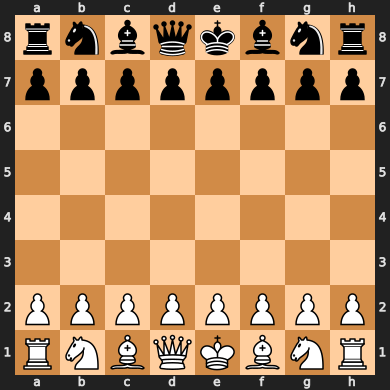

In [ ]:
predictPieceType(piece_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 18ms/step
p 0.41950938
r 0.005648088
n 0.29850805
b 0.12443986
q 0.011103661
k 0.14079103


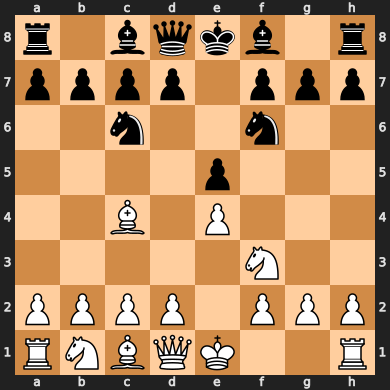

In [ ]:
predictPieceType(piece_model, 'r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

1/1 [==============================] - 0s 18ms/step
p 0.0130889565
r 0.15813467
n 0.7549085
b 0.058489084
q 0.00073407654
k 0.014644697


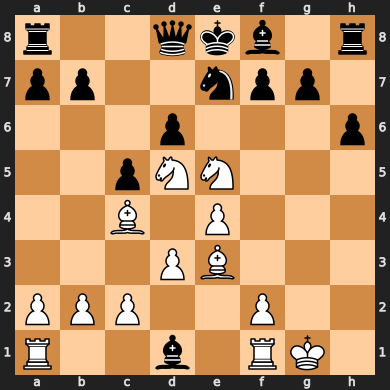

In [ ]:
predictPieceType(piece_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 19ms/step
p 0.676073
r 0.0065442002
n 0.0006346132
b 0.0035640036
q 0.00104351
k 0.31214064


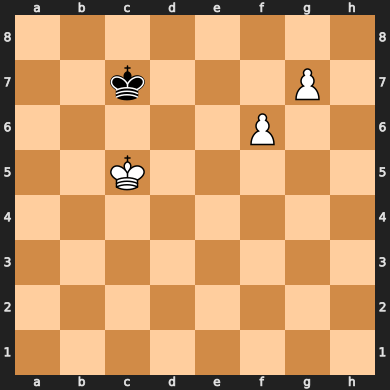

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 19ms/step
p 0.1182437
r 0.040875975
n 0.0048353854
b 0.019194795
q 0.006649727
k 0.8102004


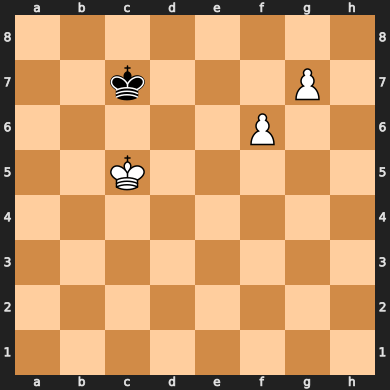

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 19ms/step
p 0.463995
r 0.016437849
n 0.001318507
b 0.0053176186
q 0.0027651978
k 0.5101658


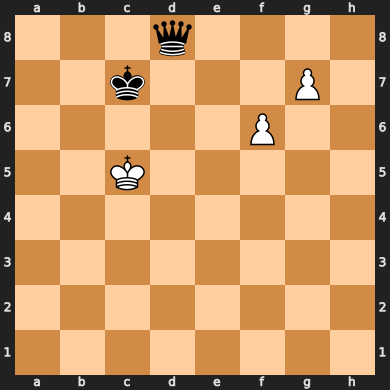

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 17ms/step
p 0.038017996
r 0.006572019
n 0.002045004
b 0.0057557886
q 0.5706336
k 0.37697557


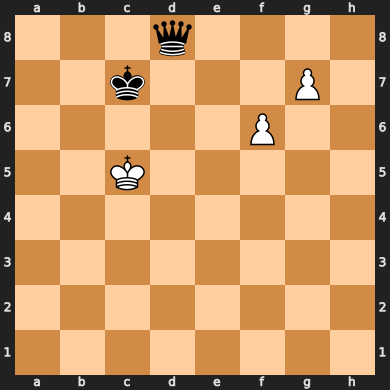

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

### Train and test pawn move model

In [ ]:
pP_X_train, pP_y_train = loadObj('pP_X_train_6000'), loadObj('pP_y_train_6000')
pP_X_test, pP_y_test = loadObj('pP_X_test_6000'), loadObj('pP_y_test_6000')

Loading object from pP_X_train_6000
Loading object from pP_y_train_6000
Loading object from pP_X_test_6000
Loading object from pP_y_test_6000


In [ ]:
pP_X_train = np.reshape(pP_X_train, (len(pP_X_train), 6,8,8))
pP_X_test = np.reshape(pP_X_test, (len(pP_X_test), 6,8,8))

In [ ]:
from tensorflow.keras import models

pMove_model = models.load_model('pMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

pMove_model.fit(
  pP_X_train, pP_y_train,
  validation_data=((pP_X_test, pP_y_test)),
  callbacks=[earlyStopping],
  batch_size=256,
  epochs=50,
  verbose=1,
)
pMove_model.save('pMove_model_EricRosen.keras')

Epoch 1/50
440/440 [==============================] - 5s 6ms/step - loss: 1.3514 - sparse_categorical_accuracy: 0.5590 - sparse_top_k_categorical_accuracy: 0.9253 - val_loss: 1.2347 - val_sparse_categorical_accuracy: 0.5848 - val_sparse_top_k_categorical_accuracy: 0.9462
Epoch 2/50
440/440 [==============================] - 2s 5ms/step - loss: 1.1915 - sparse_categorical_accuracy: 0.5943 - sparse_top_k_categorical_accuracy: 0.9504 - val_loss: 1.2054 - val_sparse_categorical_accuracy: 0.5904 - val_sparse_top_k_categorical_accuracy: 0.9503
Epoch 3/50
440/440 [==============================] - 2s 5ms/step - loss: 1.1359 - sparse_categorical_accuracy: 0.6094 - sparse_top_k_categorical_accuracy: 0.9563 - val_loss: 1.1505 - val_sparse_categorical_accuracy: 0.6060 - val_sparse_top_k_categorical_accuracy: 0.9590
Epoch 4/50
440/440 [==============================] - 2s 5ms/step - loss: 1.0993 - sparse_categorical_accuracy: 0.6193 - sparse_top_k_categorical_accuracy: 0.9601 - val_loss: 1.1691 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 6)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(p, (8,8)))

In [ ]:
predictPieceType(pMove_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 122ms/step
[['0.0' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0']
 ['0.0' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0']
 ['0.000169' '0.005755' '0.002337' '0.009824' '0.011059' '0.000371'
  '0.011563' '0.00012']
 ['0.000273' '0.001411' '0.019695' '0.657188' '0.27611' '0.002013'
  '0.001033' '0.001041']
 ['3e-06' '7e-06' '6e-06' '9e-06' '1e-06' '1e-06' '1e-06' '2e-06']
 ['0.0' '0.0' '1e-06' '1e-06' '0.0' '0.0' '1e-06' '0.0']
 ['0.0' '3e-06' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0']
 ['0.0' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0' '0.0']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 5 0 4 0]
 [0 0 3 1 2 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

[[ 0  0  0  0  0  0  0  0]
 [ 1  1  1  1  1  1  1  1]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [-1 -1 -1 -1 -1 -1 -1 -1]
 [ 0  0  0  0  0  0  0  0]]


### Train and test rook move model

In [ ]:
pR_X_train, pR_y_train = loadObj('pR_X_train_6000'), loadObj('pR_y_train_6000')
pR_X_test, pR_y_test = loadObj('pR_X_test_6000'), loadObj('pR_y_test_6000')

pR_X_train = np.reshape(pR_X_train, (len(pR_X_train), 6,8,8))
pR_X_test = np.reshape(pR_X_test, (len(pR_X_test), 6,8,8))

Loading object from pR_X_train_6000
Loading object from pR_y_train_6000
Loading object from pR_X_test_6000
Loading object from pR_y_test_6000


In [ ]:
from tensorflow.keras import models, callbacks

rMove_model = models.load_model('rMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

rMove_model.fit(
  pR_X_train, pR_y_train,
  validation_data=((pR_X_test, pR_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
rMove_model.save('rMove_model_EricRosen.keras')

Epoch 1/50
287/287 [==============================] - 9s 10ms/step - loss: 1.8581 - sparse_categorical_accuracy: 0.4336 - sparse_top_k_categorical_accuracy: 0.8207 - val_loss: 1.7934 - val_sparse_categorical_accuracy: 0.4540 - val_sparse_top_k_categorical_accuracy: 0.8248
Epoch 2/50
287/287 [==============================] - 2s 7ms/step - loss: 1.6626 - sparse_categorical_accuracy: 0.4805 - sparse_top_k_categorical_accuracy: 0.8618 - val_loss: 1.7733 - val_sparse_categorical_accuracy: 0.4577 - val_sparse_top_k_categorical_accuracy: 0.8381
Epoch 3/50
287/287 [==============================] - 2s 8ms/step - loss: 1.5155 - sparse_categorical_accuracy: 0.5207 - sparse_top_k_categorical_accuracy: 0.8881 - val_loss: 1.7891 - val_sparse_categorical_accuracy: 0.4558 - val_sparse_top_k_categorical_accuracy: 0.8377
Epoch 4/50
287/287 [==============================] - 3s 12ms/step - loss: 1.3760 - sparse_categorical_accuracy: 0.5584 - sparse_top_k_categorical_accuracy: 0.9099 - val_loss: 1.7977 

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.2 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(r, (8,8)))

In [ ]:
predictPieceType(rMove_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 290ms/step
[['2.06e-06' '0.00232801' '0.00021134' '0.99558383' '0.0015131'
  '2.748e-05' '1.938e-05' '7.83e-06']
 ['4.9e-07' '1.07e-06' '9.1e-07' '2.37e-06' '6.99e-06' '6.795e-05'
  '7.37e-06' '6.1e-07']
 ['2.37e-06' '1.13e-06' '1.7e-07' '2.43e-06' '2.04e-06' '6.379e-05'
  '1.91e-06' '1.85e-06']
 ['8.2e-07' '4.1e-07' '1.06e-06' '3.06e-06' '2.4e-07' '4.88e-06'
  '2.5e-07' '1.77e-06']
 ['3.5e-07' '4.4e-07' '7.1e-07' '3.6e-07' '1.8e-07' '1.89e-06' '3.8e-07'
  '8e-07']
 ['1.33e-06' '1.5e-07' '4e-08' '3.81e-06' '1.8e-07' '7.42e-06' '2.3e-06'
  '6.1e-07']
 ['8.02e-06' '3.803e-05' '2.1e-07' '6e-07' '3.72e-06' '5.098e-05' '1e-06'
  '6.2e-07']
 ['1.31e-06' '4e-08' '2.4e-07' '2.89e-06' '6e-08' '1.14e-06' '5e-07'
  '8e-07']]
[[0 2 4 1 3 0 0 0]
 [0 0 0 0 0 5 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

[[ 1  0  0  0  0  1  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]

### Train and test knight move model

In [ ]:
pN_X_train, pN_y_train = loadObj('pN_X_train_6000'), loadObj('pN_y_train_6000')
pN_X_test, pN_y_test = loadObj('pN_X_test_6000'), loadObj('pN_y_test_6000')

pN_X_train = np.reshape(pN_X_train, (len(pN_X_train), 6,8,8))
pN_X_test = np.reshape(pN_X_test, (len(pN_X_test), 6,8,8))

Loading object from pN_X_train_6000
Loading object from pN_y_train_6000
Loading object from pN_X_test_6000
Loading object from pN_y_test_6000


In [ ]:
from tensorflow.keras import models

nMove_model = models.load_model('nMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

nMove_model.fit(
  pN_X_train, pN_y_train,
  validation_data=(pN_X_test, pN_y_test),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
nMove_model.save('nMove_model_EricRosen.keras')

Epoch 1/50
274/274 [==============================] - 3s 6ms/step - loss: 1.0647 - sparse_categorical_accuracy: 0.6268 - sparse_top_k_categorical_accuracy: 0.9691 - val_loss: 1.0327 - val_sparse_categorical_accuracy: 0.6342 - val_sparse_top_k_categorical_accuracy: 0.9742
Epoch 2/50
274/274 [==============================] - 1s 4ms/step - loss: 0.9260 - sparse_categorical_accuracy: 0.6726 - sparse_top_k_categorical_accuracy: 0.9802 - val_loss: 1.0230 - val_sparse_categorical_accuracy: 0.6392 - val_sparse_top_k_categorical_accuracy: 0.9747
Epoch 3/50
274/274 [==============================] - 1s 5ms/step - loss: 0.8413 - sparse_categorical_accuracy: 0.7010 - sparse_top_k_categorical_accuracy: 0.9846 - val_loss: 0.9881 - val_sparse_categorical_accuracy: 0.6568 - val_sparse_top_k_categorical_accuracy: 0.9760
Epoch 4/50
274/274 [==============================] - 1s 5ms/step - loss: 0.7756 - sparse_categorical_accuracy: 0.7230 - sparse_top_k_categorical_accuracy: 0.9883 - val_loss: 1.0219 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(n, (8,8)))

In [ ]:
predictPieceType(nMove_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 94ms/step
[['3.75e-06' '9e-08' '1.1e-07' '5.9e-07' '8e-08' '6e-08' '9.37e-06'
  '2.028e-05']
 ['8e-07' '6e-08' '8e-08' '0.00012218' '1.533e-05' '1.7e-06' '3e-08'
  '9e-08']
 ['0.00018314' '1.956e-05' '0.10335527' '2.73e-06' '2.618e-05'
  '0.89530855' '2.136e-05' '0.00070858']
 ['8e-08' '6.3e-07' '1.045e-05' '9.41e-06' '8.558e-05' '2.008e-05'
  '1.12e-06' '2.48e-06']
 ['5.2e-07' '3.4e-07' '4.5e-07' '6.07e-06' '1.2e-06' '4.81e-06' '3.6e-07'
  '7.6e-07']
 ['8.3e-07' '2.8e-07' '8e-08' '3e-07' '1.4e-07' '8e-08' '3.8e-07'
  '6.9e-07']
 ['1.48e-06' '1.32e-06' '3.24e-06' '4.3e-07' '1.3e-07' '5.19e-06'
  '3.2e-06' '1.78e-06']
 ['5.63e-06' '1.85e-06' '1.04e-06' '1.504e-05' '4.9e-07' '5.4e-07'
  '8.84e-06' '2.63e-06']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 5 0 0 0 0]
 [4 0 2 0 0 1 0 3]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 0 0]]

[[ 0  1  0  0  0  0  1  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0]
 [ 0 

### Train and test bishop move model

In [ ]:
pB_X_train, pB_y_train = loadObj('pB_X_train_6000'), loadObj('pB_y_train_6000')
pB_X_test, pB_y_test = loadObj('pB_X_test_6000'), loadObj('pB_y_test_6000')

pB_X_train = np.reshape(pB_X_train, (len(pB_X_train), 6,8,8))
pB_X_test = np.reshape(pB_X_test, (len(pB_X_test), 6,8,8))

Loading object from pB_X_train_6000
Loading object from pB_y_train_6000
Loading object from pB_X_test_6000
Loading object from pB_y_test_6000


In [ ]:
from tensorflow.keras import models

bMove_model = models.load_model('bMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

bMove_model.fit(
  pB_X_train, pB_y_train,
  validation_data=((pB_X_test, pB_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
bMove_model.save('bMove_model_EricRosen.keras')

Epoch 1/50
241/241 [==============================] - 2s 6ms/step - loss: 1.2830 - sparse_categorical_accuracy: 0.5589 - sparse_top_k_categorical_accuracy: 0.9368 - val_loss: 1.3443 - val_sparse_categorical_accuracy: 0.5429 - val_sparse_top_k_categorical_accuracy: 0.9289
Epoch 2/50
241/241 [==============================] - 1s 5ms/step - loss: 1.0767 - sparse_categorical_accuracy: 0.6264 - sparse_top_k_categorical_accuracy: 0.9609 - val_loss: 1.2817 - val_sparse_categorical_accuracy: 0.5643 - val_sparse_top_k_categorical_accuracy: 0.9341
Epoch 3/50
241/241 [==============================] - 1s 5ms/step - loss: 0.9486 - sparse_categorical_accuracy: 0.6704 - sparse_top_k_categorical_accuracy: 0.9723 - val_loss: 1.3289 - val_sparse_categorical_accuracy: 0.5659 - val_sparse_top_k_categorical_accuracy: 0.9349
Epoch 4/50
241/241 [==============================] - 1s 5ms/step - loss: 0.8405 - sparse_categorical_accuracy: 0.7085 - sparse_top_k_categorical_accuracy: 0.9799 - val_loss: 1.3601 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(b, (8,8)))

In [ ]:
predictPieceType(bMove_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 94ms/step
[['0.00081653' '1.461e-05' '0.00043495' '8.86e-06' '1.68e-06'
  '0.00021121' '2.359e-05' '0.00286898']
 ['0.0001125' '0.02376783' '4.705e-05' '0.00024217' '0.00239251'
  '2.648e-05' '0.15755583' '0.00058737']
 ['0.00082393' '0.00926761' '0.00729303' '0.01582002' '0.02632234'
  '0.01262317' '0.04203242' '0.05403714']
 ['0.00016602' '1.725e-05' '0.11835618' '0.00019631' '0.00408198'
  '0.28144798' '4.589e-05' '0.00111427']
 ['0.00025064' '0.01187013' '3.04e-06' '0.00063145' '0.02160044'
  '5.453e-05' '0.06931098' '0.0006296']
 ['0.00173153' '1.061e-05' '9.273e-05' '6.77e-06' '1.263e-05'
  '0.00015777' '2.933e-05' '0.02593551']
 ['6.681e-05' '0.025325' '0.00082078' '0.00018711' '0.00017824'
  '0.00529812' '0.03101222' '0.00036282']
 ['0.01036507' '0.00011042' '0.00274582' '0.00046021' '0.00016997'
  '0.00096315' '0.00571049' '0.02113833']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 0 0 0 2 0]
 [0 0 0 0 0 0 0 5]
 [0 0 3 0 0 1 0 0]
 [0 0 0 0 0 0 4 0]
 [0 

### Train and test queen move model

In [ ]:
pQ_X_train, pQ_y_train = loadObj('pQ_X_train_6000'), loadObj('pQ_y_train_6000')
pQ_X_test, pQ_y_test = loadObj('pQ_X_test_6000'), loadObj('pQ_y_test_6000')

pQ_X_train = np.reshape(pQ_X_train, (len(pQ_X_train), 6,8,8))
pQ_X_test = np.reshape(pQ_X_test, (len(pQ_X_test), 6,8,8))

Loading object from pQ_X_train_6000
Loading object from pQ_y_train_6000
Loading object from pQ_X_test_6000
Loading object from pQ_y_test_6000


In [ ]:
from tensorflow.keras import models

qMove_model = models.load_model('qMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

qMove_model.fit(
  pQ_X_train, pQ_y_train,
  validation_data=((pQ_X_test, pQ_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
qMove_model.save('qMove_model_EricRosen.keras')

Epoch 1/50
195/195 [==============================] - 3s 8ms/step - loss: 2.0474 - sparse_categorical_accuracy: 0.3899 - sparse_top_k_categorical_accuracy: 0.7829 - val_loss: 2.0161 - val_sparse_categorical_accuracy: 0.3995 - val_sparse_top_k_categorical_accuracy: 0.7895
Epoch 2/50
195/195 [==============================] - 1s 5ms/step - loss: 1.7887 - sparse_categorical_accuracy: 0.4561 - sparse_top_k_categorical_accuracy: 0.8356 - val_loss: 1.9700 - val_sparse_categorical_accuracy: 0.4078 - val_sparse_top_k_categorical_accuracy: 0.7980
Epoch 3/50
195/195 [==============================] - 1s 5ms/step - loss: 1.5923 - sparse_categorical_accuracy: 0.5078 - sparse_top_k_categorical_accuracy: 0.8728 - val_loss: 1.9594 - val_sparse_categorical_accuracy: 0.4165 - val_sparse_top_k_categorical_accuracy: 0.8003
Epoch 4/50
195/195 [==============================] - 1s 5ms/step - loss: 1.4171 - sparse_categorical_accuracy: 0.5538 - sparse_top_k_categorical_accuracy: 0.9000 - val_loss: 2.0230 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(q, (8,8)))

In [ ]:
predictPieceType(qMove_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 74ms/step
[['0.00688341' '0.00398038' '0.02317676' '0.00132639' '0.04664573'
  '0.01290415' '0.0056793' '0.00251617']
 ['0.00014774' '0.00175891' '0.01193857' '0.12226734' '0.00924552'
  '0.00168343' '0.00100696' '0.00028948']
 ['0.00027228' '0.04380256' '0.00232579' '0.17157696' '0.00052451'
  '0.17788199' '0.00165396' '0.00304152']
 ['0.10636922' '0.00144729' '0.00156455' '0.15785135' '0.00432501'
  '0.00342185' '0.03128284' '0.00190998']
 ['0.00053974' '0.00104937' '0.000628' '0.0037169' '0.00082982'
  '0.00045336' '0.00533587' '0.00549802']
 ['0.0012413' '0.00024901' '0.0006602' '0.00616256' '0.00058101'
  '0.00022799' '0.00133083' '0.00022919']
 ['9.859e-05' '0.00018448' '0.00047806' '0.00329534' '0.00027459'
  '2.728e-05' '0.00358032' '9.036e-05']
 ['3.863e-05' '1.919e-05' '0.00049212' '0.00156533' '0.00033621'
  '2.018e-05' '2.934e-05' '3.483e-05']]
[[0 0 0 0 0 0 0 0]
 [0 0 0 4 0 0 0 0]
 [0 0 0 2 0 1 0 0]
 [5 0 0 3 0 0 0 0]
 [0 0 0 0 0 0

### Train and test king move model

In [ ]:
pK_X_train, pK_y_train = loadObj('pK_X_train_6000'), loadObj('pK_y_train_6000')
pK_X_test, pK_y_test = loadObj('pK_X_test_6000'), loadObj('pK_y_test_6000')

pK_X_train = np.reshape(pK_X_train, (len(pK_X_train), 6,8,8))
pK_X_test = np.reshape(pK_X_test, (len(pK_X_test), 6,8,8))

Loading object from pK_X_train_6000
Loading object from pK_y_train_6000
Loading object from pK_X_test_6000
Loading object from pK_y_test_6000


In [ ]:
from tensorflow.keras import models

kMove_model = models.load_model('kMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

kMove_model.fit(
  pK_X_train, pK_y_train,
  validation_data=((pK_X_test, pK_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
kMove_model.save('kMove_model_EricRosen.keras')

Epoch 1/50
269/269 [==============================] - 2s 6ms/step - loss: 1.5211 - sparse_categorical_accuracy: 0.4754 - sparse_top_k_categorical_accuracy: 0.9084 - val_loss: 1.1250 - val_sparse_categorical_accuracy: 0.5604 - val_sparse_top_k_categorical_accuracy: 0.9768
Epoch 2/50
269/269 [==============================] - 1s 5ms/step - loss: 1.0151 - sparse_categorical_accuracy: 0.6020 - sparse_top_k_categorical_accuracy: 0.9841 - val_loss: 1.0338 - val_sparse_categorical_accuracy: 0.5928 - val_sparse_top_k_categorical_accuracy: 0.9853
Epoch 3/50
269/269 [==============================] - 1s 5ms/step - loss: 0.8947 - sparse_categorical_accuracy: 0.6507 - sparse_top_k_categorical_accuracy: 0.9894 - val_loss: 1.0251 - val_sparse_categorical_accuracy: 0.5884 - val_sparse_top_k_categorical_accuracy: 0.9845
Epoch 4/50
269/269 [==============================] - 1s 5ms/step - loss: 0.8070 - sparse_categorical_accuracy: 0.6874 - sparse_top_k_categorical_accuracy: 0.9921 - val_loss: 1.0017 - 

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]
  zipped = sorted(list(zip(pred, [i for i in range(64)])), reverse=True)
  end = [0]*64
  rank = 1
  for _, i in zipped:
    if rank > 5:
      break

    end[i] = rank
    rank += 1

  end = np.reshape(end, (8,8))
  print(np.reshape([str(round(p, 8)) for p in pred], (8,8)))
  print(end, end='\n\n')
  print(np.reshape(k, (8,8)))

In [ ]:
predictPieceType(kMove_model, 'r1bqk2r/pppp1ppp/2n2n2/2b1p3/2B1P3/3P1N2/PPP2PPP/RNBQK2R b KQkq - 1 5')

1/1 [==============================] - 0s 82ms/step
[['0.01349546' '0.01550181' '0.01673972' '0.01570591' '0.01744511'
  '0.0165887' '0.01581844' '0.01582284']
 ['0.01567916' '0.01590682' '0.01505562' '0.01566549' '0.01474544'
  '0.01535768' '0.01613675' '0.01414768']
 ['0.01698557' '0.01612949' '0.01588924' '0.01524147' '0.01597572'
  '0.01580023' '0.01581865' '0.01591585']
 ['0.01533437' '0.0176158' '0.01744866' '0.01494658' '0.01524546'
  '0.01527992' '0.01578456' '0.01527026']
 ['0.01598115' '0.01641345' '0.01491038' '0.01620373' '0.01546621'
  '0.01532282' '0.01525994' '0.01485452']
 ['0.01318906' '0.01560611' '0.01676533' '0.01730558' '0.0147809'
  '0.01601712' '0.01417257' '0.01660474']
 ['0.01684093' '0.01535115' '0.01419256' '0.01449065' '0.01520722'
  '0.01607748' '0.01442867' '0.01601187']
 ['0.01497714' '0.01497538' '0.01562221' '0.01506395' '0.016433'
  '0.01562479' '0.01532133' '0.01603357']]
[[0 0 0 0 3 0 0 0]
 [0 0 0 0 0 0 0 0]
 [5 0 0 0 0 0 0 0]
 [0 1 2 0 0 0 0 0]
 [0 

### Test "macro-model"



In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model_EricRosen.keras')
pMove_model = models.load_model('pMove_model_EricRosen.keras')
rMove_model = models.load_model('rMove_model_EricRosen.keras')
nMove_model = models.load_model('nMove_model_EricRosen.keras')
bMove_model = models.load_model('bMove_model_EricRosen.keras')
qMove_model = models.load_model('qMove_model_EricRosen.keras')
kMove_model = models.load_model('kMove_model_EricRosen.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess
import chess.svg
import IPython

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictMove(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  arrows = []
  colors = ["#000000", "#424242", "#616161", "#757575", "#9E9E9E"]
  for i, prediction in enumerate(predictions[:5]):
    pred, move = prediction
    arrows.append(chess.svg.Arrow(move.from_square,move.to_square, color=colors[i]))

    if verbose:
      print(f'Move {move.uci()}: {pred}')

  display(IPython.display.HTML(chess.svg.board(
      correctedBoard,
      arrows=arrows,
      size=300,
  )))

In [ ]:
predictMove('rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

Move d2d4: 0.6108141541481018
Move e2e4: 0.25662603974342346
Move g1f3: 0.06082999333739281
Move c2c4: 0.018305132165551186
Move g2g3: 0.010747401043772697


In [ ]:
predictMove('r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

Move b1c3: 0.1994238644838333
Move d2d4: 0.19308604300022125
Move d2d3: 0.1813332438468933
Move f3g5: 0.06752147525548935
Move c4f7: 0.05802116170525551


In [ ]:
predictMove('8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

Move g7g8q: 0.6113594770431519
Move g7g8r: 0.6113594770431519
Move g7g8b: 0.6113594770431519
Move g7g8n: 0.6113594770431519
Move f6f7: 0.06353974342346191


In [ ]:
predictMove('3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

Move d1f3: 0.10153040289878845
Move d1d3: 0.09792125225067139
Move d1d4: 0.09005500376224518
Move d1d2: 0.06976296007633209
Move d1e1: 0.02661130763590336


In [ ]:
predictMove('r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

Move e5f7: 0.7025742530822754
Move f1d1: 0.1574363261461258
Move a1d1: 0.1574363261461258
Move e3f4: 0.04070389270782471
Move e5g4: 0.017635565251111984


In [ ]:
import chess.pgn

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    predictMove(node.parent.board().fen(), verbose=False)

### Get "macro-model" accuracy (with only valid moves)

In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model_EricRosen.keras')
pMove_model = models.load_model('pMove_model_EricRosen.keras')
rMove_model = models.load_model('rMove_model_EricRosen.keras')
nMove_model = models.load_model('nMove_model_EricRosen.keras')
bMove_model = models.load_model('bMove_model_EricRosen.keras')
qMove_model = models.load_model('qMove_model_EricRosen.keras')
kMove_model = models.load_model('kMove_model_EricRosen.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPrediction(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  return [move for _, move in predictions]

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPrediction(board.fen(), verbose=False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.266
Top 5 Accuracy: 0.5851
Top 10 Accuracy: 0.766
Top 20 Accuracy: 0.9362


In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0
targetUsername = 'EricRosen'

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)

  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if playerColor != board.turn:
      continue

    pred = getPrediction(board.fen(), verbose=False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.2553
Top 5 Accuracy: 0.5745
Top 10 Accuracy: 0.7872
Top 20 Accuracy: 0.9574


## Method 3.3: Retrain Oshri model with the standard dataset


### Move to Method 3.3 folder

In [ ]:
%cd ./method3.3 # Use new folder to ensure no leakage between Method 3.1-3.2 and Method 3.3
!pwd

/content/drive/MyDrive/Thesis/out/eric_rosen_attempt11
/content/drive/MyDrive/Thesis/out/eric_rosen_attempt11


### Get X and y from pgn

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.4 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "FICS_2000.pgn"
NUM_GAMES = 30000
NUM_TRAIN_GAMES = 24000
NUM_TEST_GAMES = 6000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 39567


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_train = [], []
# Move-in
pP_X_train, pR_X_train, pN_X_train = [], [], []
pB_X_train, pQ_X_train, pK_X_train = [], [], []
pP_y_train, pR_y_train, pN_y_train = [], [], []
pB_y_train, pQ_y_train, pK_y_train = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_train.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_train.append(pieceSym)

    piece_X, piece_y = eval(f'p{pieceSym.upper()}_X_train'), eval(f'p{pieceSym.upper()}_y_train')
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_train), f'X_train_{NUM_GAMES}')
saveObj(np.array(y_train), f'y_train_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_train'), eval(f'p{piece}_y_train')
  saveObj(np.array(piece_X), f'p{piece}_X_train_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_train_{NUM_GAMES}')

100%|██████████| 24000/24000 [24:05<00:00, 16.60it/s]


Saving to X_train_30000
Successfully saved to X_train_30000
Saving to y_train_30000
Successfully saved to y_train_30000
Saving to pP_X_train_30000
Successfully saved to pP_X_train_30000
Saving to pP_y_train_30000
Successfully saved to pP_y_train_30000
Saving to pR_X_train_30000
Successfully saved to pR_X_train_30000
Saving to pR_y_train_30000
Successfully saved to pR_y_train_30000
Saving to pN_X_train_30000
Successfully saved to pN_X_train_30000
Saving to pN_y_train_30000
Successfully saved to pN_y_train_30000
Saving to pB_X_train_30000
Successfully saved to pB_X_train_30000
Saving to pB_y_train_30000
Successfully saved to pB_y_train_30000
Saving to pQ_X_train_30000
Successfully saved to pQ_X_train_30000
Saving to pQ_y_train_30000
Successfully saved to pQ_y_train_30000
Saving to pK_X_train_30000
Successfully saved to pK_X_train_30000
Saving to pK_y_train_30000
Successfully saved to pK_y_train_30000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_test = [], []
# Move-in
pP_X_test, pR_X_test, pN_X_test = [], [], []
pB_X_test, pQ_X_test, pK_X_test = [], [], []
pP_y_test, pR_y_test, pN_y_test = [], [], []
pB_y_test, pQ_y_test, pK_y_test = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_test.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_test.append(pieceSym)

    piece_X, piece_y, pieceBoard = eval(f'p{pieceSym.upper()}_X_test'), eval(f'p{pieceSym.upper()}_y_test'), eval(pieceSym)
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_test), f'X_test_{NUM_GAMES}')
saveObj(np.array(y_test), f'y_test_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_test'), eval(f'p{piece}_y_test')
  saveObj(np.array(piece_X), f'p{piece}_X_test_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_test_{NUM_GAMES}')

100%|██████████| 6000/6000 [06:10<00:00, 16.20it/s]


Saving to X_test_30000
Successfully saved to X_test_30000
Saving to y_test_30000
Successfully saved to y_test_30000
Saving to pP_X_test_30000
Successfully saved to pP_X_test_30000
Saving to pP_y_test_30000
Successfully saved to pP_y_test_30000
Saving to pR_X_test_30000
Successfully saved to pR_X_test_30000
Saving to pR_y_test_30000
Successfully saved to pR_y_test_30000
Saving to pN_X_test_30000
Successfully saved to pN_X_test_30000
Saving to pN_y_test_30000
Successfully saved to pN_y_test_30000
Saving to pB_X_test_30000
Successfully saved to pB_X_test_30000
Saving to pB_y_test_30000
Successfully saved to pB_y_test_30000
Saving to pQ_X_test_30000
Successfully saved to pQ_X_test_30000
Saving to pQ_y_test_30000
Successfully saved to pQ_y_test_30000
Saving to pK_X_test_30000
Successfully saved to pK_X_test_30000
Saving to pK_y_test_30000
Successfully saved to pK_y_test_30000


### Train and test piece model

In [ ]:
X_train, y_train = loadObj('X_train_30000'), loadObj('y_train_30000')
X_test, y_test = loadObj('X_test_30000'), loadObj('y_test_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_30000
Loading object from y_train_30000
Loading object from X_test_30000
Loading object from y_test_30000


In [ ]:
from keras.utils import to_categorical

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

y_train = to_categorical([pieceMap[piece] for piece in y_train])
y_test = to_categorical([pieceMap[piece] for piece in y_test])

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

piece_model = models.Sequential()
piece_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
piece_model.add(layers.Conv2D(filters=16, kernel_size=2, activation='relu', padding='valid', data_format='channels_first'))
piece_model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
piece_model.add(layers.Flatten())
piece_model.add(layers.Dense(6, activation='softmax'))

piece_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='categorical_crossentropy', metrics=['categorical_accuracy'])
piece_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 8, 8)          3520      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 7, 7)          4112      
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 7, 7)          9280      
                                                                 
 flatten (Flatten)           (None, 3136)              0         
                                                                 
 dense (Dense)               (None, 6)                 18822     
                                                                 
Total params: 35734 (139.59 KB)
Trainable params: 35734 (139.59 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
from tensorflow.keras import callbacks

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_categorical_accuracy',
    restore_best_weights=True,
)

piece_model.fit(
  X_train, y_train,
  validation_data=((X_test, y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
piece_model.save('piece_model.keras')

Epoch 1/50
7639/7639 [==============================] - 36s 4ms/step - loss: 1.2779 - categorical_accuracy: 0.4575 - val_loss: 1.1911 - val_categorical_accuracy: 0.5073
Epoch 2/50
7639/7639 [==============================] - 30s 4ms/step - loss: 1.1634 - categorical_accuracy: 0.5170 - val_loss: 1.1552 - val_categorical_accuracy: 0.5216
Epoch 3/50
7639/7639 [==============================] - 30s 4ms/step - loss: 1.1375 - categorical_accuracy: 0.5294 - val_loss: 1.1477 - val_categorical_accuracy: 0.5228
Epoch 4/50
7639/7639 [==============================] - 30s 4ms/step - loss: 1.1249 - categorical_accuracy: 0.5353 - val_loss: 1.1330 - val_categorical_accuracy: 0.5307
Epoch 5/50
7639/7639 [==============================] - 30s 4ms/step - loss: 1.1172 - categorical_accuracy: 0.5388 - val_loss: 1.1338 - val_categorical_accuracy: 0.5300
Epoch 6/50
7639/7639 [==============================] - 30s 4ms/step - loss: 1.1117 - categorical_accuracy: 0.5412 - val_loss: 1.1261 - val_categorical_acc

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.7 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
  pieceMap = {}
  for i, piece in enumerate(pieceList):
    pieceMap[piece] = i

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]

  for i in range(6):
    print(pieceList[i], pred[i])
  display(board)

1/1 [==============================] - 0s 185ms/step
p 0.8795995
r 0.00013665768
n 0.119400375
b 0.0007421681
q 9.043984e-05
k 3.083506e-05


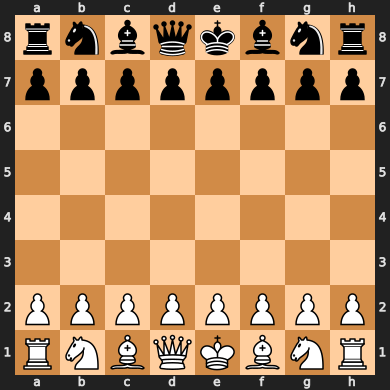

In [ ]:
predictPieceType(piece_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 18ms/step
p 0.565797
r 0.002759376
n 0.18643135
b 0.021839298
q 0.022760186
k 0.20041281


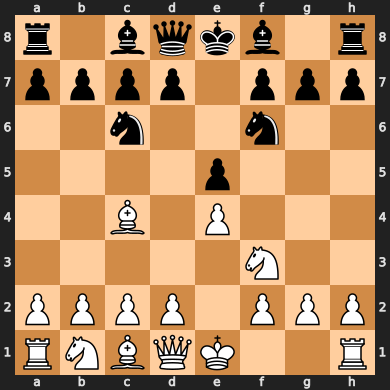

In [ ]:
predictPieceType(piece_model, 'r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

1/1 [==============================] - 0s 19ms/step
p 0.0120355645
r 0.14507371
n 0.7721126
b 0.045238104
q 0.00051324733
k 0.02502678


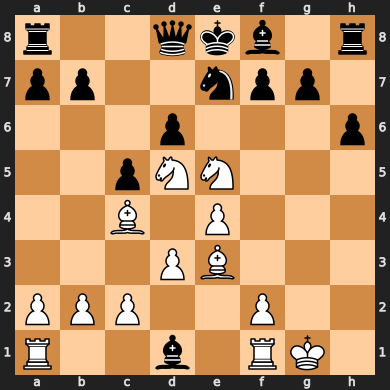

In [ ]:
predictPieceType(piece_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 19ms/step
p 0.7036535
r 0.011063806
n 0.0029193356
b 0.008763618
q 0.0018993436
k 0.2717005


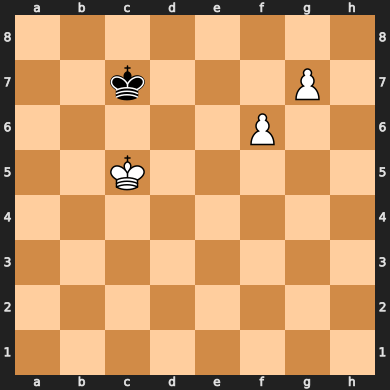

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 21ms/step
p 0.08730608
r 0.048517674
n 0.020107552
b 0.030969568
q 0.003712825
k 0.8093864


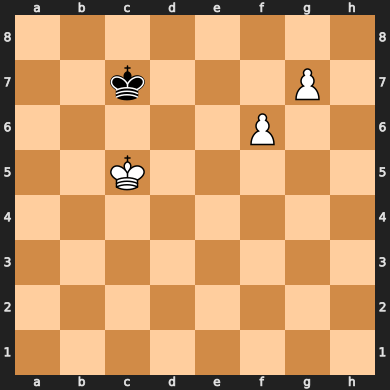

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 19ms/step
p 0.6293066
r 0.0230557
n 0.005032254
b 0.011123477
q 0.0027505506
k 0.32873133


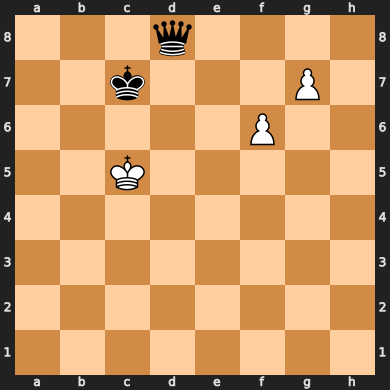

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 18ms/step
p 0.024055194
r 0.011826224
n 0.004352235
b 0.014252584
q 0.65071696
k 0.29479688


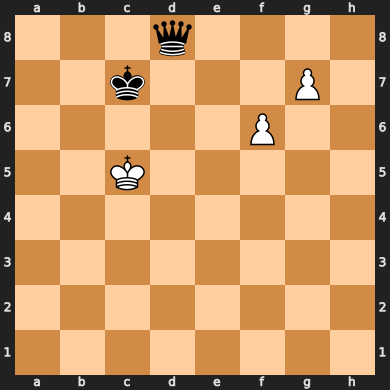

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

### Train and test pawn move model

In [ ]:
pP_X_train, pP_y_train = loadObj('pP_X_train_30000'), loadObj('pP_y_train_30000')
pP_X_test, pP_y_test = loadObj('pP_X_test_30000'), loadObj('pP_y_test_30000')

Loading object from pP_X_train_30000
Loading object from pP_y_train_30000
Loading object from pP_X_test_30000
Loading object from pP_y_test_30000


In [ ]:
pP_X_train = np.reshape(pP_X_train, (len(pP_X_train), 6,8,8))
pP_X_test = np.reshape(pP_X_test, (len(pP_X_test), 6,8,8))

In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

pMove_model = models.Sequential()
pMove_model.add(layers.Conv2D(filters=32, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
pMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
pMove_model.add(layers.Conv2D(filters=1, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
pMove_model.add(layers.Flatten())
pMove_model.add(layers.Dense(128, activation='relu'))
pMove_model.add(layers.Dense(64, activation='softmax'))

pMove_model.compile(optimizer=optimizers.Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
pMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 8, 8)          1760      
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 8, 8)          51264     
                                                                 
 conv2d_2 (Conv2D)           (None, 1, 8, 8)           577       
                                                                 
 flatten (Flatten)           (None, 64)                0         
                                                                 
 dense (Dense)               (None, 128)               8320      
                                                                 
 dense_1 (Dense)             (None, 64)                8256      
                                                                 
Total params: 70177 (274.13 KB)
Trainable params: 70177 

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

pMove_model.fit(
  pP_X_train, pP_y_train,
  validation_data=((pP_X_test, pP_y_test)),
  callbacks=[earlyStopping],
  batch_size=256,
  epochs=50,
  verbose=1,
)
pMove_model.save('pMove_model.keras')

Epoch 1/50
2006/2006 [==============================] - 14s 5ms/step - loss: 1.5870 - sparse_categorical_accuracy: 0.4750 - sparse_top_k_categorical_accuracy: 0.8786 - val_loss: 1.2791 - val_sparse_categorical_accuracy: 0.5549 - val_sparse_top_k_categorical_accuracy: 0.9441
Epoch 2/50
2006/2006 [==============================] - 10s 5ms/step - loss: 1.2201 - sparse_categorical_accuracy: 0.5688 - sparse_top_k_categorical_accuracy: 0.9497 - val_loss: 1.2026 - val_sparse_categorical_accuracy: 0.5730 - val_sparse_top_k_categorical_accuracy: 0.9510
Epoch 3/50
2006/2006 [==============================] - 10s 5ms/step - loss: 1.1681 - sparse_categorical_accuracy: 0.5837 - sparse_top_k_categorical_accuracy: 0.9556 - val_loss: 1.2011 - val_sparse_categorical_accuracy: 0.5763 - val_sparse_top_k_categorical_accuracy: 0.9505
Epoch 4/50
2006/2006 [==============================] - 10s 5ms/step - loss: 1.1404 - sparse_categorical_accuracy: 0.5915 - sparse_top_k_categorical_accuracy: 0.9586 - val_los

### Train and test rook move model

In [ ]:
pR_X_train, pR_y_train = loadObj('pR_X_train_30000'), loadObj('pR_y_train_30000')
pR_X_test, pR_y_test = loadObj('pR_X_test_30000'), loadObj('pR_y_test_30000')

pR_X_train = np.reshape(pR_X_train, (len(pR_X_train), 6,8,8))
pR_X_test = np.reshape(pR_X_test, (len(pR_X_test), 6,8,8))

Loading object from pR_X_train_30000
Loading object from pR_y_train_30000
Loading object from pR_X_test_30000
Loading object from pR_y_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

rMove_model = models.Sequential()
rMove_model.add(layers.Conv2D(filters=32, kernel_size=2, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
rMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
rMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
rMove_model.add(layers.Flatten())
rMove_model.add(layers.Dense(64, activation='relu'))
rMove_model.add(layers.Dense(64, activation='softmax'))

rMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
rMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 8, 8)          800       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 8, 8)          51264     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 8, 8)          102464    
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 dense (Dense)               (None, 64)                262208    
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
Total params: 420896 (1.61 MB)
Trainable params: 420896 

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

rMove_model.fit(
  pR_X_train, pR_y_train,
  validation_data=((pR_X_test, pR_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
rMove_model.save('rMove_model.keras')

Epoch 1/50
1199/1199 [==============================] - 9s 6ms/step - loss: 2.4607 - sparse_categorical_accuracy: 0.3226 - sparse_top_k_categorical_accuracy: 0.6631 - val_loss: 2.0832 - val_sparse_categorical_accuracy: 0.3698 - val_sparse_top_k_categorical_accuracy: 0.7852
Epoch 2/50
1199/1199 [==============================] - 6s 5ms/step - loss: 1.7155 - sparse_categorical_accuracy: 0.4687 - sparse_top_k_categorical_accuracy: 0.8454 - val_loss: 1.8011 - val_sparse_categorical_accuracy: 0.4428 - val_sparse_top_k_categorical_accuracy: 0.8395
Epoch 3/50
1199/1199 [==============================] - 6s 5ms/step - loss: 1.5355 - sparse_categorical_accuracy: 0.5120 - sparse_top_k_categorical_accuracy: 0.8820 - val_loss: 1.6773 - val_sparse_categorical_accuracy: 0.4720 - val_sparse_top_k_categorical_accuracy: 0.8587
Epoch 4/50
1199/1199 [==============================] - 6s 5ms/step - loss: 1.4226 - sparse_categorical_accuracy: 0.5406 - sparse_top_k_categorical_accuracy: 0.9028 - val_loss: 1

### Train and test knight move model

In [ ]:
pN_X_train, pN_y_train = loadObj('pN_X_train_30000'), loadObj('pN_y_train_30000')
pN_X_test, pN_y_test = loadObj('pN_X_test_30000'), loadObj('pN_y_test_30000')

pN_X_train = np.reshape(pN_X_train, (len(pN_X_train), 6,8,8))
pN_X_test = np.reshape(pN_X_test, (len(pN_X_test), 6,8,8))

Loading object from pN_X_train_30000
Loading object from pN_y_train_30000
Loading object from pN_X_test_30000
Loading object from pN_y_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

nMove_model = models.Sequential()
nMove_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
nMove_model.add(layers.Conv2D(filters=16, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
nMove_model.add(layers.Conv2D(filters=64, kernel_size=2, activation='relu', padding='same', data_format='channels_first'))
nMove_model.add(layers.Flatten())
nMove_model.add(layers.Dense(64, activation='softmax'))

nMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
nMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 8, 8)          3520      
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 8, 8)          25616     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 8, 8)          4160      
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 dense (Dense)               (None, 64)                262208    
                                                                 
Total params: 295504 (1.13 MB)
Trainable params: 295504 (1.13 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

nMove_model.fit(
  pN_X_train, pN_y_train,
  validation_data=(pN_X_test, pN_y_test),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
nMove_model.save('nMove_model.keras')

Epoch 1/50
1285/1285 [==============================] - 8s 5ms/step - loss: 1.3551 - sparse_categorical_accuracy: 0.5478 - sparse_top_k_categorical_accuracy: 0.9209 - val_loss: 1.0685 - val_sparse_categorical_accuracy: 0.6217 - val_sparse_top_k_categorical_accuracy: 0.9712
Epoch 2/50
1285/1285 [==============================] - 6s 4ms/step - loss: 0.9822 - sparse_categorical_accuracy: 0.6476 - sparse_top_k_categorical_accuracy: 0.9774 - val_loss: 0.9792 - val_sparse_categorical_accuracy: 0.6478 - val_sparse_top_k_categorical_accuracy: 0.9796
Epoch 3/50
1285/1285 [==============================] - 5s 4ms/step - loss: 0.8998 - sparse_categorical_accuracy: 0.6729 - sparse_top_k_categorical_accuracy: 0.9830 - val_loss: 0.9396 - val_sparse_categorical_accuracy: 0.6590 - val_sparse_top_k_categorical_accuracy: 0.9812
Epoch 4/50
1285/1285 [==============================] - 6s 4ms/step - loss: 0.8516 - sparse_categorical_accuracy: 0.6897 - sparse_top_k_categorical_accuracy: 0.9858 - val_loss: 0

### Train and test bishop move model

In [ ]:
pB_X_train, pB_y_train = loadObj('pB_X_train_30000'), loadObj('pB_y_train_30000')
pB_X_test, pB_y_test = loadObj('pB_X_test_30000'), loadObj('pB_y_test_30000')

pB_X_train = np.reshape(pB_X_train, (len(pB_X_train), 6,8,8))
pB_X_test = np.reshape(pB_X_test, (len(pB_X_test), 6,8,8))

Loading object from pB_X_train_30000
Loading object from pB_y_train_30000
Loading object from pB_X_test_30000
Loading object from pB_y_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

bMove_model = models.Sequential()
bMove_model.add(layers.Conv2D(filters=32, kernel_size=2, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
bMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
bMove_model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu', padding='same', data_format='channels_first'))
bMove_model.add(layers.Flatten())
bMove_model.add(layers.Dense(64, activation='softmax'))

bMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
bMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 8, 8)          800       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 8, 8)          51264     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 8, 8)          36928     
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 dense (Dense)               (None, 64)                262208    
                                                                 
Total params: 351200 (1.34 MB)
Trainable params: 351200 (1.34 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

bMove_model.fit(
  pB_X_train, pB_y_train,
  validation_data=((pB_X_test, pB_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
bMove_model.save('bMove_model.keras')

Epoch 1/50
1161/1161 [==============================] - 8s 5ms/step - loss: 1.6451 - sparse_categorical_accuracy: 0.4699 - sparse_top_k_categorical_accuracy: 0.8600 - val_loss: 1.3101 - val_sparse_categorical_accuracy: 0.5457 - val_sparse_top_k_categorical_accuracy: 0.9303
Epoch 2/50
1161/1161 [==============================] - 5s 4ms/step - loss: 1.1896 - sparse_categorical_accuracy: 0.5832 - sparse_top_k_categorical_accuracy: 0.9473 - val_loss: 1.1998 - val_sparse_categorical_accuracy: 0.5787 - val_sparse_top_k_categorical_accuracy: 0.9463
Epoch 3/50
1161/1161 [==============================] - 5s 5ms/step - loss: 1.0772 - sparse_categorical_accuracy: 0.6186 - sparse_top_k_categorical_accuracy: 0.9608 - val_loss: 1.1626 - val_sparse_categorical_accuracy: 0.5914 - val_sparse_top_k_categorical_accuracy: 0.9518
Epoch 4/50
1161/1161 [==============================] - 5s 4ms/step - loss: 1.0064 - sparse_categorical_accuracy: 0.6434 - sparse_top_k_categorical_accuracy: 0.9672 - val_loss: 1

### Train and test queen move model

In [ ]:
pQ_X_train, pQ_y_train = loadObj('pQ_X_train_30000'), loadObj('pQ_y_train_30000')
pQ_X_test, pQ_y_test = loadObj('pQ_X_test_30000'), loadObj('pQ_y_test_30000')

pQ_X_train = np.reshape(pQ_X_train, (len(pQ_X_train), 6,8,8))
pQ_X_test = np.reshape(pQ_X_test, (len(pQ_X_test), 6,8,8))

Loading object from pQ_X_train_30000
Loading object from pQ_y_train_30000
Loading object from pQ_X_test_30000
Loading object from pQ_y_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

qMove_model = models.Sequential()
qMove_model.add(layers.Conv2D(filters=32, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
qMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
qMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
qMove_model.add(layers.Flatten())
qMove_model.add(layers.Dense(64, activation='relu'))
qMove_model.add(layers.Dense(64, activation='softmax'))

qMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
qMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 8, 8)          1760      
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 8, 8)          51264     
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 8, 8)          102464    
                                                                 
 flatten (Flatten)           (None, 4096)              0         
                                                                 
 dense (Dense)               (None, 64)                262208    
                                                                 
 dense_1 (Dense)             (None, 64)                4160      
                                                                 
Total params: 421856 (1.61 MB)
Trainable params: 421856 

In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

qMove_model.fit(
  pQ_X_train, pQ_y_train,
  validation_data=((pQ_X_test, pQ_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
qMove_model.save('qMove_model.keras')

Epoch 1/50
902/902 [==============================] - 7s 6ms/step - loss: 2.7078 - sparse_categorical_accuracy: 0.2688 - sparse_top_k_categorical_accuracy: 0.6053 - val_loss: 2.3595 - val_sparse_categorical_accuracy: 0.3234 - val_sparse_top_k_categorical_accuracy: 0.7204
Epoch 2/50
902/902 [==============================] - 4s 5ms/step - loss: 1.9649 - sparse_categorical_accuracy: 0.4026 - sparse_top_k_categorical_accuracy: 0.8006 - val_loss: 2.0238 - val_sparse_categorical_accuracy: 0.3798 - val_sparse_top_k_categorical_accuracy: 0.7987
Epoch 3/50
902/902 [==============================] - 4s 5ms/step - loss: 1.7279 - sparse_categorical_accuracy: 0.4542 - sparse_top_k_categorical_accuracy: 0.8533 - val_loss: 1.8969 - val_sparse_categorical_accuracy: 0.4184 - val_sparse_top_k_categorical_accuracy: 0.8309
Epoch 4/50
902/902 [==============================] - 4s 5ms/step - loss: 1.5830 - sparse_categorical_accuracy: 0.4908 - sparse_top_k_categorical_accuracy: 0.8820 - val_loss: 1.8619 - 

### Train and test king move model

In [ ]:
pK_X_train, pK_y_train = loadObj('pK_X_train_30000'), loadObj('pK_y_train_30000')
pK_X_test, pK_y_test = loadObj('pK_X_test_30000'), loadObj('pK_y_test_30000')

pK_X_train = np.reshape(pK_X_train, (len(pK_X_train), 6,8,8))
pK_X_test = np.reshape(pK_X_test, (len(pK_X_test), 6,8,8))

Loading object from pK_X_train_30000
Loading object from pK_y_train_30000
Loading object from pK_X_test_30000
Loading object from pK_y_test_30000


In [ ]:
# Will use original model
from tensorflow.keras import models, layers, callbacks, metrics, optimizers, initializers

kMove_model = models.Sequential()
kMove_model.add(layers.Conv2D(filters=64, kernel_size=3, input_shape=(6,8,8), activation='relu', padding='same', data_format='channels_first'))
kMove_model.add(layers.Conv2D(filters=64, kernel_size=5, activation='relu', padding='same', data_format='channels_first'))
kMove_model.add(layers.Conv2D(filters=32, kernel_size=2, activation='relu', padding='same', data_format='channels_first'))
kMove_model.add(layers.Flatten())
kMove_model.add(layers.Dense(64, activation='softmax'))

kMove_model.compile(optimizer=optimizers.RMSprop(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['sparse_categorical_accuracy', 'sparse_top_k_categorical_accuracy'])
kMove_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 64, 8, 8)          3520      
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 8, 8)          102464    
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 8, 8)          8224      
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 64)                131136    
                                                                 
Total params: 245344 (958.38 KB)
Trainable params: 245344 (958.38 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

kMove_model.fit(
  pK_X_train, pK_y_train,
  validation_data=((pK_X_test, pK_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
kMove_model.save('kMove_model.keras')

Epoch 1/50
1040/1040 [==============================] - 7s 6ms/step - loss: 1.2049 - sparse_categorical_accuracy: 0.5516 - sparse_top_k_categorical_accuracy: 0.9408 - val_loss: 0.9788 - val_sparse_categorical_accuracy: 0.6076 - val_sparse_top_k_categorical_accuracy: 0.9866
Epoch 2/50
1040/1040 [==============================] - 5s 5ms/step - loss: 0.8437 - sparse_categorical_accuracy: 0.6669 - sparse_top_k_categorical_accuracy: 0.9908 - val_loss: 0.8500 - val_sparse_categorical_accuracy: 0.6628 - val_sparse_top_k_categorical_accuracy: 0.9910
Epoch 3/50
1040/1040 [==============================] - 5s 4ms/step - loss: 0.7748 - sparse_categorical_accuracy: 0.6942 - sparse_top_k_categorical_accuracy: 0.9932 - val_loss: 0.8441 - val_sparse_categorical_accuracy: 0.6708 - val_sparse_top_k_categorical_accuracy: 0.9916
Epoch 4/50
1040/1040 [==============================] - 5s 5ms/step - loss: 0.7302 - sparse_categorical_accuracy: 0.7130 - sparse_top_k_categorical_accuracy: 0.9946 - val_loss: 0

### Test "macro-model"



In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model.keras')
pMove_model = models.load_model('pMove_model.keras')
rMove_model = models.load_model('rMove_model.keras')
nMove_model = models.load_model('nMove_model.keras')
bMove_model = models.load_model('bMove_model.keras')
qMove_model = models.load_model('qMove_model.keras')
kMove_model = models.load_model('kMove_model.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess
import chess.svg
import IPython

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictMove(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  arrows = []
  colors = ["#000000", "#424242", "#616161", "#757575", "#9E9E9E"]
  for i, prediction in enumerate(predictions[:5]):
    pred, move = prediction
    arrows.append(chess.svg.Arrow(move.from_square,move.to_square, color=colors[i]))

    if verbose:
      print(f'Move {move.uci()}: {pred}')

  display(IPython.display.HTML(chess.svg.board(
      correctedBoard,
      arrows=arrows,
      size=300,
  )))

In [ ]:
predictMove('rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

Move e2e4: 0.3721940815448761
Move d2d4: 0.35669466853141785
Move g1f3: 0.09695594757795334
Move c2c4: 0.047512367367744446
Move g2g3: 0.024546930566430092


In [ ]:
predictMove('r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

Move d2d3: 0.4183245301246643
Move e1g1: 0.20016127824783325
Move f3g5: 0.10326281189918518
Move d2d4: 0.07684632390737534
Move b1c3: 0.06763400882482529


In [ ]:
predictMove('8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

Move g7g8q: 0.5272048711776733
Move g7g8r: 0.5272048711776733
Move g7g8b: 0.5272048711776733
Move g7g8n: 0.5272048711776733
Move f6f7: 0.16894464194774628


In [ ]:
predictMove('3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

Move d1d3: 0.4378780722618103
Move c2b2: 0.16442309319972992
Move c2d2: 0.10025699436664581
Move d1c1: 0.052054889500141144
Move d1f3: 0.037078533321619034


In [ ]:
predictMove('r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

Move e5f7: 0.47664374113082886
Move f1d1: 0.1441938281059265
Move a1d1: 0.1441938281059265
Move d5e7: 0.11037108302116394
Move d5f4: 0.07021717727184296


In [ ]:
import chess.pgn

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    predictMove(node.parent.board().fen(), verbose=False)

### Get "macro-model" accuracy (with only valid moves)

In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model.keras')
pMove_model = models.load_model('pMove_model.keras')
rMove_model = models.load_model('rMove_model.keras')
nMove_model = models.load_model('nMove_model.keras')
bMove_model = models.load_model('bMove_model.keras')
qMove_model = models.load_model('qMove_model.keras')
kMove_model = models.load_model('kMove_model.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPrediction(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  return [move for _, move in predictions]

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPrediction(board.fen(), verbose=False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.2979
Top 5 Accuracy: 0.617
Top 10 Accuracy: 0.7872
Top 20 Accuracy: 0.9894


### Get X and y from EricRosen

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 3.6 MB/s eta 0:00:00


In [ ]:
import chess.pgn

# Reads all the chessboard games in the provided
# pgn file. Returns games
def get_all_games(file_name):
  with open(file_name, "r") as pgnFile:
    games = []
    game = chess.pgn.read_game(pgnFile)
    while game is not None:
      games.append(game)
      game = chess.pgn.read_game(pgnFile)
    return games

In [ ]:
DATA = "lichess_EricRosen_2023-05-01.pgn"
PLAYER_USERNAME = 'EricRosen'
NUM_GAMES = 30000
NUM_TRAIN_GAMES = 24000
NUM_TEST_GAMES = 6000
assert NUM_TEST_GAMES + NUM_TRAIN_GAMES == NUM_GAMES

In [ ]:
import numpy as np
import chess
import pickle
import copy

print("Loading PGN file...")

allGames = get_all_games(DATA)
assert NUM_GAMES <= len(allGames)

print("Finished loading the PGN file.")
print("Total number of games: %d" % len(allGames))

Loading PGN file...
Finished loading the PGN file.
Total number of games: 30906


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_train, y_train = [], []
# Move-in
pP_X_train, pR_X_train, pN_X_train = [], [], []
pB_X_train, pQ_X_train, pK_X_train = [], [], []
pP_y_train, pR_y_train, pN_y_train = [], [], []
pB_y_train, pQ_y_train, pK_y_train = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[:NUM_TRAIN_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_train.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_train.append(pieceSym)

    piece_X, piece_y = eval(f'p{pieceSym.upper()}_X_train'), eval(f'p{pieceSym.upper()}_y_train')
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_train), f'X_train_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_train), f'y_train_EricRosen_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_train'), eval(f'p{piece}_y_train')
  saveObj(np.array(piece_X), f'p{piece}_X_train_EricRosen_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_train_EricRosen_{NUM_GAMES}')

100%|██████████| 24000/24000 [19:52<00:00, 20.12it/s]


Saving to X_train_EricRosen_30000
Successfully saved to X_train_EricRosen_30000
Saving to y_train_30000
Successfully saved to y_train_30000
Saving to pP_X_train_EricRosen_30000
Successfully saved to pP_X_train_EricRosen_30000
Saving to pP_y_train_EricRosen_30000
Successfully saved to pP_y_train_EricRosen_30000
Saving to pR_X_train_EricRosen_30000
Successfully saved to pR_X_train_EricRosen_30000
Saving to pR_y_train_EricRosen_30000
Successfully saved to pR_y_train_EricRosen_30000
Saving to pN_X_train_EricRosen_30000
Successfully saved to pN_X_train_EricRosen_30000
Saving to pN_y_train_EricRosen_30000
Successfully saved to pN_y_train_EricRosen_30000
Saving to pB_X_train_EricRosen_30000
Successfully saved to pB_X_train_EricRosen_30000
Saving to pB_y_train_EricRosen_30000
Successfully saved to pB_y_train_EricRosen_30000
Saving to pQ_X_train_EricRosen_30000
Successfully saved to pQ_X_train_EricRosen_30000
Saving to pQ_y_train_EricRosen_30000
Successfully saved to pQ_y_train_EricRosen_30000


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
from tqdm import tqdm

symToPiece = {'p': PAWN, 'r': ROOK, 'n': KNIGHT, 'b': BISHOP, 'q': QUEEN, 'k': KING}

# Move-out
X_test, y_test = [], []
# Move-in
pP_X_test, pR_X_test, pN_X_test = [], [], []
pB_X_test, pQ_X_test, pK_X_test = [], [], []
pP_y_test, pR_y_test, pN_y_test = [], [], []
pB_y_test, pQ_y_test, pK_y_test = [], [], []

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

for game in tqdm(allGames[NUM_TRAIN_GAMES:NUM_GAMES]):
  if game.headers['White'] == PLAYER_USERNAME:
    playerColor = chess.WHITE
  elif game.headers['Black'] == PLAYER_USERNAME:
    playerColor = chess.BLACK
  else:
    continue # Player is not found in game

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    if playerColor != board.turn:
      continue # Not player turn

    if move.from_square == move.to_square:
      continue # Weird bug: Corrupt move

    correctedBoard = board if board.turn == chess.WHITE else board.mirror()
    p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
    b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

    # X
    X_test.append([p, r, n, b, q, k])

    # y
    pieceSym = board.piece_at(move.from_square).symbol().lower()
    y_test.append(pieceSym)

    piece_X, piece_y, pieceBoard = eval(f'p{pieceSym.upper()}_X_test'), eval(f'p{pieceSym.upper()}_y_test'), eval(pieceSym)
    piece_X.append([p, r, n, b, q, k])

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    piece_y.append(correctedMove.to_square)

saveObj(np.array(X_test), f'X_test_EricRosen_{NUM_GAMES}')
saveObj(np.array(y_test), f'y_test_EricRosen_{NUM_GAMES}')

for piece in ['P', 'R', 'N', 'B', 'Q', 'K']:
  piece_X, piece_y = eval(f'p{piece}_X_test'), eval(f'p{piece}_y_test')
  saveObj(np.array(piece_X), f'p{piece}_X_test_EricRosen_{NUM_GAMES}')
  saveObj(np.array(piece_y), f'p{piece}_y_test_EricRosen_{NUM_GAMES}')

100%|██████████| 6000/6000 [04:47<00:00, 20.86it/s]


Saving to X_test_EricRosen_30000
Successfully saved to X_test_EricRosen_30000
Saving to y_test_EricRosen_30000
Successfully saved to y_test_EricRosen_30000
Saving to pP_X_test_EricRosen_30000
Successfully saved to pP_X_test_EricRosen_30000
Saving to pP_y_test_EricRosen_30000
Successfully saved to pP_y_test_EricRosen_30000
Saving to pR_X_test_EricRosen_30000
Successfully saved to pR_X_test_EricRosen_30000
Saving to pR_y_test_EricRosen_30000
Successfully saved to pR_y_test_EricRosen_30000
Saving to pN_X_test_EricRosen_30000
Successfully saved to pN_X_test_EricRosen_30000
Saving to pN_y_test_EricRosen_30000
Successfully saved to pN_y_test_EricRosen_30000
Saving to pB_X_test_EricRosen_30000
Successfully saved to pB_X_test_EricRosen_30000
Saving to pB_y_test_EricRosen_30000
Successfully saved to pB_y_test_EricRosen_30000
Saving to pQ_X_test_EricRosen_30000
Successfully saved to pQ_X_test_EricRosen_30000
Saving to pQ_y_test_EricRosen_30000
Successfully saved to pQ_y_test_EricRosen_30000
Savi

### Train and test piece model

In [ ]:
X_train, y_train = loadObj('X_train_EricRosen_30000'), loadObj('y_train_EricRosen_30000')
X_test, y_test = loadObj('X_test_EricRosen_30000'), loadObj('y_test_EricRosen_30000')

X_train = np.reshape(X_train, (len(X_train), 6,8,8))
X_test = np.reshape(X_test, (len(X_test), 6,8,8))

Loading object from X_train_EricRosen_30000
Loading object from y_train_EricRosen_30000
Loading object from X_test_EricRosen_30000
Loading object from y_test_EricRosen_30000


In [ ]:
from keras.utils import to_categorical

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

y_train = to_categorical([pieceMap[piece] for piece in y_train])
y_test = to_categorical([pieceMap[piece] for piece in y_test])

In [ ]:
from tensorflow.keras import callbacks
from tensorflow.keras import models

piece_model = models.load_model('piece_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_categorical_accuracy',
    restore_best_weights=True,
)

piece_model.fit(
  X_train, y_train,
  validation_data=((X_test, y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
piece_model.save('piece_model_EricRosen.keras')

Epoch 1/50
4030/4030 [==============================] - 22s 5ms/step - loss: 1.0812 - categorical_accuracy: 0.5525 - val_loss: 1.0711 - val_categorical_accuracy: 0.5580
Epoch 2/50
4030/4030 [==============================] - 18s 4ms/step - loss: 1.0621 - categorical_accuracy: 0.5621 - val_loss: 1.0671 - val_categorical_accuracy: 0.5582
Epoch 3/50
4030/4030 [==============================] - 17s 4ms/step - loss: 1.0541 - categorical_accuracy: 0.5659 - val_loss: 1.0725 - val_categorical_accuracy: 0.5611
Epoch 4/50
4030/4030 [==============================] - 18s 4ms/step - loss: 1.0492 - categorical_accuracy: 0.5681 - val_loss: 1.0715 - val_categorical_accuracy: 0.5572
Epoch 5/50
4030/4030 [==============================] - 18s 4ms/step - loss: 1.0451 - categorical_accuracy: 0.5700 - val_loss: 1.0674 - val_categorical_accuracy: 0.5631
Epoch 6/50
4030/4030 [==============================] - 19s 5ms/step - loss: 1.0422 - categorical_accuracy: 0.5713 - val_loss: 1.0758 - val_categorical_acc

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 4.5 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictPieceType(model, fen):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)

  pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
  pieceMap = {}
  for i, piece in enumerate(pieceList):
    pieceMap[piece] = i

  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))
  pred = model.predict(X)[0]

  for i in range(6):
    print(pieceList[i], pred[i])
  display(board)

1/1 [==============================] - 0s 176ms/step
p 0.98936695
r 8.333577e-05
n 0.010339081
b 0.00018705647
q 2.1598582e-05
k 1.8160712e-06


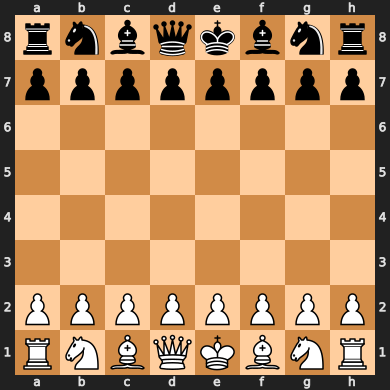

In [ ]:
predictPieceType(piece_model, 'rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

1/1 [==============================] - 0s 21ms/step
p 0.6153991
r 0.00069739873
n 0.32771492
b 0.026132481
q 0.0037315413
k 0.026324585


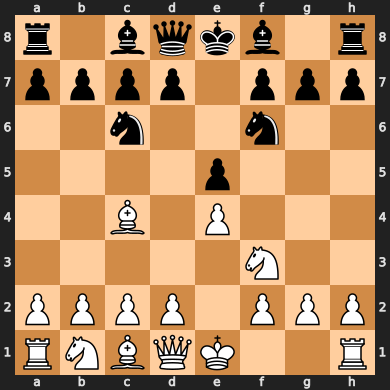

In [ ]:
predictPieceType(piece_model, 'r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

1/1 [==============================] - 0s 22ms/step
p 0.04668576
r 0.15884401
n 0.6354518
b 0.1255697
q 0.0002790061
k 0.033169754


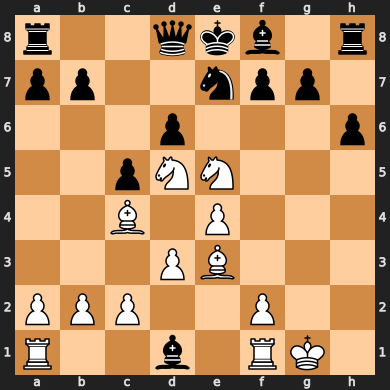

In [ ]:
predictPieceType(piece_model, 'r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

1/1 [==============================] - 0s 21ms/step
p 0.5360683
r 0.0286779
n 0.002341362
b 0.005022979
q 0.0032060663
k 0.42468336


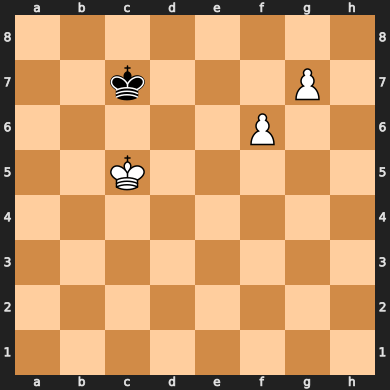

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 22ms/step
p 0.052433927
r 0.048323568
n 0.010603138
b 0.019802546
q 0.0025991742
k 0.8662377


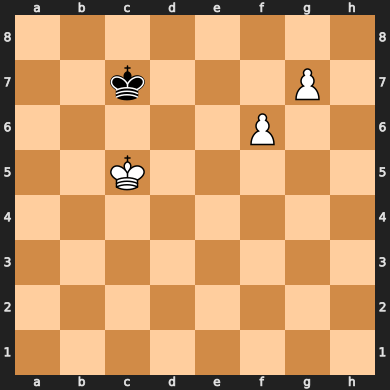

In [ ]:
predictPieceType(piece_model, '8/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

1/1 [==============================] - 0s 18ms/step
p 0.40773576
r 0.04039719
n 0.0039978954
b 0.007324867
q 0.0030357123
k 0.5375085


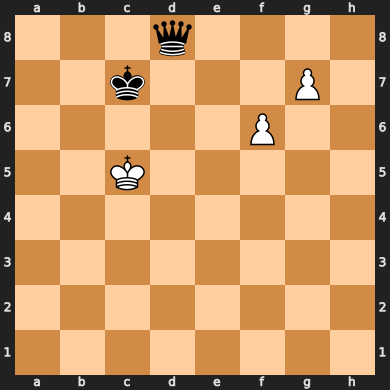

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

1/1 [==============================] - 0s 20ms/step
p 0.026818113
r 0.023214897
n 0.004153462
b 0.019021027
q 0.5924405
k 0.33435208


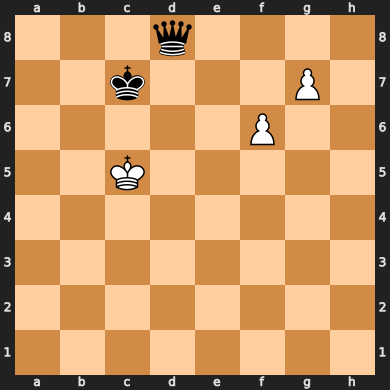

In [ ]:
predictPieceType(piece_model, '3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

### Train and test pawn move model

In [ ]:
pP_X_train, pP_y_train = loadObj('pP_X_train_EricRosen_30000'), loadObj('pP_y_train_EricRosen_30000')
pP_X_test, pP_y_test = loadObj('pP_X_test_EricRosen_30000'), loadObj('pP_y_test_EricRosen_30000')

Loading object from pP_X_train_EricRosen_30000
Loading object from pP_y_train_EricRosen_30000
Loading object from pP_X_test_EricRosen_30000
Loading object from pP_y_test_EricRosen_30000


In [ ]:
pP_X_train = np.reshape(pP_X_train, (len(pP_X_train), 6,8,8))
pP_X_test = np.reshape(pP_X_test, (len(pP_X_test), 6,8,8))

In [ ]:
from tensorflow.keras import models

pMove_model = models.load_model('pMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

pMove_model.fit(
  pP_X_train, pP_y_train,
  validation_data=((pP_X_test, pP_y_test)),
  callbacks=[earlyStopping],
  batch_size=256,
  epochs=50,
  verbose=1,
)
pMove_model.save('pMove_model_EricRosen.keras')

Epoch 1/50
1028/1028 [==============================] - 10s 7ms/step - loss: 0.9723 - sparse_categorical_accuracy: 0.6585 - sparse_top_k_categorical_accuracy: 0.9718 - val_loss: 1.0069 - val_sparse_categorical_accuracy: 0.6482 - val_sparse_top_k_categorical_accuracy: 0.9700
Epoch 2/50
1028/1028 [==============================] - 6s 6ms/step - loss: 0.9202 - sparse_categorical_accuracy: 0.6756 - sparse_top_k_categorical_accuracy: 0.9752 - val_loss: 0.9948 - val_sparse_categorical_accuracy: 0.6514 - val_sparse_top_k_categorical_accuracy: 0.9713
Epoch 3/50
1028/1028 [==============================] - 6s 6ms/step - loss: 0.8970 - sparse_categorical_accuracy: 0.6834 - sparse_top_k_categorical_accuracy: 0.9767 - val_loss: 0.9999 - val_sparse_categorical_accuracy: 0.6531 - val_sparse_top_k_categorical_accuracy: 0.9710
Epoch 4/50
1028/1028 [==============================] - 6s 6ms/step - loss: 0.8796 - sparse_categorical_accuracy: 0.6887 - sparse_top_k_categorical_accuracy: 0.9779 - val_loss: 

### Train and test rook move model

In [ ]:
pR_X_train, pR_y_train = loadObj('pR_X_train_EricRosen_30000'), loadObj('pR_y_train_EricRosen_30000')
pR_X_test, pR_y_test = loadObj('pR_X_test_EricRosen_30000'), loadObj('pR_y_test_EricRosen_30000')

pR_X_train = np.reshape(pR_X_train, (len(pR_X_train), 6,8,8))
pR_X_test = np.reshape(pR_X_test, (len(pR_X_test), 6,8,8))

Loading object from pR_X_train_EricRosen_30000
Loading object from pR_y_train_EricRosen_30000
Loading object from pR_X_test_EricRosen_30000
Loading object from pR_y_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models, callbacks

rMove_model = models.load_model('rMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

rMove_model.fit(
  pR_X_train, pR_y_train,
  validation_data=((pR_X_test, pR_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
rMove_model.save('rMove_model_EricRosen.keras')

Epoch 1/50
669/669 [==============================] - 6s 6ms/step - loss: 1.5736 - sparse_categorical_accuracy: 0.5001 - sparse_top_k_categorical_accuracy: 0.8777 - val_loss: 1.5144 - val_sparse_categorical_accuracy: 0.5161 - val_sparse_top_k_categorical_accuracy: 0.8880
Epoch 2/50
669/669 [==============================] - 4s 5ms/step - loss: 1.4145 - sparse_categorical_accuracy: 0.5446 - sparse_top_k_categorical_accuracy: 0.9048 - val_loss: 1.5201 - val_sparse_categorical_accuracy: 0.5185 - val_sparse_top_k_categorical_accuracy: 0.8881
Epoch 3/50
669/669 [==============================] - 3s 5ms/step - loss: 1.3013 - sparse_categorical_accuracy: 0.5777 - sparse_top_k_categorical_accuracy: 0.9215 - val_loss: 1.5681 - val_sparse_categorical_accuracy: 0.5149 - val_sparse_top_k_categorical_accuracy: 0.8860
Epoch 4/50
669/669 [==============================] - 3s 5ms/step - loss: 1.2016 - sparse_categorical_accuracy: 0.6059 - sparse_top_k_categorical_accuracy: 0.9350 - val_loss: 1.5645 - 

### Train and test knight move model

In [ ]:
pN_X_train, pN_y_train = loadObj('pN_X_train_EricRosen_30000'), loadObj('pN_y_train_EricRosen_30000')
pN_X_test, pN_y_test = loadObj('pN_X_test_EricRosen_30000'), loadObj('pN_y_test_EricRosen_30000')

pN_X_train = np.reshape(pN_X_train, (len(pN_X_train), 6,8,8))
pN_X_test = np.reshape(pN_X_test, (len(pN_X_test), 6,8,8))

Loading object from pN_X_train_EricRosen_30000
Loading object from pN_y_train_EricRosen_30000
Loading object from pN_X_test_EricRosen_30000
Loading object from pN_y_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models

nMove_model = models.load_model('nMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

nMove_model.fit(
  pN_X_train, pN_y_train,
  validation_data=(pN_X_test, pN_y_test),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
nMove_model.save('nMove_model_EricRosen.keras')

Epoch 1/50
648/648 [==============================] - 4s 5ms/step - loss: 0.8580 - sparse_categorical_accuracy: 0.6919 - sparse_top_k_categorical_accuracy: 0.9834 - val_loss: 0.8584 - val_sparse_categorical_accuracy: 0.6902 - val_sparse_top_k_categorical_accuracy: 0.9840
Epoch 2/50
648/648 [==============================] - 3s 4ms/step - loss: 0.7710 - sparse_categorical_accuracy: 0.7223 - sparse_top_k_categorical_accuracy: 0.9870 - val_loss: 0.8552 - val_sparse_categorical_accuracy: 0.6963 - val_sparse_top_k_categorical_accuracy: 0.9842
Epoch 3/50
648/648 [==============================] - 3s 4ms/step - loss: 0.7219 - sparse_categorical_accuracy: 0.7396 - sparse_top_k_categorical_accuracy: 0.9893 - val_loss: 0.8603 - val_sparse_categorical_accuracy: 0.6987 - val_sparse_top_k_categorical_accuracy: 0.9838
Epoch 4/50
648/648 [==============================] - 3s 4ms/step - loss: 0.6806 - sparse_categorical_accuracy: 0.7550 - sparse_top_k_categorical_accuracy: 0.9905 - val_loss: 0.8772 - 

### Train and test bishop move model

In [ ]:
pB_X_train, pB_y_train = loadObj('pB_X_train_EricRosen_30000'), loadObj('pB_y_train_EricRosen_30000')
pB_X_test, pB_y_test = loadObj('pB_X_test_EricRosen_30000'), loadObj('pB_y_test_EricRosen_30000')

pB_X_train = np.reshape(pB_X_train, (len(pB_X_train), 6,8,8))
pB_X_test = np.reshape(pB_X_test, (len(pB_X_test), 6,8,8))

Loading object from pB_X_train_EricRosen_30000
Loading object from pB_y_train_EricRosen_30000
Loading object from pB_X_test_EricRosen_30000
Loading object from pB_y_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models

bMove_model = models.load_model('bMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

bMove_model.fit(
  pB_X_train, pB_y_train,
  validation_data=((pB_X_test, pB_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
bMove_model.save('bMove_model_EricRosen.keras')

Epoch 1/50
586/586 [==============================] - 4s 6ms/step - loss: 1.0912 - sparse_categorical_accuracy: 0.6204 - sparse_top_k_categorical_accuracy: 0.9590 - val_loss: 1.0749 - val_sparse_categorical_accuracy: 0.6221 - val_sparse_top_k_categorical_accuracy: 0.9632
Epoch 2/50
586/586 [==============================] - 3s 5ms/step - loss: 0.9584 - sparse_categorical_accuracy: 0.6649 - sparse_top_k_categorical_accuracy: 0.9703 - val_loss: 1.0644 - val_sparse_categorical_accuracy: 0.6312 - val_sparse_top_k_categorical_accuracy: 0.9644
Epoch 3/50
586/586 [==============================] - 3s 5ms/step - loss: 0.8746 - sparse_categorical_accuracy: 0.6939 - sparse_top_k_categorical_accuracy: 0.9763 - val_loss: 1.0819 - val_sparse_categorical_accuracy: 0.6280 - val_sparse_top_k_categorical_accuracy: 0.9633
Epoch 4/50
586/586 [==============================] - 3s 5ms/step - loss: 0.8077 - sparse_categorical_accuracy: 0.7180 - sparse_top_k_categorical_accuracy: 0.9811 - val_loss: 1.1010 - 

### Train and test queen move model

In [ ]:
pQ_X_train, pQ_y_train = loadObj('pQ_X_train_EricRosen_30000'), loadObj('pQ_y_train_EricRosen_30000')
pQ_X_test, pQ_y_test = loadObj('pQ_X_test_EricRosen_30000'), loadObj('pQ_y_test_EricRosen_30000')

pQ_X_train = np.reshape(pQ_X_train, (len(pQ_X_train), 6,8,8))
pQ_X_test = np.reshape(pQ_X_test, (len(pQ_X_test), 6,8,8))

Loading object from pQ_X_train_EricRosen_30000
Loading object from pQ_y_train_EricRosen_30000
Loading object from pQ_X_test_EricRosen_30000
Loading object from pQ_y_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models

qMove_model = models.load_model('qMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

qMove_model.fit(
  pQ_X_train, pQ_y_train,
  validation_data=((pQ_X_test, pQ_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
qMove_model.save('qMove_model_EricRosen.keras')

Epoch 1/50
469/469 [==============================] - 5s 6ms/step - loss: 1.5974 - sparse_categorical_accuracy: 0.4968 - sparse_top_k_categorical_accuracy: 0.8758 - val_loss: 1.5829 - val_sparse_categorical_accuracy: 0.4951 - val_sparse_top_k_categorical_accuracy: 0.8791
Epoch 2/50
469/469 [==============================] - 2s 5ms/step - loss: 1.4063 - sparse_categorical_accuracy: 0.5499 - sparse_top_k_categorical_accuracy: 0.9047 - val_loss: 1.5534 - val_sparse_categorical_accuracy: 0.5049 - val_sparse_top_k_categorical_accuracy: 0.8878
Epoch 3/50
469/469 [==============================] - 2s 5ms/step - loss: 1.2720 - sparse_categorical_accuracy: 0.5895 - sparse_top_k_categorical_accuracy: 0.9223 - val_loss: 1.5885 - val_sparse_categorical_accuracy: 0.5005 - val_sparse_top_k_categorical_accuracy: 0.8838
Epoch 4/50
469/469 [==============================] - 2s 5ms/step - loss: 1.1531 - sparse_categorical_accuracy: 0.6245 - sparse_top_k_categorical_accuracy: 0.9384 - val_loss: 1.6044 - 

### Train and test king move model

In [ ]:
pK_X_train, pK_y_train = loadObj('pK_X_train_EricRosen_30000'), loadObj('pK_y_train_EricRosen_30000')
pK_X_test, pK_y_test = loadObj('pK_X_test_EricRosen_30000'), loadObj('pK_y_test_EricRosen_30000')

pK_X_train = np.reshape(pK_X_train, (len(pK_X_train), 6,8,8))
pK_X_test = np.reshape(pK_X_test, (len(pK_X_test), 6,8,8))

Loading object from pK_X_train_EricRosen_30000
Loading object from pK_y_train_EricRosen_30000
Loading object from pK_X_test_EricRosen_30000
Loading object from pK_y_test_EricRosen_30000


In [ ]:
from tensorflow.keras import models

kMove_model = models.load_model('kMove_model.keras')

earlyStopping = callbacks.EarlyStopping(
    patience=5,
    min_delta=0.001,
    monitor='val_sparse_categorical_accuracy',
    restore_best_weights=True,
)

kMove_model.fit(
  pK_X_train, pK_y_train,
  validation_data=((pK_X_test, pK_y_test)),
  callbacks=[earlyStopping],
  batch_size=250,
  epochs=50,
  verbose=1,
)
kMove_model.save('kMove_model_EricRosen.keras')

Epoch 1/50
608/608 [==============================] - 4s 5ms/step - loss: 0.8456 - sparse_categorical_accuracy: 0.6639 - sparse_top_k_categorical_accuracy: 0.9928 - val_loss: 0.8183 - val_sparse_categorical_accuracy: 0.6748 - val_sparse_top_k_categorical_accuracy: 0.9944
Epoch 2/50
608/608 [==============================] - 3s 5ms/step - loss: 0.7741 - sparse_categorical_accuracy: 0.6930 - sparse_top_k_categorical_accuracy: 0.9945 - val_loss: 0.8290 - val_sparse_categorical_accuracy: 0.6678 - val_sparse_top_k_categorical_accuracy: 0.9936
Epoch 3/50
608/608 [==============================] - 3s 5ms/step - loss: 0.7260 - sparse_categorical_accuracy: 0.7149 - sparse_top_k_categorical_accuracy: 0.9958 - val_loss: 0.8040 - val_sparse_categorical_accuracy: 0.6854 - val_sparse_top_k_categorical_accuracy: 0.9945
Epoch 4/50
608/608 [==============================] - 3s 5ms/step - loss: 0.6842 - sparse_categorical_accuracy: 0.7320 - sparse_top_k_categorical_accuracy: 0.9961 - val_loss: 0.8319 - 

### Test "macro-model"



In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model_EricRosen.keras')
pMove_model = models.load_model('pMove_model_EricRosen.keras')
rMove_model = models.load_model('rMove_model_EricRosen.keras')
nMove_model = models.load_model('nMove_model_EricRosen.keras')
bMove_model = models.load_model('bMove_model_EricRosen.keras')
qMove_model = models.load_model('qMove_model_EricRosen.keras')
kMove_model = models.load_model('kMove_model_EricRosen.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess
import chess.svg
import IPython

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def predictMove(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  arrows = []
  colors = ["#000000", "#424242", "#616161", "#757575", "#9E9E9E"]
  for i, prediction in enumerate(predictions[:5]):
    pred, move = prediction
    arrows.append(chess.svg.Arrow(move.from_square,move.to_square, color=colors[i]))

    if verbose:
      print(f'Move {move.uci()}: {pred}')

  display(IPython.display.HTML(chess.svg.board(
      correctedBoard,
      arrows=arrows,
      size=300,
  )))

In [ ]:
predictMove('rnbqkbnr/pppppppp/8/8/8/8/PPPPPPPP/RNBQKBNR w KQkq - 0 1')

Move d2d4: 0.6538692116737366
Move e2e4: 0.2786637246608734
Move c2c4: 0.02069593034684658
Move d2d3: 0.009758207015693188
Move g1f3: 0.008668961934745312


In [ ]:
predictMove('r1bqkb1r/pppp1ppp/2n2n2/4p3/2B1P3/5N2/PPPP1PPP/RNBQK2R w KQkq - 4 4')

Move d2d4: 0.30548664927482605
Move d2d3: 0.2624318599700928
Move b1c3: 0.19227126240730286
Move f3g5: 0.09210682660341263
Move f3e5: 0.04257374629378319


In [ ]:
predictMove('8/2k3P1/5P2/2K5/8/8/8/8 w - - 0 1')

Move f6f7: 0.3900797963142395
Move c5b5: 0.17794375121593475
Move c5d5: 0.1598532795906067
Move g7g8q: 0.1311754435300827
Move g7g8r: 0.1311754435300827


In [ ]:
predictMove('3q4/2k3P1/5P2/2K5/8/8/8/8 b - - 0 1')

Move d1d3: 0.4327700436115265
Move c2d2: 0.2135421186685562
Move c2b2: 0.09289337694644928
Move d1d2: 0.033179618418216705
Move d1d4: 0.029727282002568245


In [ ]:
predictMove('r2qkb1r/pp2npp1/3p3p/2pNN3/2B1P3/3PB3/PPP2P2/R2b1RK1 w kq - 0 13')

Move e5f7: 0.5583802461624146
Move f1d1: 0.15842390060424805
Move a1d1: 0.15842390060424805
Move e3f4: 0.07025795429944992
Move c4b5: 0.05047592520713806


In [ ]:
import chess.pgn

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    predictMove(node.parent.board().fen(), verbose=False)

### Get "macro-model" accuracy (with only valid moves)

In [ ]:
from tensorflow.keras import models

piece_model = models.load_model('piece_model_EricRosen.keras')
pMove_model = models.load_model('pMove_model_EricRosen.keras')
rMove_model = models.load_model('rMove_model_EricRosen.keras')
nMove_model = models.load_model('nMove_model_EricRosen.keras')
bMove_model = models.load_model('bMove_model_EricRosen.keras')
qMove_model = models.load_model('qMove_model_EricRosen.keras')
kMove_model = models.load_model('kMove_model_EricRosen.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

In [ ]:
!pip install chess

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.4/154.4 kB 2.8 MB/s eta 0:00:00


In [ ]:
from chess import PAWN, ROOK, KNIGHT, BISHOP, QUEEN, KING
import chess

def getBitboard(board, piece):
  wP, bP = board.pieces(piece, chess.WHITE).tolist(), board.pieces(piece, chess.BLACK).tolist()
  p = []
  for i in range(64):
    p.append(wP[i]*1 + bP[i]*-1)

  return p

def getPrediction(fen, verbose=True):
  board = chess.Board(fen)
  assert board is not None
  correctedBoard = board if board.turn == chess.WHITE else board.mirror()
  p, r, n = getBitboard(correctedBoard, PAWN), getBitboard(correctedBoard, ROOK), getBitboard(correctedBoard, KNIGHT)
  b, q, k = getBitboard(correctedBoard, BISHOP), getBitboard(correctedBoard, QUEEN), getBitboard(correctedBoard, KING)
  X = np.array([p, r, n, b, q, k])
  X = np.reshape(X, (1,6,8,8))

  piecePred = piece_model.predict(X, verbose=0)[0]
  pPred = pMove_model.predict(X, verbose=0)[0]
  rPred = rMove_model.predict(X, verbose=0)[0]
  nPred = nMove_model.predict(X, verbose=0)[0]
  bPred = bMove_model.predict(X, verbose=0)[0]
  qPred = qMove_model.predict(X, verbose=0)[0]
  kPred = kMove_model.predict(X, verbose=0)[0]

  predictions = []
  for move in correctedBoard.legal_moves:
    from_sq, to_sq = move.from_square, move.to_square
    pieceSym = correctedBoard.piece_at(from_sq).symbol().lower()
    iPred = eval(f'{pieceSym}Pred')
    predictions.append((piecePred[pieceMap[pieceSym]] * iPred[to_sq], move))

  predictions.sort(key=lambda p:p[0],reverse=True)
  return [move for _, move in predictions]

In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)
  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPrediction(board.fen(), verbose=False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.3085
Top 5 Accuracy: 0.6702
Top 10 Accuracy: 0.8191
Top 20 Accuracy: 0.9681


In [ ]:
import chess.pgn

correct = top5Correct = top10Correct = top20Correct = total = 0
targetUsername = 'EricRosen'

with open('EricRosen_white_test.pgn', "r") as pgnFile:
  game = chess.pgn.read_game(pgnFile)

  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()
    if playerColor != board.turn:
      continue

    pred = getPrediction(board.fen(), verbose=False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square))
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0

    total += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

Accuracy: 0.3617
Top 5 Accuracy: 0.7872
Top 10 Accuracy: 0.8511
Top 20 Accuracy: 1.0


### Test model with 1000 recent games

In [ ]:
!pip install python-lichess
!pip install chess

In [ ]:
import chess.pgn
import lichess.api
from tqdm import tqdm
from lichess.format import PYCHESS
from tensorflow.keras import models, callbacks

piece_model = models.load_model('piece_model.keras')
pMove_model = models.load_model('pMove_model.keras')
rMove_model = models.load_model('rMove_model.keras')
nMove_model = models.load_model('nMove_model.keras')
bMove_model = models.load_model('bMove_model.keras')
qMove_model = models.load_model('qMove_model.keras')
kMove_model = models.load_model('kMove_model.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

targetUsername = 'EricRosen'
gamesSince2024 = [game for game in lichess.api.user_games(targetUsername, max=1000, format=PYCHESS, since=1704085200000, auth='lip_K8zvEJO0bakiukMxtSSx')]

correct_EricRosen = top5Correct_EricRosen = top10Correct_EricRosen = top20Correct_EricRosen = total_EricRosen = 0
correct = top5Correct = top10Correct = top20Correct = total = 0

for game in tqdm(gamesSince2024[:20]):
  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPrediction(board.fen(), False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square), move.promotion, move.drop)
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0
    total += 1

    if playerColor == board.turn:
      correct_EricRosen += 1 if correctedMove == pred[0] else 0
      top5Correct_EricRosen += 1 if correctedMove in pred[:5] else 0
      top10Correct_EricRosen += 1 if correctedMove in pred[:10] else 0
      top20Correct_EricRosen += 1 if correctedMove in pred[:20] else 0
      total_EricRosen += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

print('Accuracy for Eric Rosen:', round(correct_EricRosen/total_EricRosen, 4))
print('Top 5 Accuracy for Eric Rosen:', round(top5Correct_EricRosen/total_EricRosen, 4))
print('Top 10 Accuracy for Eric Rosen:', round(top10Correct_EricRosen/total_EricRosen, 4))
print('Top 20 Accuracy for Eric Rosen:', round(top20Correct_EricRosen/total_EricRosen, 4))

100%|██████████| 20/20 [15:21<00:00, 46.07s/it]

Accuracy: 0.3256
Top 5 Accuracy: 0.722
Top 10 Accuracy: 0.8735
Top 20 Accuracy: 0.9698
Accuracy for Eric Rosen: 0.3268
Top 5 Accuracy for Eric Rosen: 0.7126
Top 10 Accuracy for Eric Rosen: 0.8598
Top 20 Accuracy for Eric Rosen: 0.9652


In [ ]:
import chess.pgn
import lichess.api
from tqdm import tqdm
from lichess.format import PYCHESS
from tensorflow.keras import models, callbacks

piece_model = models.load_model('piece_model_EricRosen.keras')
pMove_model = models.load_model('pMove_model_EricRosen.keras')
rMove_model = models.load_model('rMove_model_EricRosen.keras')
nMove_model = models.load_model('nMove_model_EricRosen.keras')
bMove_model = models.load_model('bMove_model_EricRosen.keras')
qMove_model = models.load_model('qMove_model_EricRosen.keras')
kMove_model = models.load_model('kMove_model_EricRosen.keras')

pieceList = ['p', 'r', 'n', 'b', 'q', 'k']
pieceMap = {}
for i, piece in enumerate(pieceList):
  pieceMap[piece] = i

targetUsername = 'EricRosen'
gamesSince2024 = [game for game in lichess.api.user_games(targetUsername, max=1000, format=PYCHESS, since=1704085200000, auth='lip_K8zvEJO0bakiukMxtSSx')]

correct_EricRosen = top5Correct_EricRosen = top10Correct_EricRosen = top20Correct_EricRosen = total_EricRosen = 0
correct = top5Correct = top10Correct = top20Correct = total = 0

for game in tqdm(gamesSince2024[:20]):
  if game.headers['White'] == targetUsername:
    playerColor = chess.WHITE
  elif game.headers['Black'] == targetUsername:
    playerColor = chess.BLACK
  else:
    print(game.headers['White'], game.headers['Black'])
    assert False

  for node in game.mainline():
    move, board = node.move, node.parent.board()

    pred = getPrediction(board.fen(), False)

    correctedMove = move if board.turn == chess.WHITE else chess.Move(chess.square_mirror(move.from_square), chess.square_mirror(move.to_square), move.promotion, move.drop)
    assert correctedMove in pred

    correct += 1 if correctedMove == pred[0] else 0
    top5Correct += 1 if correctedMove in pred[:5] else 0
    top10Correct += 1 if correctedMove in pred[:10] else 0
    top20Correct += 1 if correctedMove in pred[:20] else 0
    total += 1

    if playerColor == board.turn:
      correct_EricRosen += 1 if correctedMove == pred[0] else 0
      top5Correct_EricRosen += 1 if correctedMove in pred[:5] else 0
      top10Correct_EricRosen += 1 if correctedMove in pred[:10] else 0
      top20Correct_EricRosen += 1 if correctedMove in pred[:20] else 0
      total_EricRosen += 1

print('Accuracy:', round(correct/total, 4))
print('Top 5 Accuracy:', round(top5Correct/total, 4))
print('Top 10 Accuracy:', round(top10Correct/total, 4))
print('Top 20 Accuracy:', round(top20Correct/total, 4))

print('Accuracy for Eric Rosen:', round(correct_EricRosen/total_EricRosen, 4))
print('Top 5 Accuracy for Eric Rosen:', round(top5Correct_EricRosen/total_EricRosen, 4))
print('Top 10 Accuracy for Eric Rosen:', round(top10Correct_EricRosen/total_EricRosen, 4))
print('Top 20 Accuracy for Eric Rosen:', round(top20Correct_EricRosen/total_EricRosen, 4))

100%|██████████| 20/20 [16:19<00:00, 48.98s/it]

Accuracy: 0.3407
Top 5 Accuracy: 0.7295
Top 10 Accuracy: 0.8706
Top 20 Accuracy: 0.9663
Accuracy for Eric Rosen: 0.343
Top 5 Accuracy for Eric Rosen: 0.7277
Top 10 Accuracy for Eric Rosen: 0.8725
Top 20 Accuracy for Eric Rosen: 0.9687


### Save architecutre image

In [ ]:
plotModelArchitecture(['piece_model', 'pMove_model', 'rMove_model',
                       'nMove_model', 'bMove_model', 'qMove_model', 'kMove_model'])